# 导入数据

In [25]:
import pandas as pd

# 读取 Excel 中两个 sheet
file_path = 'food size dataset final revised.xlsx'

# Prey 数据为主
df_prey = pd.read_excel(file_path, sheet_name='Prey data')

# 鸟类数据（AVONET）
df_bird = pd.read_excel(file_path, sheet_name='AVONET3_BT - 2024')

# 合并数据，主键为 Species.BirdTree，左连接保留 Prey 数据为主
df = pd.merge(df_prey, df_bird, on='Species.BirdTree', how='left')

# 快速预览合并后数据
print(df.shape)
print(df.columns)
df.head()

(1672, 52)
Index(['Species.BirdTree', 'Species.eBird.avonet', 'Size', 'Size.Type',
       'Size.trait', 'Prey_Phylum', 'Prey_Class', 'Prey_Order', 'Prey_Family',
       'Prey_Genus', 'Prey_Scientific_Name', 'Prey_Stage', 'Prey_Strength',
       'Prey.lat', 'Prey.long', 'Prey.country', 'Observer', 'Source.prey',
       'Source.prey.size', 'Supporting.image', 'Notes', 'Family3', 'Order3',
       'Beak.Length_Culmen', 'Beak.Length_Nares', 'Beak.Width', 'Beak.Depth',
       'Tarsus.Length', 'Wing.Length', 'Kipps.Distance', 'Secondary1',
       'Hand.Wing.Index', 'Tail.Length', 'Mass', 'Mass.Source',
       'Mass.Refs.Other', 'Inference', 'Traits.inferred', 'Reference.species',
       'Habitat', 'Habitat.Density', 'Migration', 'Trophic.Level',
       'Trophic.Niche', 'Primary.Lifestyle', 'Min.Latitude', 'Max.Latitude',
       'Complete.Latitude', 'Centroid.Longitude', 'Range.Size',
       'Species.Status', 'Updated.2024'],
      dtype='object')


,Species.BirdTree,Species.eBird.avonet,Size,Size.Type,Size.trait,Prey_Phylum,Prey_Class,Prey_Order,Prey_Family,Prey_Genus,...,Trophic.Level,Trophic.Niche,Primary.Lifestyle,Min.Latitude,Max.Latitude,Complete.Latitude,Centroid.Longitude,Range.Size,Species.Status,Updated.2024
0,Abroscopus schisticeps,Abroscopus schisticeps,22.0,1,Body_length,Arthropoda,Insecta,Lepidoptera,NaN,NaN,...,Carnivore,Invertivore,Insessorial,20.19,31.12,26.70,95.58,909217.05,Extant,NaN
1,Abroscopus superciliaris,Abroscopus superciliaris,35.0,1,Body_length,Arthropoda,Insecta,NaN,NaN,NaN,...,Carnivore,Invertivore,Insessorial,-8.11,28.81,9.89,105.20,2493437.47,Extant,NaN
2,Acanthisitta chloris,Acanthisitta chloris,12.0,1,Body_length,Arthropoda,Insecta,Orthoptera,NaN,NaN,...,Carnivore,Invertivore,Insessorial,-47.28,-35.38,-42.25,172.19,152503.84,Extant,NaN
3,Acanthiza apicalis,Acanthiza apicalis,12.0,1,Body_length,Arthropoda,Insecta,Lepidoptera,NaN,NaN,...,Carnivore,Invertivore,Insessorial,-36.00,-16.78,-27.63,131.95,4124270.80,Extant,NaN
4,Acanthiza chrysorrhoa,Acanthiza chrysorrhoa,22.5,1,Body_length,Arthropoda,Insecta,Orthoptera,NaN,NaN,...,Carnivore,Invertivore,Terrestrial,-43.64,-18.56,-28.80,136.41,4590956.34,Extant,NaN


# log 转换

In [26]:
import numpy as np

# 1. 计算派生变量（用更短列名可选简化）
df['Beak_volume'] = (df['Beak.Length_Culmen'] * df['Beak.Width'] * df['Beak.Depth']) / 3
df['Prey_rel_length'] = df['Size'] / (df['Mass'] ** (1/3))
df['Beak_rel_length'] = df['Beak.Length_Culmen'] / (df['Mass'] ** (1/3))
df['Beak_length_depth_ratio'] = df['Beak.Length_Culmen'] / df['Beak.Depth']
df['Beak_gape'] = df['Beak.Width'] * df['Beak.Depth']

# 新增：相对体积
df['Beak_rel_volume'] = df['Beak_volume'] / (df['Mass'] ** (1/3))

# 2. 对长度类变量做 log 转换（避免负无穷 & 0 值）
# 这里使用 np.log1p(x) = log(1 + x) 更稳健
log_vars = ['Size', 'Beak_volume', 'Prey_rel_length','Beak.Length_Culmen' ,'Beak_rel_length','Beak.Width','Beak.Depth',
            'Beak_length_depth_ratio', 'Beak_gape', 'Beak_rel_volume']  # 新增Beak_rel_volume

for var in log_vars:
    df['log_' + var] = np.log1p(df[var])

print(df.columns)


Index(['Species.BirdTree', 'Species.eBird.avonet', 'Size', 'Size.Type',
       'Size.trait', 'Prey_Phylum', 'Prey_Class', 'Prey_Order', 'Prey_Family',
       'Prey_Genus', 'Prey_Scientific_Name', 'Prey_Stage', 'Prey_Strength',
       'Prey.lat', 'Prey.long', 'Prey.country', 'Observer', 'Source.prey',
       'Source.prey.size', 'Supporting.image', 'Notes', 'Family3', 'Order3',
       'Beak.Length_Culmen', 'Beak.Length_Nares', 'Beak.Width', 'Beak.Depth',
       'Tarsus.Length', 'Wing.Length', 'Kipps.Distance', 'Secondary1',
       'Hand.Wing.Index', 'Tail.Length', 'Mass', 'Mass.Source',
       'Mass.Refs.Other', 'Inference', 'Traits.inferred', 'Reference.species',
       'Habitat', 'Habitat.Density', 'Migration', 'Trophic.Level',
       'Trophic.Niche', 'Primary.Lifestyle', 'Min.Latitude', 'Max.Latitude',
       'Complete.Latitude', 'Centroid.Longitude', 'Range.Size',
       'Species.Status', 'Updated.2024', 'Beak_volume', 'Prey_rel_length',
       'Beak_rel_length', 'Beak_length_depth_r

# 系统发育树

In [6]:
from pathlib import Path
import pandas as pd
import numpy as np
import zipfile
import tempfile
import shutil
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os

BASE_DIR = Path(os.getcwd()).resolve()
print(f"Base dir: {BASE_DIR}")

EXCEL_FILE = BASE_DIR / "food size dataset final6.xlsx"
TREE_ZIP_PATH = BASE_DIR / "tree-pruner-754bbacf-419b-4753-8677-f2b1cc50df49.zip"
OUTPUT_DIR = BASE_DIR / "results_phylogram"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"Base dir: {BASE_DIR}")
print(f"Excel path: {EXCEL_FILE}")
print(f"Zip tree path: {TREE_ZIP_PATH}")
print(f"Output dir: {OUTPUT_DIR}")


Base dir: D:\work\其他人的工作\lyn
Base dir: D:\work\其他人的工作\lyn
Excel path: D:\work\其他人的工作\lyn\food size dataset final6.xlsx
Zip tree path: D:\work\其他人的工作\lyn\tree-pruner-754bbacf-419b-4753-8677-f2b1cc50df49.zip
Output dir: D:\work\其他人的工作\lyn\results_phylogram


In [8]:
prey = pd.read_excel(EXCEL_FILE, sheet_name="Prey data", engine="openpyxl")
strength_rank = {"weak": 1, "medium": 2, "strong": 3}

prey["Prey_Strength_str"] = prey["Prey_Strength"].astype(str).str.strip().str.lower()
prey["StrengthScore"] = prey["Prey_Strength_str"].map(strength_rank)
prey["Size_num"] = pd.to_numeric(prey["Size"], errors="coerce")

prey_clean = prey.dropna(subset=["StrengthScore", "Size_num"]).copy()


In [9]:
longest_only = prey_clean.sort_values(
    by=["Species.BirdTree", "Size_num"], 
    ascending=[True, False]
).drop_duplicates(subset="Species.BirdTree", keep="first").copy()

longest_only["Strength_cat"] = longest_only["Prey_Strength_str"].str.capitalize()

longest_only.to_csv(OUTPUT_DIR / "longest_by_species.csv", index=False, encoding="utf-8-sig")
print(f"最长猎物记录保存完成，共 {len(longest_only)} 个物种。")


最长猎物记录保存完成，共 1222 个物种。


In [15]:
avonet = pd.read_excel(EXCEL_FILE, sheet_name="AVONET3_BT - 2024", engine="openpyxl")

# 转数值
avonet["Beak.Length_Culmen"] = pd.to_numeric(avonet["Beak.Length_Culmen"], errors="coerce")
avonet["Beak.Width"] = pd.to_numeric(avonet["Beak.Width"], errors="coerce")
avonet["Beak.Depth"] = pd.to_numeric(avonet["Beak.Depth"], errors="coerce")

avonet["BeakVolume"] = (avonet["Beak.Length_Culmen"] *
                        avonet["Beak.Width"] *
                        avonet["Beak.Depth"]) / 3.0

# 提取需要列，包括 Family3 和 Trophic.Niche
avonet_small = avonet[[
    "Species.BirdTree", "BeakVolume", "Family3", "Trophic.Niche",
"Order3"]].copy()


In [16]:
def build_traits(prey_df, avonet_small, output_path):
    traits = prey_df.merge(avonet_small, on="Species.BirdTree", how="left")
    traits = traits.dropna(subset=["BeakVolume"]).copy()
    
    traits["log10_BeakVolume"] = np.log10(traits["BeakVolume"].astype(float))
    traits["log10_PreySize"] = np.log10(traits["Size"].astype(float))
    
    # 清理 label
    def clean_label(name):
        if pd.isna(name):
            return np.nan
        s = str(name).strip().replace(".", " ")
        toks = [t for t in s.split() if t != ""]
        if len(toks) < 2:
            return np.nan
        genus = toks[0].capitalize()
        species = toks[1].lower()
        return f"{genus}_{species}"
    
    traits["label"] = traits["Species.BirdTree"].apply(clean_label)
    traits = traits.dropna(subset=["label"]).copy()
    
    # 保存 CSV
    traits.to_csv(output_path, index=False, encoding="utf-8-sig")
    print(f"{output_path.name} 生成完成，共 {len(traits)} 个物种")
    
    return traits

# 生成 traits_cleaned_longest.csv
traits_longest = build_traits(longest_only, avonet_small, OUTPUT_DIR / "traits_cleaned_longest.csv")


traits_cleaned_longest.csv 生成完成，共 1217 个物种


In [17]:
# 最强猎物记录（按 StrengthScore 降序，再按 Size_num 降序）
strongest_only = prey_clean.sort_values(
    by=["Species.BirdTree", "StrengthScore", "Size_num"],
    ascending=[True, False, False]
).drop_duplicates(subset="Species.BirdTree", keep="first").copy()

strongest_only["Strength_cat"] = strongest_only["Prey_Strength_str"].str.capitalize()

# 保存 CSV
strongest_only.to_csv(OUTPUT_DIR / "strongest_by_species.csv", index=False, encoding="utf-8-sig")

print(f"最强猎物记录保存完成，共 {len(strongest_only)} 个物种。结果在 {OUTPUT_DIR}")


最强猎物记录保存完成，共 1222 个物种。结果在 D:\work\其他人的工作\lyn\results_phylogram


In [18]:
def build_traits_strongest(prey_df, avonet_small, output_path):
    """
    构建最强猎物的 traits CSV
    prey_df: strongest_only DataFrame
    avonet_small: 包含 BeakVolume, Family3, Trophic.Niche
    output_path: 输出路径
    """
    traits = prey_df.merge(avonet_small, on="Species.BirdTree", how="left")
    traits = traits.dropna(subset=["BeakVolume"]).copy()
    
    # 连续变量 log10 转换
    traits["log10_BeakVolume"] = np.log10(traits["BeakVolume"].astype(float))
    traits["log10_PreySize"] = np.log10(traits["Size"].astype(float))
    
    # 清理 label
    def clean_label(name):
        if pd.isna(name):
            return np.nan
        s = str(name).strip().replace(".", " ")
        toks = [t for t in s.split() if t != ""]
        if len(toks) < 2:
            return np.nan
        genus = toks[0].capitalize()
        species = toks[1].lower()
        return f"{genus}_{species}"
    
    traits["label"] = traits["Species.BirdTree"].apply(clean_label)
    traits = traits.dropna(subset=["label"]).copy()
    
    # 保存 CSV
    traits.to_csv(output_path, index=False, encoding="utf-8-sig")
    print(f"{output_path.name} 生成完成，共 {len(traits)} 个物种")
    
    return traits

# 调用函数生成 CSV
traits_strongest = build_traits_strongest(
    strongest_only, 
    avonet_small, 
    OUTPUT_DIR / "traits_cleaned_strongest.csv"
)


traits_cleaned_strongest.csv 生成完成，共 1217 个物种


In [19]:
import zipfile
import tempfile

# 创建临时目录
temp_dir = Path(tempfile.mkdtemp(prefix="birdtree_"))
print(f"临时目录：{temp_dir}")

with zipfile.ZipFile(TREE_ZIP_PATH, 'r') as zf:
    nex_files = [f for f in zf.namelist() if f.lower().endswith('.nex')]
    if len(nex_files) == 0:
        raise ValueError("zip 中没有找到 .nex 文件")
    print(f"找到 nexus 文件: {nex_files[0]}")
    zf.extract(nex_files[0], path=temp_dir)

nexus_file = temp_dir / nex_files[0]
print(f"解压到: {nexus_file}")


临时目录：C:\Users\86186\AppData\Local\Temp\birdtree_sdx70huz
找到 nexus 文件: output.nex
解压到: C:\Users\86186\AppData\Local\Temp\birdtree_sdx70huz\output.nex


In [ ]:
import dendropy

newick_file = temp_dir / "converted_tree.tre"
tree = dendropy.Tree.get(path=str(nexus_file), schema="nexus")
tree.write(path=str(newick_file), schema="newick")
print(f"Nexus 转换完成，保存为 {newick_file}")


Nexus 转换完成，保存为 C:\Users\86186\AppData\Local\Temp\birdtree_xj7zbpgd\converted_tree.tre


In [ ]:
tree = Tree(str(newick_file), format=1)
print(f"原树tip数：{len(tree)}")

keep_labels = set(traits["label"].astype(str).unique())
tips_in_tree = set(leaf.name for leaf in tree.iter_leaves())
keep_intersect = list(keep_labels.intersection(tips_in_tree))

print(f"traits物种数: {len(keep_labels)}, 树中tips数: {len(tips_in_tree)}, 匹配tips数: {len(keep_intersect)}")

tree.prune(keep_intersect, preserve_branch_length=True)
print(f"修剪后树tip数：{len(tree)}")

pruned_tree_path = OUTPUT_DIR / "pruned_tree.tre"
tree.write(outfile=str(pruned_tree_path), format=1)
print(f"修剪后的树保存到 {pruned_tree_path}")


原树tip数：1218
traits物种数: 1217, 树中tips数: 1218, 匹配tips数: 1217
修剪后树tip数：1217
修剪后的树保存到 D:\work\其他人的工作\lyn\results_phylogram\pruned_tree.tre


绘制树图，保存为 d:\work\其他人的工作\lyn\results_phylogram\tmp_tree.png
图片保存为: d:\work\其他人的工作\lyn\results_phylogram\phylogram_outer_rings_aligned.png


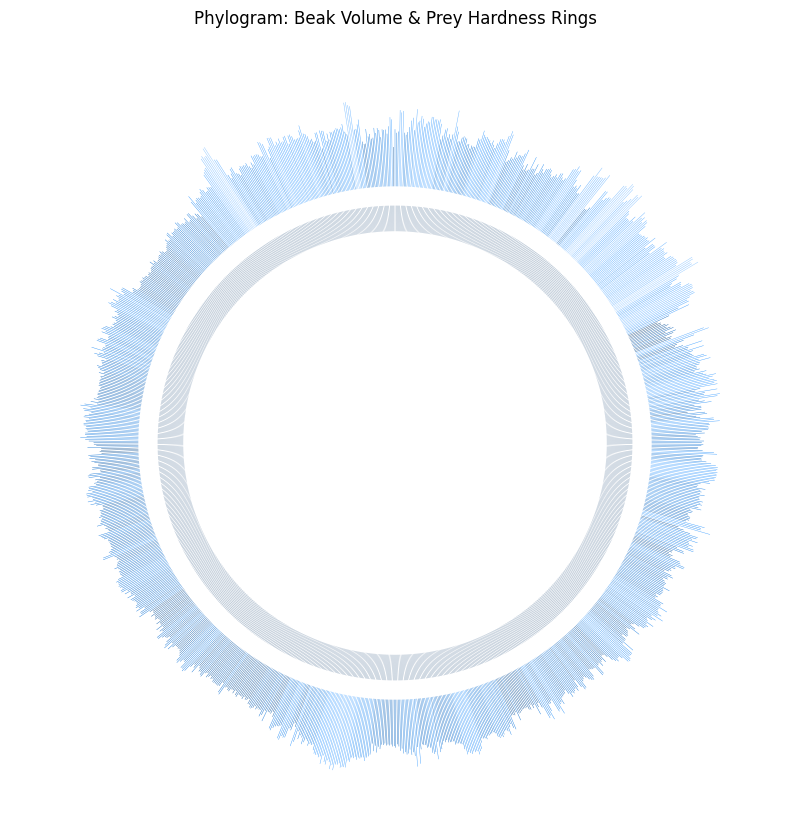

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from ete3 import Tree, TreeStyle
import os

# --- 基础路径 ---
BASE_DIR = Path.cwd()
OUTPUT_DIR = BASE_DIR / "results_phylogram"
OUTPUT_DIR.mkdir(exist_ok=True)

TRAITS_CSV = OUTPUT_DIR / "traits_cleaned.csv"
TREE_FILE = OUTPUT_DIR / "pruned_tree.tre"
TMP_TREE_PNG = OUTPUT_DIR / "tmp_tree.png"

# === 读traits数据 ===
traits = pd.read_csv(TRAITS_CSV, encoding="utf-8-sig")
traits.set_index("label", inplace=True)

# === 读树 ===
tree = Tree(str(TREE_FILE), format=1)

# --- 统一枝长，让叶尖对齐 ---
for node in tree.traverse():
    node.dist = 1.0

# 确保 traits 顺序跟树叶顺序一致
leaf_names = [leaf.name for leaf in tree.iter_leaves()]
traits = traits.loc[leaf_names]

# === 色彩映射 ===
# 只用单一颜色渐变表示 log10_BeakVolume
cmap = mcolors.LinearSegmentedColormap.from_list(
    "beakvol", ["#003366", "#0066CC", "#3399FF", "#66B2FF", "#99CCFF"]
)

vals = traits["log10_BeakVolume"].astype(float)
vmin, vmax = vals.min(), vals.max()
norm = (vals - vmin) / (vmax - vmin)

# ete3 树样式
ts = TreeStyle()
ts.mode = "c"  # 圆形树
ts.show_leaf_name = False  # 不显示叶名
ts.show_scale = False
ts.root_opening_factor = 1.0
ts.rotation = 90
ts.margin_top = ts.margin_left = ts.margin_right = ts.margin_bottom = 20

print(f"绘制树图，保存为 {TMP_TREE_PNG}")
tree.render(str(TMP_TREE_PNG), w=1200, units="px", tree_style=ts, dpi=300)

# 读取png图像
im_tree = plt.imread(str(TMP_TREE_PNG))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, polar=True)
ax.set_theta_direction(-1)  # 顺时针
ax.set_theta_zero_location("N")  # 0度在顶部

N = len(leaf_names)
theta = np.linspace(0, 2 * np.pi, N, endpoint=False)

# 外圈：喙体积条形，更短更窄，颜色深
bar_length_outer = 0.05 + norm * 0.1  # 范围 0.05 ~ 0.15
width_outer = 2 * np.pi / N * 0.25    # 宽度缩小到0.25弧度
colors_outer = [cmap(x) for x in norm]
bars_outer = ax.bar(theta, bar_length_outer, width=width_outer, bottom=1.0, color=colors_outer, edgecolor='none')

# 内圈：硬度用单色环（深蓝色），短条形
bar_length_inner = np.full_like(bar_length_outer, 0.04)
width_inner = width_outer * 0.6
hardness_color = "#003366"  # 深蓝色单色
bars_inner = ax.bar(theta, bar_length_inner, width=width_inner, bottom=1.0 - 0.07, color=hardness_color, edgecolor='none')

# 设置极坐标范围
ax.set_ylim(0.6, 1.2)
ax.axis("off")

# 树图大小和位置调节，确保清晰可见
im_diameter = 2.0
ax.imshow(im_tree, extent=[-im_diameter / 2, im_diameter / 2, -im_diameter / 2, im_diameter / 2], zorder=0)

plt.title("Phylogram: Beak Volume & Prey Hardness Rings")
out_png = OUTPUT_DIR / "phylogram_outer_rings_aligned.png"
plt.savefig(out_png, dpi=300, bbox_inches="tight")
print(f"图片保存为: {out_png}")
plt.show()


绘制树图，保存临时PNG: d:\work\其他人的工作\lyn\results_phylogram\tmp_tree.png
最终图片保存为: d:\work\其他人的工作\lyn\results_phylogram\phylogram_outer_rings_aligned_no_labels.png


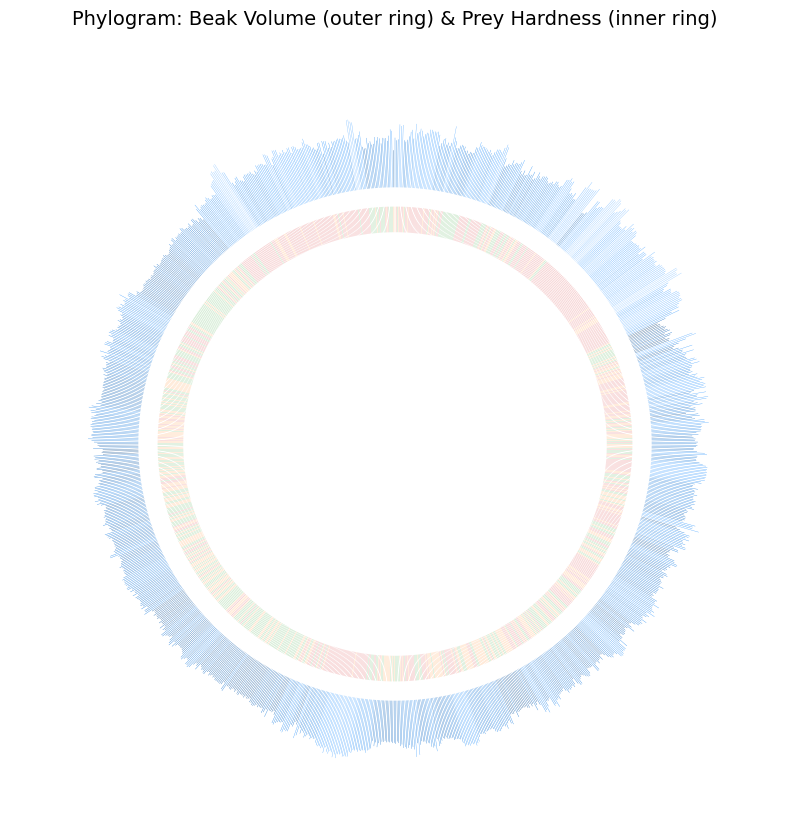

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from ete3 import Tree, TreeStyle
import os

# --- 基础路径 ---
BASE_DIR = Path.cwd()
OUTPUT_DIR = BASE_DIR / "results_phylogram"
OUTPUT_DIR.mkdir(exist_ok=True)

TRAITS_CSV = OUTPUT_DIR / "traits_cleaned.csv"
TREE_FILE = OUTPUT_DIR / "pruned_tree.tre"
TMP_TREE_PNG = OUTPUT_DIR / "tmp_tree.png"

# === 读traits数据 ===
traits = pd.read_csv(TRAITS_CSV, encoding="utf-8-sig")
traits.set_index("label", inplace=True)

# === 读树 ===
tree = Tree(str(TREE_FILE), format=1)

# --- 统一枝长，让叶尖对齐 ---
for node in tree.traverse():
    if node.is_leaf():
        node.dist = 1.0  # 叶子距离父节点固定
    else:
        if node.is_root():
            node.dist = 0
        else:
            node.dist = 0.1  # 内部枝稍微有点长度保持层次感

# 确保 traits 顺序跟树叶顺序一致
leaf_names = [leaf.name for leaf in tree.iter_leaves()]
traits = traits.loc[leaf_names]

# === 色彩映射 ===
# 喙体积 用蓝色渐变，高对比
cmap_beak = mcolors.LinearSegmentedColormap.from_list(
    "beakvol", ["#003366", "#0066CC", "#3399FF", "#66B2FF", "#99CCFF"]
)
vals = traits["log10_BeakVolume"].astype(float)
vmin, vmax = vals.min(), vals.max()
norm_vals = (vals - vmin) / (vmax - vmin)

# 猎物硬度分类颜色（深绿、橙、红）
hard_cols = {"Soft": "#2ca02c", "Medium": "#ff7f0e", "Hard": "#d62728"}
hardness_colors = traits["Hardness_cat"].map(hard_cols).fillna("#888888")

# ete3 树样式，不显示叶名
ts = TreeStyle()
ts.mode = "c"  # 圆形树
ts.show_leaf_name = False
ts.show_scale = False
ts.root_opening_factor = 1.0
ts.rotation = 90
ts.margin_top = ts.margin_left = ts.margin_right = ts.margin_bottom = 20

print(f"绘制树图，保存临时PNG: {TMP_TREE_PNG}")
tree.render(str(TMP_TREE_PNG), w=1200, units="px", tree_style=ts, dpi=300)

# 读取树图PNG
im_tree = plt.imread(str(TMP_TREE_PNG))

# --- matplotlib 极坐标画环形条形图叠加 ---
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, polar=True)
ax.set_theta_direction(-1)  # 顺时针
ax.set_theta_zero_location("N")  # 0度顶端

N = len(leaf_names)
theta = np.linspace(0, 2 * np.pi, N, endpoint=False)

# 外圈：喙体积条形，更短更窄，颜色深
bar_length_outer = 0.05 + norm_vals * 0.07  # 0.05 ~ 0.12长度
width_outer = 2 * np.pi / N * 0.20  # 0.20弧度宽度
colors_outer = [cmap_beak(x) for x in norm_vals]
bars_outer = ax.bar(theta, bar_length_outer, width=width_outer, bottom=1.0, color=colors_outer, edgecolor='none')

# 内圈：猎物硬度分类，固定短条形，颜色对比强
bar_length_inner = np.full_like(bar_length_outer, 0.04)
width_inner = width_outer * 0.6
bars_inner = ax.bar(theta, bar_length_inner, width=width_inner, bottom=1.0 - 0.07, color=hardness_colors, edgecolor='none')

# 极坐标范围和样式调整
ax.set_ylim(0.6, 1.2)
ax.axis("off")

# 树图大小和位置调整，紧贴环形条形内侧，保证对齐和美观
im_diameter = 1.9
ax.imshow(im_tree, extent=[-im_diameter/2, im_diameter/2, -im_diameter/2, im_diameter/2], zorder=0)

plt.title("Phylogram: Beak Volume (outer ring) & Prey Hardness (inner ring)", fontsize=14)

# 保存和展示
out_png = OUTPUT_DIR / "phylogram_outer_rings_aligned_no_labels.png"
plt.savefig(out_png, dpi=300, bbox_inches="tight")
print(f"最终图片保存为: {out_png}")
plt.show()


In [ ]:
library(ape)
library(ggtree)
library(ggplot2)
library(dplyr)
library(readr)
library(scales)

# --- 路径设置 ---
BASE_DIR <- getwd()
OUTPUT_DIR <- file.path(BASE_DIR, "results_phylogram")
TRAITS_CSV <- file.path(OUTPUT_DIR, "traits_cleaned.csv")
TREE_FILE <- file.path(OUTPUT_DIR, "pruned_tree.tre")

# --- 读数据 ---
traits <- read_csv(TRAITS_CSV)
traits <- traits %>% rename(label = label) %>% as.data.frame()
rownames(traits) <- traits$label

# --- 读树 ---
tree <- read.tree(TREE_FILE)

# --- 统一叶尖长度 ---
tree$edge.length <- ifelse(tree$edge[,2] <= length(tree$tip.label), 1, 0.1)

# --- 确保数据顺序与树叶一致 ---
traits <- traits[tree$tip.label, ]

# --- 开口角度设置 ---
opening_factor <- 0.6  # 和 python 一致
full_angle <- 360
open_angle <- full_angle * (1 - opening_factor)
start_angle <- open_angle / 2
end_angle <- full_angle - open_angle / 2

# --- 外圈颜色映射（log10_BeakVolume，蓝色渐变） ---
vals <- traits$log10_BeakVolume
norm_vals <- (vals - min(vals)) / (max(vals) - min(vals))
cmap <- scales::seq_gradient_pal("#08306b", "#eff3ff", "Lab")(norm_vals)

# --- 内圈硬度颜色 ---
hard_cols <- c("Soft"="#1b9e77", "Medium"="#d95f02", "Hard"="#7570b3")
hardness_colors <- hard_cols[traits$Hardness_cat]

# --- 用 ggtree 画开口树 ---
p_tree <- ggtree(tree, layout="circular", open.angle=open_angle) +
  theme_void()

# 不显示 tip.label
p_tree <- p_tree + geom_tiplab(size=0)  # 隐藏标签

# 获取 tip 坐标
tip_data <- p_tree$data %>% filter(isTip)

# --- 外圈条形数据 ---
bar_outer <- tip_data %>%
  mutate(angle = (y / max(y)) * (end_angle - start_angle) + start_angle,
         value = 0.05 + norm_vals * 0.1,
         color = cmap)

# --- 内圈条形数据 ---
bar_inner <- tip_data %>%
  mutate(angle = (y / max(y)) * (end_angle - start_angle) + start_angle,
         value = 0.04,
         color = hardness_colors)

# --- 条形图绘制 ---
p_bars <- ggplot() +
  # 外圈条形
  geom_bar(data=bar_outer, aes(x=angle, y=value, fill=color), stat="identity", width=1) +
  # 内圈条形
  geom_bar(data=bar_inner, aes(x=angle, y=value, fill=color), stat="identity", width=1) +
  scale_fill_identity() +
  coord_polar(start=0) +
  theme_void()

# --- 合并树和条形 ---
# 简单方法：分别保存图片，然后用图片叠加（magick包）
png_tree <- file.path(OUTPUT_DIR, "tmp_tree_r.png")
png_bars <- file.path(OUTPUT_DIR, "tmp_bars_r.png")
final_png <- file.path(OUTPUT_DIR, "phylogram_opening_rings_r.png")

ggsave(png_tree, p_tree, width=8, height=8, dpi=300)
ggsave(png_bars, p_bars, width=8, height=8, dpi=300)

library(magick)
img_tree <- image_read(png_tree)
img_bars <- image_read(png_bars)

final_img <- image_composite(img_bars, img_tree, operator="atop")
image_write(final_img, final_png)

cat("图片已保存：", final_png, "\n")


ERROR: Error in library(ape): there is no package called 'ape'


In [ ]:
install.packages("ape")
install.packages("ggtree")
install.packages("ggplot2")
install.packages("dplyr")
install.packages("readr")
install.packages("scales")
install.packages("magick")


Warning message:
"unable to access index for repository https://cran.r-project.org/bin/windows/contrib/3.6:
  无法打开URL'https://cran.r-project.org/bin/windows/contrib/3.6/PACKAGES'"Package which is only available in source form, and may need
  compilation of C/C++/Fortran: 'ape'


  These will not be installed


Warning message:
"package 'ggtree' is not available (for R version 3.6.1)"Warning message:
"unable to access index for repository https://cran.r-project.org/bin/windows/contrib/3.6:
  无法打开URL'https://cran.r-project.org/bin/windows/contrib/3.6/PACKAGES'"Warning message:
"dependency 'scales' is not available"also installing the dependencies 'cli', 'isoband', 'lifecycle', 'rlang', 'vctrs'

Warning message:
"unable to access index for repository https://cran.r-project.org/bin/windows/contrib/3.6:
  无法打开URL'https://cran.r-project.org/bin/windows/contrib/3.6/PACKAGES'"Packages which are only available in source form, and may need
  compilation of C/C++/Fortran: 'cli' 'isoband' 'rlang' 'vctrs'


  These will not be installed


installing the source packages 'lifecycle', 'ggplot2'

Warning message in install.packages("ggplot2"):
"installation of package 'lifecycle' had non-zero exit status"Warning message in install.packages("ggplot2"):
"installation of package 'ggplot2' had non-zero exit status"also installing the dependencies 'cli', 'glue', 'lifecycle', 'pillar', 'rlang', 'tibble', 'tidyselect', 'vctrs'

Warning message:
"unable to access index for repository https://cran.r-project.org/bin/windows/contrib/3.6:
  无法打开URL'https://cran.r-project.org/bin/windows/contrib/3.6/PACKAGES'"Packages which are only available in source form, and may need
  compilation of C/C++/Fortran: 'cli' 'glue' 'rlang' 'tibble'
  'tidyselect' 'vctrs' 'dplyr'


  These will not be installed


installing the source packages 'lifecycle', 'pillar'

Warning message in install.packages("dplyr"):
"installation of package 'lifecycle' had non-zero exit status"Warning message in install.packages("dplyr"):
"installation of package 'pillar' had non-zero exit status"Warning message:
"dependencies 'cpp11', 'tzdb' are not available"also installing the dependencies 'bit', 'rlang', 'bit64', 'vctrs', 'cli', 'lifecycle', 'vroom'

Warning message:
"unable to access index for repository https://cran.r-project.org/bin/windows/contrib/3.6:
  无法打开URL'https://cran.r-project.org/bin/windows/contrib/3.6/PACKAGES'"Packages which are only available in source form, and may need
  compilation of C/C++/Fortran: 'bit' 'rlang' 'bit64' 'vctrs' 'cli'
  'vroom' 'readr'


  These will not be installed


installing the source package 'lifecycle'

Warning message in install.packages("readr"):
"installation of package 'lifecycle' had non-zero exit status"Warning message:
"package 'scales' is not available (for R version 3.6.1)"Warning message:
"unable to access index for repository https://cran.r-project.org/bin/windows/contrib/3.6:
  无法打开URL'https://cran.r-project.org/bin/windows/contrib/3.6/PACKAGES'"Warning message:
"package 'magick' is not available (for R version 3.6.1)"Warning message:
"unable to access index for repository https://cran.r-project.org/bin/windows/contrib/3.6:
  无法打开URL'https://cran.r-project.org/bin/windows/contrib/3.6/PACKAGES'"

绘制树图，保存临时PNG: d:\work\其他人的工作\lyn\results_phylogram\tmp_tree.png
最终图片保存为: d:\work\其他人的工作\lyn\results_phylogram\phylogram_outer_rings_aligned_nicetree_no_labels.png


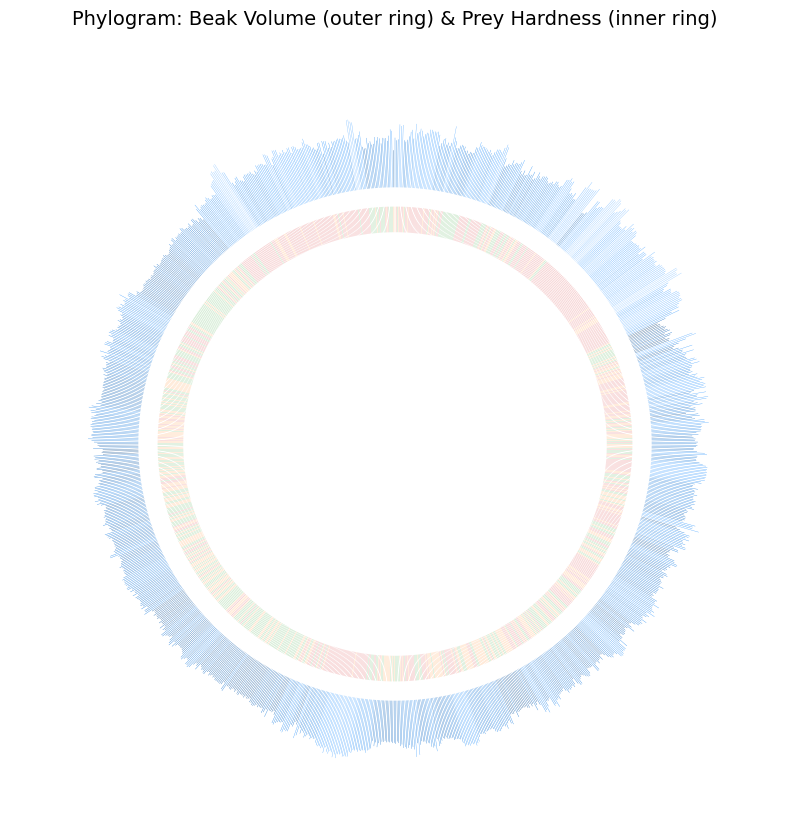

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from ete3 import Tree, TreeStyle, NodeStyle
import os

# --- 基础路径 ---
BASE_DIR = Path.cwd()
OUTPUT_DIR = BASE_DIR / "results_phylogram"
OUTPUT_DIR.mkdir(exist_ok=True)

TRAITS_CSV = OUTPUT_DIR / "traits_cleaned.csv"
TREE_FILE = OUTPUT_DIR / "pruned_tree.tre"
TMP_TREE_PNG = OUTPUT_DIR / "tmp_tree.png"

# === 读traits数据 ===
traits = pd.read_csv(TRAITS_CSV, encoding="utf-8-sig")
traits.set_index("label", inplace=True)

# === 读树 ===
tree = Tree(str(TREE_FILE), format=1)

# --- Hack: 叶尖对齐 ---

def extend_leaf_to_align(tree, target_length=None):
    """
    通过给叶子延长枝条，叶尖对齐，保持树结构自然。
    target_length 默认为最长叶子距离。
    """
    # 先计算每个叶子到根的距离
    leaf_dists = [leaf.get_distance(tree) for leaf in tree.iter_leaves()]
    max_dist = max(leaf_dists) if target_length is None else target_length
    
    for leaf in tree.iter_leaves():
        dist = leaf.get_distance(tree)
        diff = max_dist - dist
        if diff > 1e-8:
            # 延长叶枝
            leaf.dist += diff

extend_leaf_to_align(tree)

# 设置叶子和内部节点样式，不显示叶名，去掉节点小圆点
nstyle_leaf = NodeStyle()
nstyle_leaf["fgcolor"] = "black"
nstyle_leaf["size"] = 0  # 叶子节点不显示小圆点
nstyle_leaf["vt_line_width"] = 2
nstyle_leaf["hz_line_width"] = 2
nstyle_leaf["vt_line_color"] = "#555555"
nstyle_leaf["hz_line_color"] = "#555555"

nstyle_inner = NodeStyle()
nstyle_inner["fgcolor"] = "black"
nstyle_inner["size"] = 0
nstyle_inner["vt_line_width"] = 2
nstyle_inner["hz_line_width"] = 2
nstyle_inner["vt_line_color"] = "#555555"
nstyle_inner["hz_line_color"] = "#555555"

for n in tree.iter_leaves():
    n.set_style(nstyle_leaf)
for n in tree.traverse():
    if not n.is_leaf():
        n.set_style(nstyle_inner)

# 确保 traits 顺序跟树叶顺序一致
leaf_names = [leaf.name for leaf in tree.iter_leaves()]
traits = traits.loc[leaf_names]

# === 色彩映射 ===
# 喙体积蓝色渐变，深色代表大体积
cmap_beak = mcolors.LinearSegmentedColormap.from_list(
    "beakvol", ["#003366", "#0066CC", "#3399FF", "#66B2FF", "#99CCFF"]
)
vals = traits["log10_BeakVolume"].astype(float)
vmin, vmax = vals.min(), vals.max()
norm_vals = (vals - vmin) / (vmax - vmin)

# 猎物硬度分类颜色（深绿、橙、红）
hard_cols = {"Soft": "#2ca02c", "Medium": "#ff7f0e", "Hard": "#d62728"}
hardness_colors = traits["Hardness_cat"].map(hard_cols).fillna("#888888")

# ete3 树样式
ts = TreeStyle()
ts.mode = "c"  # 圆形树
ts.show_leaf_name = False  # 不显示叶名
ts.show_scale = False
ts.root_opening_factor = 1.0
ts.rotation = 90
ts.margin_top = ts.margin_left = ts.margin_right = ts.margin_bottom = 20

print(f"绘制树图，保存临时PNG: {TMP_TREE_PNG}")
tree.render(str(TMP_TREE_PNG), w=1200, units="px", tree_style=ts, dpi=300)

# 读取树图PNG
im_tree = plt.imread(str(TMP_TREE_PNG))

# --- matplotlib 极坐标画环形条形图叠加 ---
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, polar=True)
ax.set_theta_direction(-1)  # 顺时针
ax.set_theta_zero_location("N")  # 0度顶端

N = len(leaf_names)
theta = np.linspace(0, 2 * np.pi, N, endpoint=False)

# 外圈：喙体积条形，更短更窄，颜色深
bar_length_outer = 0.05 + norm_vals * 0.07  # 0.05 ~ 0.12长度
width_outer = 2 * np.pi / N * 0.20  # 0.20弧度宽度
colors_outer = [cmap_beak(x) for x in norm_vals]
bars_outer = ax.bar(theta, bar_length_outer, width=width_outer, bottom=1.0, color=colors_outer, edgecolor='none')

# 内圈：猎物硬度分类，固定短条形，颜色对比强
bar_length_inner = np.full_like(bar_length_outer, 0.04)
width_inner = width_outer * 0.6
bars_inner = ax.bar(theta, bar_length_inner, width=width_inner, bottom=1.0 - 0.07, color=hardness_colors, edgecolor='none')

# 极坐标范围和样式调整
ax.set_ylim(0.6, 1.2)
ax.axis("off")

# 树图大小和位置调整，紧贴环形条形内侧，保证对齐和美观
im_diameter = 1.9
ax.imshow(im_tree, extent=[-im_diameter/2, im_diameter/2, -im_diameter/2, im_diameter/2], zorder=0)

plt.title("Phylogram: Beak Volume (outer ring) & Prey Hardness (inner ring)", fontsize=14)

# 保存和展示
out_png = OUTPUT_DIR / "phylogram_outer_rings_aligned_nicetree_no_labels.png"
plt.savefig(out_png, dpi=300, bbox_inches="tight")
print(f"最终图片保存为: {out_png}")
plt.show()


绘制树图，保存临时PNG: d:\work\其他人的工作\lyn\results_phylogram\tmp_tree.png
最终图片保存为 d:\work\其他人的工作\lyn\results_phylogram\phylogram_opening_rings.png


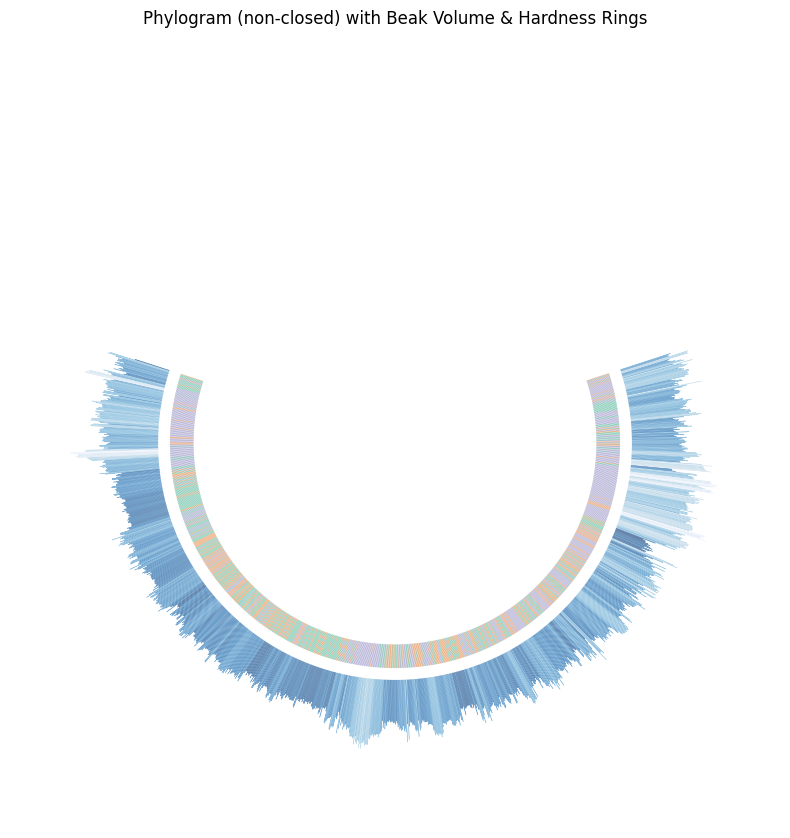

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from ete3 import Tree, TreeStyle
import os

# --- 路径配置 ---
BASE_DIR = Path.cwd()
OUTPUT_DIR = BASE_DIR / "results_phylogram"
OUTPUT_DIR.mkdir(exist_ok=True)

TRAITS_CSV = OUTPUT_DIR / "traits_cleaned.csv"
TREE_FILE = OUTPUT_DIR / "pruned_tree.tre"
TMP_TREE_PNG = OUTPUT_DIR / "tmp_tree.png"

# --- 读traits ---
traits = pd.read_csv(TRAITS_CSV, encoding="utf-8-sig")
traits.set_index("label", inplace=True)

# --- 读树 ---
tree = Tree(str(TREE_FILE), format=1)

# --- 统一枝长，让叶尖对齐 ---
for node in tree.traverse():
    if node.is_leaf():
        node.dist = 1.0  # 叶尖长度固定
    else:
        node.dist = 0.1  # 内部枝短一点

# --- 确保 traits 顺序和树叶顺序一致 ---
leaf_names = [leaf.name for leaf in tree.iter_leaves()]
traits = traits.loc[leaf_names]

# --- 颜色映射 ---
hard_cols = {
    "Soft": "#1b9e77",   # 对比度强绿
    "Medium": "#d95f02", # 对比度强橙
    "Hard": "#7570b3"    # 对比度强紫
}
cmap = mcolors.LinearSegmentedColormap.from_list(
    "beakvol", ["#08306b", "#2171b5", "#6baed6", "#bdd7e7", "#eff3ff"]
)

vals = traits["log10_BeakVolume"].astype(float)
vmin, vmax = vals.min(), vals.max()
norm = (vals - vmin) / (vmax - vmin)

# --- ete3 树样式 ---
ts = TreeStyle()
ts.mode = "c"  # 圆形树
ts.show_leaf_name = False
ts.show_scale = False
ts.root_opening_factor = 0.6  # 非闭合开口圆形树，0~1，越小开口越大
ts.rotation = 90
ts.margin_top = 20
ts.margin_left = 20
ts.margin_right = 20
ts.margin_bottom = 20

print(f"绘制树图，保存临时PNG: {TMP_TREE_PNG}")
tree.render(str(TMP_TREE_PNG), w=1200, units="px", tree_style=ts, dpi=300)

# --- 读取PNG图像 ---
im_tree = plt.imread(str(TMP_TREE_PNG))

# --- matplotlib 画极坐标开口环形条形图 ---
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, polar=True)
ax.set_theta_direction(-1)  # 顺时针画图
ax.set_theta_zero_location("N")  # 0度在正上方

N = len(leaf_names)

# 开口角度，和树root_opening_factor对应
full_angle = 2 * np.pi
opening_factor = ts.root_opening_factor  # 0.6
open_angle = full_angle * (1 - opening_factor)  # 开口弧度大小
start_angle = open_angle / 2
end_angle = full_angle - open_angle / 2

# theta 从 start_angle 到 end_angle，不闭合
theta = np.linspace(start_angle, end_angle, N, endpoint=False)

# 条形宽度，稍微窄一点，留点间隔
width_outer = (end_angle - start_angle) / N * 0.7
width_inner = width_outer * 0.6

# 外圈条形：log10喙体积，蓝色渐变，长度短点
bar_length_outer = 0.05 + norm * 0.1  # 长度范围 0.05 ~ 0.15
colors_outer = [cmap(x) for x in norm]
bars_outer = ax.bar(theta, bar_length_outer, width=width_outer, bottom=1.0, color=colors_outer, edgecolor='none', zorder=2)

# 内圈条形：硬度分类，固定长度，颜色对比强烈
hardness_colors = traits["Hardness_cat"].map(hard_cols).fillna("#CCCCCC")
bar_length_inner = np.full_like(bar_length_outer, 0.04)
bars_inner = ax.bar(theta, bar_length_inner, width=width_inner, bottom=1.0 - 0.06, color=hardness_colors, edgecolor='none', zorder=3)

# 设置极坐标半径范围，关闭坐标轴显示
ax.set_ylim(0.6, 1.25)
ax.axis("off")

# 把树PNG放到极坐标中心，大小调整合适
im_diameter = 2.0
ax.imshow(im_tree, extent=[-im_diameter / 2, im_diameter / 2, -im_diameter / 2, im_diameter / 2], zorder=1)

plt.title("Phylogram (non-closed) with Beak Volume & Hardness Rings")
out_png = OUTPUT_DIR / "phylogram_opening_rings.png"
plt.savefig(out_png, dpi=300, bbox_inches="tight")
print(f"最终图片保存为 {out_png}")
plt.show()


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from ete3 import Tree, TreeStyle
import os

# --- 基础路径 ---
BASE_DIR = Path.cwd()
OUTPUT_DIR = BASE_DIR / "results_phylogram"
OUTPUT_DIR.mkdir(exist_ok=True)

TRAITS_CSV = OUTPUT_DIR / "traits_cleaned.csv"
TREE_FILE = OUTPUT_DIR / "pruned_tree.tre"
TMP_TREE_PNG = OUTPUT_DIR / "tmp_tree.png"

# === 读traits数据 ===
traits = pd.read_csv(TRAITS_CSV, encoding="utf-8-sig")
traits.set_index("label", inplace=True)

# === 读树 ===
tree = Tree(str(TREE_FILE), format=1)

# 保证traits顺序和树叶顺序一致
leaf_names = [leaf.name for leaf in tree.iter_leaves()]
traits = traits.loc[leaf_names]

# === 色彩映射 ===
hard_cols = {
    "Soft": "#2ca02c",    # 绿色
    "Medium": "#ff7f0e",  # 橙色
    "Hard": "#d62728"     # 红色
}
cmap = mcolors.LinearSegmentedColormap.from_list(
    "beakvol", ["#4575B4", "#91BFDB", "#E0F3F8", "#FEE090", "#FC8D59", "#D73027"]
)

vals = traits["log10_BeakVolume"].astype(float)
vmin, vmax = vals.min(), vals.max()

# === ete3树形图配置 ===
ts = TreeStyle()
ts.mode = "c"  # 圆形树
ts.show_leaf_name = False  # 不显示叶子名
ts.show_scale = False
ts.root_opening_factor = 1.0
ts.rotation = 90
ts.margin_top = 20
ts.margin_left = 20
ts.margin_right = 20
ts.margin_bottom = 20

print(f"绘制树图，保存临时PNG: {TMP_TREE_PNG}")
tree.render(str(TMP_TREE_PNG), w=1200, units="px", tree_style=ts, dpi=300)

# === matplotlib极坐标环形条形图叠加（树外围） ===
im_tree = plt.imread(str(TMP_TREE_PNG))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, polar=True)
ax.set_theta_direction(-1)  # 顺时针
ax.set_theta_zero_location("N")  # 0度顶端

N = len(leaf_names)
theta = np.linspace(0, 2 * np.pi, N, endpoint=False)

# 外圈：喙体积条形长度更短，颜色渐变（颜色更饱和）
norm = (vals - vmin) / (vmax - vmin)
bar_length_outer = 0.06 + norm * 0.12  # 更短更窄
colors_outer = [cmap(x) for x in norm]
bars_outer = ax.bar(theta, bar_length_outer, width=2*np.pi/N*0.8, bottom=1.02, color=colors_outer, edgecolor='k', linewidth=0.3)

# 内圈：猎物硬度，固定长度，颜色更饱和
hardness_colors = traits["Hardness_cat"].map(hard_cols)
bar_length_inner = np.full_like(bar_length_outer, 0.05)
bars_inner = ax.bar(theta, bar_length_inner, width=2*np.pi/N*0.8, bottom=1.02 - 0.065, color=hardness_colors, edgecolor='k', linewidth=0.3)

# 极坐标限制
ax.set_ylim(0.8, 1.25)
ax.axis('off')

# 放置树图PNG，调整大小和位置
im_diameter = 1.5
ax.imshow(im_tree, extent=[-im_diameter/2, im_diameter/2, -im_diameter/2, im_diameter/2], zorder=0)

plt.title("Phylogram with two outer rings (no leaf labels)")
out_png = OUTPUT_DIR / "phylogram_outer_rings_no_labels.png"
plt.savefig(out_png, dpi=300, bbox_inches='tight')
print(f"最终图片保存为 {out_png}")
plt.show()


: 

In [ ]:
from pathlib import Path
from ete3 import Tree, TreeStyle
import os


In [ ]:
from pathlib import Path
from ete3 import Tree, TreeStyle
import os

BASE_DIR = Path.cwd()
OUTPUT_DIR = BASE_DIR / "results_phylogram"
OUTPUT_DIR.mkdir(exist_ok=True)

TREE_FILE = OUTPUT_DIR / "pruned_tree.tre"
TREE_PNG = OUTPUT_DIR / "tree_aligned_no_labels.png"

# 读树
tree = Tree(str(TREE_FILE), format=1)

# 让树叶尖对齐的函数
def ladderize_and_align(tree):
    tree.ladderize()  # 阶梯化排列
    # 统一叶尖距离，保证最外端对齐
    for node in tree.traverse():
        if node.is_leaf():
            node.dist = 1.0  # 所有叶子距父节点距离设为1
        else:
            # 内部节点距离保持原样或设置较小值
            if node.is_root():
                node.dist = 0
            else:
                node.dist = 0.1
    return tree

tree = ladderize_and_align(tree)

# TreeStyle配置
ts = TreeStyle()
ts.mode = "c"  # 圆形树
ts.show_leaf_name = False  # 不显示叶名
ts.show_scale = False
ts.root_opening_factor = 1.0
ts.rotation = 90
ts.margin_top = 20
ts.margin_left = 20
ts.margin_right = 20
ts.margin_bottom = 20

print(f"绘制树图，保存为 {TREE_PNG}")
tree.render(str(TREE_PNG), w=1200, units="px", tree_style=ts, dpi=300)
print("树绘制完成！")


绘制树图，保存为 d:\work\其他人的工作\lyn\results_phylogram\tree_aligned_no_labels.png
树绘制完成！


# 维度分布

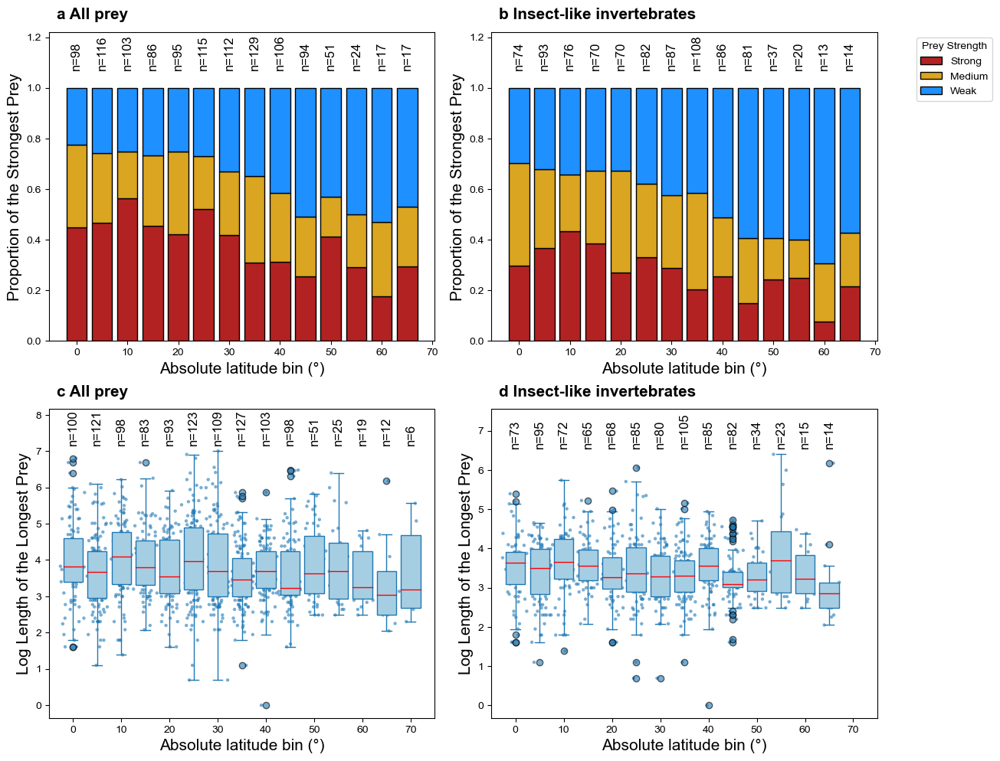

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.ticker import FormatStrFormatter

plt.rcParams["font.family"] = "Arial"

colors = {
    "Strong": "#B22222",   # 暗红
    "Medium": "#DAA520",    # 暗金黄
    "Weak": "#1E90FF"       # 暗蓝
}

boxplot_facecolor = "#a6cee3"  # 浅蓝
boxplot_edgecolor = "#1f78b4"  # 深蓝

def lat_bin(lat):
    if pd.isna(lat):
        return np.nan
    try:
        lat = abs(float(lat))
    except ValueError:
        return np.nan
    return 5 * round(lat / 5)

def select_hardest_longest_prey(group):
    group = group.dropna(subset=["Size", "Prey_Strength"]).copy()
    if group.empty:
        return None
    hardness_order = {"Strong": 2, "Medium": 1, "Weak": 0}
    group["Hardness_score"] = group["Prey_Strength"].map(hardness_order)
    max_score = group["Hardness_score"].max()
    subset = group[group["Hardness_score"] == max_score]
    if subset.empty:
        return None
    return subset.loc[[subset["Size"].idxmax()]]

def merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6):
    df = df.copy()
    counts = df[bin_col].value_counts().sort_index()
    bins = sorted(counts.index)

    if len(bins) < 2:
        return df

    while counts.get(bins[0],0) < min_count and len(bins) > 1:
        low_bin = bins[0]
        next_bin = bins[1]
        df.loc[df[bin_col] == low_bin, bin_col] = next_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    while counts.get(bins[-1],0) < min_count and len(bins) > 1:
        high_bin = bins[-1]
        prev_bin = bins[-2]
        df.loc[df[bin_col] == high_bin, bin_col] = prev_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    return df

def plot_stacked_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)

    total_counts = df.groupby("Lat_bin")["Species.BirdTree"].nunique()
    
    counts = df.groupby(["Lat_bin", "Prey_Strength"])["Species.BirdTree"].nunique().reset_index()
    pivot = counts.pivot(index="Lat_bin", columns="Prey_Strength", values="Species.BirdTree").fillna(0)
    pivot = pivot.reindex(index=sorted(total_counts.index), columns=["Strong", "Medium", "Weak"], fill_value=0)
    pivot_prop = pivot.div(pivot.sum(axis=1), axis=0)
    
    bottom = np.zeros(len(pivot_prop))
    for hardness in ["Strong", "Medium", "Weak"]:
        ax.bar(
            pivot_prop.index,
            pivot_prop[hardness],
            bottom=bottom,
            label=hardness,
            color=colors[hardness],
            edgecolor="black",
            width=4
        )
        bottom += pivot_prop[hardness]

    for lat in pivot_prop.index:
        ax.text(lat, 1.07, f"n={total_counts.loc[lat]}", ha="center", va="bottom",
                fontsize=12, rotation=90, fontname='Arial')

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Proportion of the Strongest Prey", fontsize=15)
    ax.set_ylim(0, 1.22)
    ax.text(0.02, 1.08, title, transform=ax.transAxes, fontsize=15,fontweight='bold',
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))

def plot_boxscatter_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin", "Size"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)
    df["log.Size"] = np.log(df["Size"] + 1e-6)

    bins = sorted(df["Lat_bin"].unique())
    data_by_bin = [df[df["Lat_bin"] == b]["log.Size"] for b in bins]
    total_counts = df.groupby("Lat_bin").size()

    bp = ax.boxplot(data_by_bin, positions=bins, widths=4, patch_artist=True,
                    boxprops=dict(facecolor=boxplot_facecolor, color=boxplot_edgecolor),
                    medianprops=dict(color="red"),
                    whiskerprops=dict(color=boxplot_edgecolor),
                    capprops=dict(color=boxplot_edgecolor),
                    flierprops=dict(markerfacecolor=boxplot_edgecolor, marker='o', alpha=0.6))

    for i, b in enumerate(bins):
        y = data_by_bin[i]
        x = np.random.normal(b, 1, size=len(y))
        ax.scatter(x, y, color=boxplot_edgecolor, alpha=0.6, s=10, edgecolors="none")

    y_max = max([d.max() if len(d) > 0 else 0 for d in data_by_bin])
    label_height = y_max + 0.15

    for lat in bins:
        ax.text(lat, label_height, f"n={total_counts.loc[lat]}", ha="center", va="bottom",
                fontsize=12, fontname='Arial', rotation=90)

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Log Length of the Longest Prey", fontsize=15)
    ax.set_ylim(bottom=None, top=label_height + 1.0)
    ax.text(0.02, 1.08, title, transform=ax.transAxes, fontsize=15,fontweight='bold',
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.set_xlim(min(ticks_to_show) - 5, max(ticks_to_show) + 5)

# ===== 数据处理 =====
df_hardest = df.groupby("Species.BirdTree").apply(select_hardest_longest_prey).reset_index(drop=True)
df_type1 = df_hardest[df_hardest["Size.Type"].isin([1,2])].copy()

df_longest = df.loc[df.groupby("Species.BirdTree")["Size"].idxmax()].reset_index(drop=True)
df_longest_type1 = df_longest[df_longest["Size.Type"].isin([1,2])].copy()

# ===== 绘图 =====
fig, axes = plt.subplots(2, 2, figsize=(13, 10), sharex=False)

# 上排堆积柱状图
plot_stacked_ax(df_hardest, axes[0,0], "a All prey")
plot_stacked_ax(df_type1, axes[0,1], "b Insect-like invertebrates")

# 下排箱线+散点图
plot_boxscatter_ax(df_longest, axes[1,0], "c All prey")
plot_boxscatter_ax(df_longest_type1, axes[1,1], "d Insect-like invertebrates")

# 图例
handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, title="Prey Strength", loc="upper right", bbox_to_anchor=(1.0, 0.95), borderaxespad=0)

plt.tight_layout(rect=[0,0,0.9,1])
plt.show()


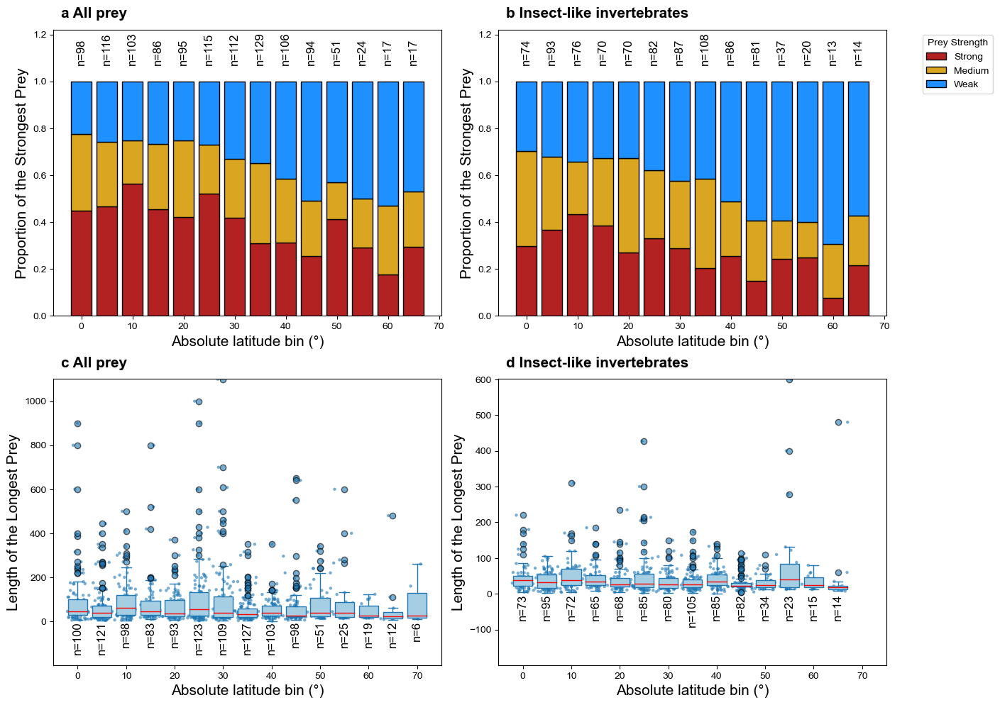

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.ticker import FormatStrFormatter

plt.rcParams["font.family"] = "Arial"

colors = {
    "Strong": "#B22222",   # 暗红
    "Medium": "#DAA520",    # 暗金黄
    "Weak": "#1E90FF"       # 暗蓝
}

boxplot_facecolor = "#a6cee3"  # 浅蓝
boxplot_edgecolor = "#1f78b4"  # 深蓝

def lat_bin(lat):
    if pd.isna(lat):
        return np.nan
    try:
        lat = abs(float(lat))
    except ValueError:
        return np.nan
    return 5 * round(lat / 5)

def select_hardest_longest_prey(group):
    group = group.dropna(subset=["Size", "Prey_Strength"]).copy()
    if group.empty:
        return None
    hardness_order = {"Strong": 2, "Medium": 1, "Weak": 0}
    group["Hardness_score"] = group["Prey_Strength"].map(hardness_order)
    max_score = group["Hardness_score"].max()
    subset = group[group["Hardness_score"] == max_score]
    if subset.empty:
        return None
    return subset.loc[[subset["Size"].idxmax()]]

def merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6):
    df = df.copy()
    counts = df[bin_col].value_counts().sort_index()
    bins = sorted(counts.index)

    if len(bins) < 2:
        return df

    while counts.get(bins[0],0) < min_count and len(bins) > 1:
        low_bin = bins[0]
        next_bin = bins[1]
        df.loc[df[bin_col] == low_bin, bin_col] = next_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    while counts.get(bins[-1],0) < min_count and len(bins) > 1:
        high_bin = bins[-1]
        prev_bin = bins[-2]
        df.loc[df[bin_col] == high_bin, bin_col] = prev_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    return df

def plot_stacked_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)

    total_counts = df.groupby("Lat_bin")["Species.BirdTree"].nunique()
    
    counts = df.groupby(["Lat_bin", "Prey_Strength"])["Species.BirdTree"].nunique().reset_index()
    pivot = counts.pivot(index="Lat_bin", columns="Prey_Strength", values="Species.BirdTree").fillna(0)
    pivot = pivot.reindex(index=sorted(total_counts.index), columns=["Strong", "Medium", "Weak"], fill_value=0)
    pivot_prop = pivot.div(pivot.sum(axis=1), axis=0)
    
    bottom = np.zeros(len(pivot_prop))
    for hardness in ["Strong", "Medium", "Weak"]:
        ax.bar(
            pivot_prop.index,
            pivot_prop[hardness],
            bottom=bottom,
            label=hardness,
            color=colors[hardness],
            edgecolor="black",
            width=4
        )
        bottom += pivot_prop[hardness]

    for lat in pivot_prop.index:
        ax.text(lat, 1.07, f"n={total_counts.loc[lat]}", ha="center", va="bottom",
                fontsize=12, rotation=90, fontname='Arial')

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Proportion of the Strongest Prey", fontsize=15)
    ax.set_ylim(0, 1.22)
    ax.text(0.02, 1.08, title, transform=ax.transAxes, fontsize=15,fontweight='bold',
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))

def plot_boxscatter_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin", "Size"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)

    bins = sorted(df["Lat_bin"].unique())
    data_by_bin = [df[df["Lat_bin"] == b]["Size"] for b in bins]  # 原始 Size
    total_counts = df.groupby("Lat_bin").size()

    bp = ax.boxplot(data_by_bin, positions=bins, widths=4, patch_artist=True,
                    boxprops=dict(facecolor=boxplot_facecolor, color=boxplot_edgecolor),
                    medianprops=dict(color="red"),
                    whiskerprops=dict(color=boxplot_edgecolor),
                    capprops=dict(color=boxplot_edgecolor),
                    flierprops=dict(markerfacecolor=boxplot_edgecolor, marker='o', alpha=0.6))

    for i, b in enumerate(bins):
        y = data_by_bin[i]
        x = np.random.normal(b, 1, size=len(y))
        ax.scatter(x, y, color=boxplot_edgecolor, alpha=0.6, s=10, edgecolors="none")

    y_max = max([d.max() if len(d) > 0 else 0 for d in data_by_bin])
    y_min = min([d.min() if len(d) > 0 else 0 for d in data_by_bin])
    label_height = y_min - 0.15  # 样本量显示在下方

    for lat in bins:
        ax.text(lat, label_height, f"n={total_counts.loc[lat]}", ha="center", va="top",
                fontsize=12, fontname='Arial', rotation=90)

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Length of the Longest Prey", fontsize=15)
    ax.set_ylim(bottom=label_height - 200, top=y_max + 0.5)  # 留空间给下方标签
    ax.text(0.02, 1.08, title, transform=ax.transAxes, fontsize=15,fontweight='bold',
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.set_xlim(min(ticks_to_show) - 5, max(ticks_to_show) + 5)

# ===== 数据处理 =====
df_hardest = df.groupby("Species.BirdTree").apply(select_hardest_longest_prey).reset_index(drop=True)
df_type1 = df_hardest[df_hardest["Size.Type"].isin([1,2])].copy()

df_longest = df.loc[df.groupby("Species.BirdTree")["Size"].idxmax()].reset_index(drop=True)
df_longest_type1 = df_longest[df_longest["Size.Type"].isin([1,2])].copy()

# ===== 绘图 =====
fig, axes = plt.subplots(2, 2, figsize=(13, 10), sharex=False)

# 上排堆积柱状图
plot_stacked_ax(df_hardest, axes[0,0], "a All prey")
plot_stacked_ax(df_type1, axes[0,1], "b Insect-like invertebrates")

# 下排箱线+散点图（原始 Size，样本量在下方）
plot_boxscatter_ax(df_longest, axes[1,0], "c All prey")
plot_boxscatter_ax(df_longest_type1, axes[1,1], "d Insect-like invertebrates")

# 图例
handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, title="Prey Strength", loc="upper right", bbox_to_anchor=(1.08, 0.95), borderaxespad=0)

plt.tight_layout(rect=[0,0,0.98,1])
plt.show()


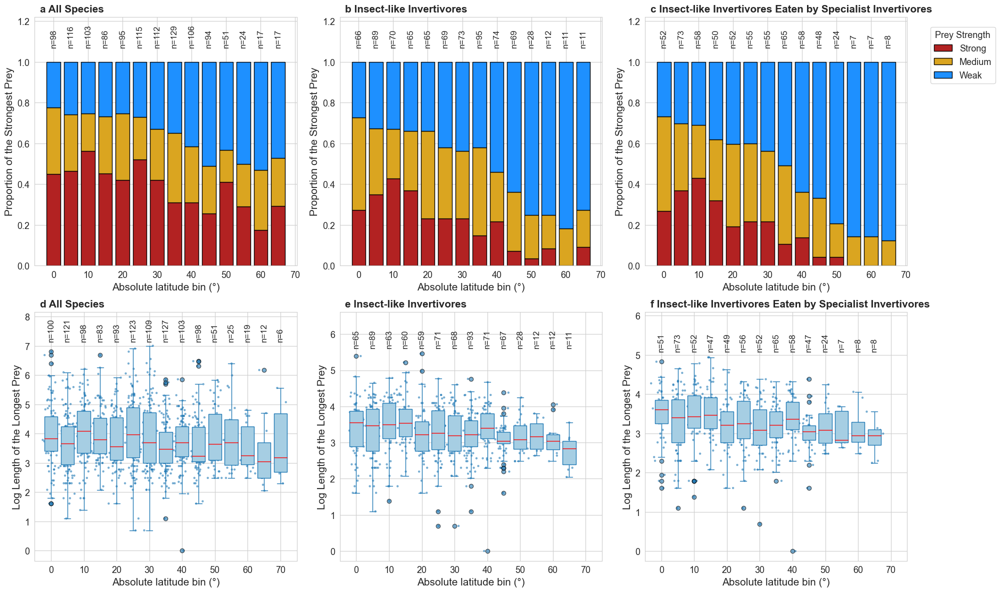

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.ticker import FormatStrFormatter

plt.rcParams["font.family"] = "Arial"

colors = {
    "Strong": "#B22222",   # 暗红
    "Medium": "#DAA520", # 暗金黄
    "Weak": "#1E90FF"    # 暗蓝
}

boxplot_facecolor = "#a6cee3"  # 浅蓝
boxplot_edgecolor = "#1f78b4"  # 深蓝

def lat_bin(lat):
    if pd.isna(lat):
        return np.nan
    try:
        lat = abs(float(lat))
    except ValueError:
        return np.nan
    return 5 * round(lat / 5)

def select_hardest_longest_prey(group):
    group = group.dropna(subset=["Size", "Prey_Strength"]).copy()
    if group.empty:
        return None  # 空组直接返回 None
    hardness_order = {"Strong": 2, "Medium": 1, "Weak": 0}
    group["Hardness_score"] = group["Prey_Strength"].map(hardness_order)
    max_score = group["Hardness_score"].max()
    subset = group[group["Hardness_score"] == max_score]
    if subset.empty:
        return None  # 最大硬度仍为空
    # 返回单行 DataFrame
    return subset.loc[[subset["Size"].idxmax()]]


def merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6):
    df = df.copy()
    counts = df[bin_col].value_counts().sort_index()
    bins = sorted(counts.index)

    if len(bins) < 2:
        return df

    while counts.get(bins[0],0) < min_count and len(bins) > 1:
        low_bin = bins[0]
        next_bin = bins[1]
        df.loc[df[bin_col] == low_bin, bin_col] = next_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    while counts.get(bins[-1],0) < min_count and len(bins) > 1:
        high_bin = bins[-1]
        prev_bin = bins[-2]
        df.loc[df[bin_col] == high_bin, bin_col] = prev_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    return df

def plot_stacked_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)

    total_counts = df.groupby("Lat_bin")["Species.BirdTree"].nunique()
    
    counts = df.groupby(["Lat_bin", "Prey_Strength"])["Species.BirdTree"].nunique().reset_index()
    pivot = counts.pivot(index="Lat_bin", columns="Prey_Strength", values="Species.BirdTree").fillna(0)
    pivot = pivot.reindex(index=sorted(total_counts.index), columns=["Strong", "Medium", "Weak"], fill_value=0)
    pivot_prop = pivot.div(pivot.sum(axis=1), axis=0)
    
    bottom = np.zeros(len(pivot_prop))
    for hardness in ["Strong", "Medium", "Weak"]:
        ax.bar(
            pivot_prop.index,
            pivot_prop[hardness],
            bottom=bottom,
            label=hardness,
            color=colors[hardness],
            edgecolor="black",
            width=4
        )
        bottom += pivot_prop[hardness]

    # 样本量标注高度1.07，字体大小12，旋转90度
    for lat in pivot_prop.index:
        ax.text(lat, 1.07, f"n={total_counts.loc[lat]}", ha="center", va="bottom",
                fontsize=12, rotation=90, fontname='Arial')

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Proportion of the Strongest Prey", fontsize=15)
    ax.set_ylim(0, 1.22)
    # 标题往上右微调
    ax.text(0.02, 1.05, title, transform=ax.transAxes, fontsize=15,fontweight='bold',
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))

def plot_boxscatter_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin", "Size"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)
    df["log.Size"] = np.log(df["Size"] + 1e-6)

    bins = sorted(df["Lat_bin"].unique())
    data_by_bin = [df[df["Lat_bin"] == b]["log.Size"] for b in bins]

    total_counts = df.groupby("Lat_bin").size()

    bp = ax.boxplot(data_by_bin, positions=bins, widths=4, patch_artist=True,
                    boxprops=dict(facecolor=boxplot_facecolor, color=boxplot_edgecolor),
                    medianprops=dict(color="red"),
                    whiskerprops=dict(color=boxplot_edgecolor),
                    capprops=dict(color=boxplot_edgecolor),
                    flierprops=dict(markerfacecolor=boxplot_edgecolor, marker='o', alpha=0.6))

    for i, b in enumerate(bins):
        y = data_by_bin[i]
        x = np.random.normal(b, 1, size=len(y))
        ax.scatter(x, y, color=boxplot_edgecolor, alpha=0.6, s=10, edgecolors="none")

    y_max = max([d.max() if len(d) > 0 else 0 for d in data_by_bin])
    label_height = y_max + 0.15  # 样本量标签更往下，统一对齐

    for lat in bins:
        ax.text(lat, label_height, f"n={total_counts.loc[lat]}", ha="center", va="bottom",
                fontsize=12, fontname='Arial', rotation=90)

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Log Length of the Longest Prey", fontsize=15)
    ax.set_ylim(bottom=None, top=label_height + 1.0)  # y轴范围更大，留空间
    # 标题往上右微调
    ax.text(0.02, 1.05, title, transform=ax.transAxes, fontsize=15,fontweight='bold',
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.set_xlim(min(ticks_to_show) - 5, max(ticks_to_show) + 5)

# ===== 数据处理 =====
df_hardest = df.groupby("Species.BirdTree").apply(select_hardest_longest_prey).reset_index(drop=True)
species_type1 = df_hardest[df_hardest["Size.Type"] == 1]["Species.BirdTree"].unique()
df_type1 = df_hardest[df_hardest["Species.BirdTree"].isin(species_type1)].copy()
species_invertivore = df_type1[df_type1["Trophic.Niche"] == "Invertivore"]["Species.BirdTree"].unique()
df_invertivore = df_type1[df_type1["Species.BirdTree"].isin(species_invertivore)].copy()

df_longest = df.loc[df.groupby("Species.BirdTree")["Size"].idxmax()].reset_index(drop=True)
df_longest_type1 = df_longest[df_longest["Size.Type"] == 1].copy()
species_invertivore_longest = df_longest_type1[df_longest_type1["Trophic.Niche"] == "Invertivore"]["Species.BirdTree"].unique()
df_longest_invertivore = df_longest_type1[df_longest_type1["Species.BirdTree"].isin(species_invertivore_longest)].copy()

# ===== 绘图 =====
fig, axes = plt.subplots(2, 3, figsize=(20, 12), sharex=False)

titles_top = ["a All Species", "b Insect-like Invertivores", "c Insect-like Invertivores Eaten by Specialist Invertivores"]
titles_bottom = ["d All Species", "e Insect-like Invertivores", "f Insect-like Invertivores Eaten by Specialist Invertivores"]

plot_stacked_ax(df_hardest, axes[0,0], titles_top[0])
plot_stacked_ax(df_type1, axes[0,1], titles_top[1])
plot_stacked_ax(df_invertivore, axes[0,2], titles_top[2])

plot_boxscatter_ax(df_longest, axes[1,0], titles_bottom[0])
plot_boxscatter_ax(df_longest_type1, axes[1,1], titles_bottom[1])
plot_boxscatter_ax(df_longest_invertivore, axes[1,2], titles_bottom[2])

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, title="Prey Strength", loc="upper right", bbox_to_anchor=(1.0, 0.95), borderaxespad=0)

plt.tight_layout(rect=[0,0,0.98,1])
plt.show()


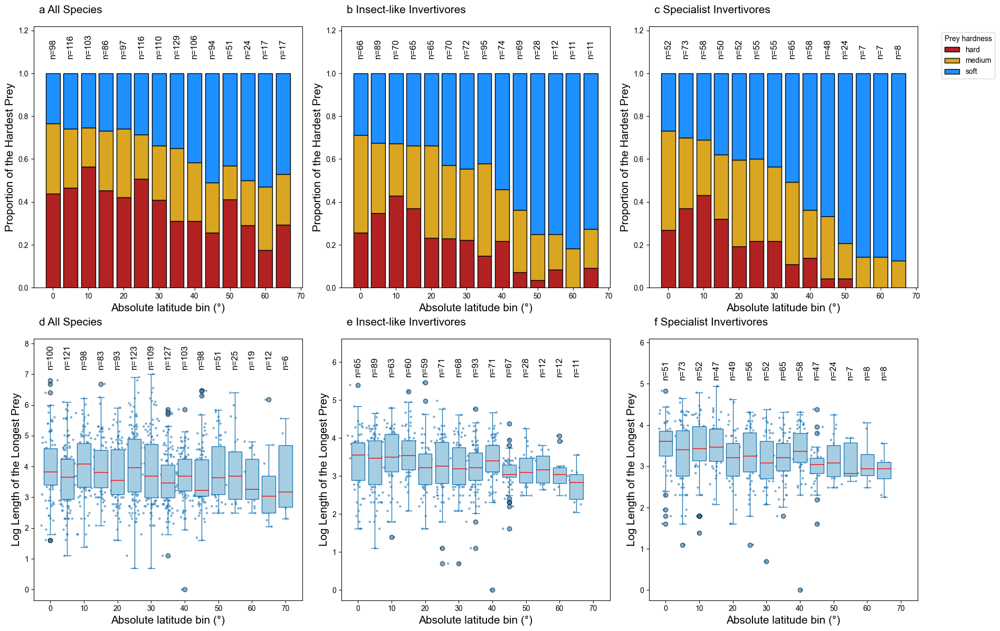

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.ticker import FormatStrFormatter

plt.rcParams["font.family"] = "Arial"

colors = {
    "hard": "#B22222",   # 暗红
    "medium": "#DAA520", # 暗金黄
    "soft": "#1E90FF"    # 暗蓝
}

boxplot_facecolor = "#a6cee3"  # 浅蓝
boxplot_edgecolor = "#1f78b4"  # 深蓝

def lat_bin(lat):
    if pd.isna(lat):
        return np.nan
    try:
        lat = abs(float(lat))
    except ValueError:
        return np.nan
    return 5 * round(lat / 5)

def select_hardest_longest_prey(group):
    hardness_order = {"hard": 2, "medium": 1, "soft": 0}
    group = group.copy()
    group["Hardness_score"] = group["Prey_Hardness"].map(hardness_order)
    max_score = group["Hardness_score"].max()
    subset = group[group["Hardness_score"] == max_score]
    return subset.loc[subset["Size"].idxmax()]

def merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6):
    df = df.copy()
    counts = df[bin_col].value_counts().sort_index()
    bins = sorted(counts.index)

    if len(bins) < 2:
        return df

    while counts.get(bins[0],0) < min_count and len(bins) > 1:
        low_bin = bins[0]
        next_bin = bins[1]
        df.loc[df[bin_col] == low_bin, bin_col] = next_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    while counts.get(bins[-1],0) < min_count and len(bins) > 1:
        high_bin = bins[-1]
        prev_bin = bins[-2]
        df.loc[df[bin_col] == high_bin, bin_col] = prev_bin
        counts = df[bin_col].value_counts().sort_index()
        bins = sorted(counts.index)

    return df

def plot_stacked_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)

    total_counts = df.groupby("Lat_bin")["Species.BirdTree"].nunique()
    
    counts = df.groupby(["Lat_bin", "Prey_Hardness"])["Species.BirdTree"].nunique().reset_index()
    pivot = counts.pivot(index="Lat_bin", columns="Prey_Hardness", values="Species.BirdTree").fillna(0)
    pivot = pivot.reindex(index=sorted(total_counts.index), columns=["hard", "medium", "soft"], fill_value=0)
    pivot_prop = pivot.div(pivot.sum(axis=1), axis=0)
    
    bottom = np.zeros(len(pivot_prop))
    for hardness in ["hard", "medium", "soft"]:
        ax.bar(
            pivot_prop.index,
            pivot_prop[hardness],
            bottom=bottom,
            label=hardness,
            color=colors[hardness],
            edgecolor="black",
            width=4
        )
        bottom += pivot_prop[hardness]

    # 样本量标注高度1.07，字体大小12，旋转90度
    for lat in pivot_prop.index:
        ax.text(lat, 1.07, f"n={total_counts.loc[lat]}", ha="center", va="bottom",
                fontsize=12, rotation=90, fontname='Arial')

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Proportion of the Hardest Prey", fontsize=15)
    ax.set_ylim(0, 1.22)
    # 标题往上右微调
    ax.text(0.02, 1.08, title, transform=ax.transAxes, fontsize=15,
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))

def plot_boxscatter_ax(df, ax, title):
    df["Lat_bin"] = df["Prey.lat"].apply(lat_bin)
    df = df.dropna(subset=["Lat_bin", "Size"])
    df = merge_extreme_small_bins(df, bin_col="Lat_bin", min_count=6)
    df["log.Size"] = np.log(df["Size"] + 1e-6)

    bins = sorted(df["Lat_bin"].unique())
    data_by_bin = [df[df["Lat_bin"] == b]["log.Size"] for b in bins]

    total_counts = df.groupby("Lat_bin").size()

    bp = ax.boxplot(data_by_bin, positions=bins, widths=4, patch_artist=True,
                    boxprops=dict(facecolor=boxplot_facecolor, color=boxplot_edgecolor),
                    medianprops=dict(color="red"),
                    whiskerprops=dict(color=boxplot_edgecolor),
                    capprops=dict(color=boxplot_edgecolor),
                    flierprops=dict(markerfacecolor=boxplot_edgecolor, marker='o', alpha=0.6))

    for i, b in enumerate(bins):
        y = data_by_bin[i]
        x = np.random.normal(b, 1, size=len(y))
        ax.scatter(x, y, color=boxplot_edgecolor, alpha=0.6, s=10, edgecolors="none")

    y_max = max([d.max() if len(d) > 0 else 0 for d in data_by_bin])
    label_height = y_max + 0.15  # 样本量标签更往下，统一对齐

    for lat in bins:
        ax.text(lat, label_height, f"n={total_counts.loc[lat]}", ha="center", va="bottom",
                fontsize=12, fontname='Arial', rotation=90)

    ax.set_xlabel("Absolute latitude bin (°)", fontsize=15)
    ax.set_ylabel("Log Length of the Longest Prey", fontsize=15)
    ax.set_ylim(bottom=None, top=label_height + 1.0)  # y轴范围更大，留空间
    # 标题往上右微调
    ax.text(0.02, 1.08, title, transform=ax.transAxes, fontsize=15,
            va='top', ha='left', fontname='Arial')

    ticks_to_show = [0,10,20,30,40,50,60,70]
    ax.set_xticks(ticks_to_show)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.set_xlim(min(ticks_to_show) - 5, max(ticks_to_show) + 5)

# ===== 数据处理 =====
df_hardest = df.groupby("Species.BirdTree").apply(select_hardest_longest_prey).reset_index(drop=True)
species_type1 = df_hardest[df_hardest["Size.Type"] == 1]["Species.BirdTree"].unique()
df_type1 = df_hardest[df_hardest["Species.BirdTree"].isin(species_type1)].copy()
species_invertivore = df_type1[df_type1["Trophic.Niche"] == "Invertivore"]["Species.BirdTree"].unique()
df_invertivore = df_type1[df_type1["Species.BirdTree"].isin(species_invertivore)].copy()

df_longest = df.loc[df.groupby("Species.BirdTree")["Size"].idxmax()].reset_index(drop=True)
df_longest_type1 = df_longest[df_longest["Size.Type"] == 1].copy()
species_invertivore_longest = df_longest_type1[df_longest_type1["Trophic.Niche"] == "Invertivore"]["Species.BirdTree"].unique()
df_longest_invertivore = df_longest_type1[df_longest_type1["Species.BirdTree"].isin(species_invertivore_longest)].copy()

# ===== 绘图 =====
fig, axes = plt.subplots(2, 3, figsize=(18, 12), sharex=False)

titles_top = ["a All Species", "b Insect-like Invertivores", "c Specialist Invertivores"]
titles_bottom = ["d All Species", "e Insect-like Invertivores", "f Specialist Invertivores"]

plot_stacked_ax(df_hardest, axes[0,0], titles_top[0])
plot_stacked_ax(df_type1, axes[0,1], titles_top[1])
plot_stacked_ax(df_invertivore, axes[0,2], titles_top[2])

plot_boxscatter_ax(df_longest, axes[1,0], titles_bottom[0])
plot_boxscatter_ax(df_longest_type1, axes[1,1], titles_bottom[1])
plot_boxscatter_ax(df_longest_invertivore, axes[1,2], titles_bottom[2])

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, title="Prey hardness", loc="upper right", bbox_to_anchor=(1.05, 0.95), borderaxespad=0)

plt.tight_layout(rect=[0,0,0.98,1])
plt.show()


# 分布地图

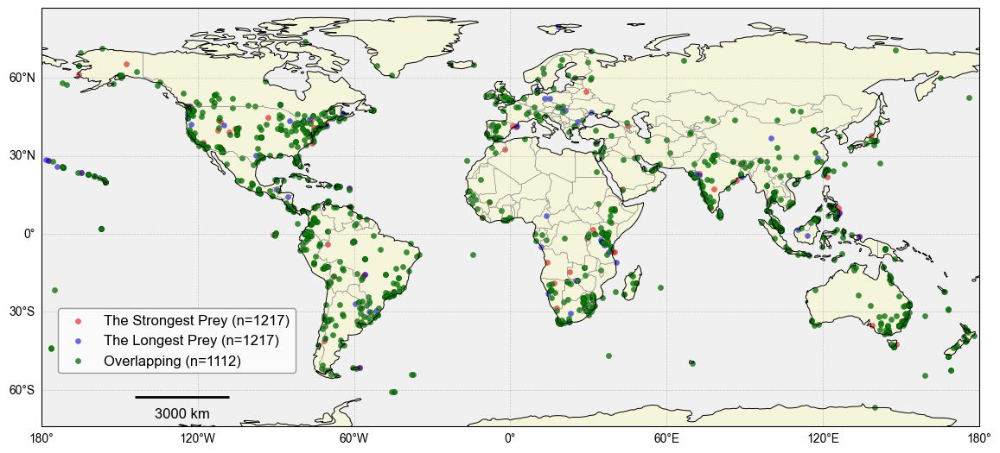

In [4]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.gridliner as gridliner
import pandas as pd

plt.rcParams['font.family'] = 'Arial'

def fix_minus_sign(x):
    if isinstance(x, str):
        return x.replace('−', '-')
    return x

# 假设 df 已经存在
total_samples = len(df)
df['row_id'] = df.index

# ====== 核心改动：和回归一样，排除 Size 和 log_Beak_volume 缺失的行 ======
df = df[df['Size'].notna() & df['log_Beak_volume'].notna()].copy()

# --- 找每个物种最硬 ---
strongest_idx = (
    df.loc[df['Prey_Strength'].notna()]
    .sort_values(['Species.BirdTree', 'Prey_Strength', 'Size'], ascending=[True, False, False])
    .groupby('Species.BirdTree', as_index=False)
    .first()['row_id']
)

# --- 找每个物种最长 ---
longest_idx = (
    df
    .sort_values(['Species.BirdTree', 'Size'], ascending=[True, False])
    .groupby('Species.BirdTree', as_index=False)
    .first()['row_id']
)

# --- 转集合 ---
strong_ids = set(strongest_idx)
long_ids = set(longest_idx)
overlap_ids = strong_ids & long_ids
only_strong_ids = strong_ids - overlap_ids
only_long_ids = long_ids - overlap_ids

# --- 统计数量（原始数据里的总数） ---
strong_total = len(df[df['row_id'].isin(strong_ids)])
long_total = len(df[df['row_id'].isin(long_ids)])
overlap_total = len(df[df['row_id'].isin(overlap_ids)])

# --- 清理坐标 ---
def clean_coords(sub_df):
    sub_df = sub_df.copy()
    sub_df['Prey.lat'] = sub_df['Prey.lat'].apply(fix_minus_sign)
    sub_df['Prey.long'] = sub_df['Prey.long'].apply(fix_minus_sign)
    sub_df['Prey.lat'] = pd.to_numeric(sub_df['Prey.lat'], errors='coerce')
    sub_df['Prey.long'] = pd.to_numeric(sub_df['Prey.long'], errors='coerce')
    return sub_df.dropna(subset=['Prey.lat', 'Prey.long'])

only_strong_df = clean_coords(df[df['row_id'].isin(only_strong_ids)])
only_long_df = clean_coords(df[df['row_id'].isin(only_long_ids)])
overlap_df = clean_coords(df[df['row_id'].isin(overlap_ids)])

# --- 绘图 ---
plt.figure(figsize=(14,7))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.set_facecolor('#f0f0f0')
ax.add_feature(cfeature.LAND, facecolor='#f5f5dc')
ax.add_feature(cfeature.BORDERS, edgecolor='gray', linewidth=0.5)
ax.add_feature(cfeature.COASTLINE, linewidth=0.7)

gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xformatter = gridliner.LongitudeFormatter()
gl.yformatter = gridliner.LatitudeFormatter()
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

sc1 = ax.scatter(only_strong_df['Prey.long'], only_strong_df['Prey.lat'],
                 s=20, color='red', alpha=0.6, edgecolors='black', linewidth=0.2,
                 transform=ccrs.PlateCarree(),
                 label=f'The Strongest Prey (n={strong_total})')

sc2 = ax.scatter(only_long_df['Prey.long'], only_long_df['Prey.lat'],
                 s=20, color='blue', alpha=0.6, edgecolors='black', linewidth=0.2,
                 transform=ccrs.PlateCarree(),
                 label=f'The Longest Prey (n={long_total})')

sc3 = ax.scatter(overlap_df['Prey.long'], overlap_df['Prey.lat'],
                 s=20, color='green', alpha=0.8, edgecolors='black', linewidth=0.2,
                 transform=ccrs.PlateCarree(),
                 label=f'Overlapping (n={overlap_total})')

# 比例尺
scale_bar_length = 3000  # km
scale_bar_x = 0.15
scale_bar_y = 0.07
ax.hlines(scale_bar_y, scale_bar_x - 0.05, scale_bar_x + 0.05,
          transform=ax.transAxes, colors='k', linewidth=2)
ax.text(scale_bar_x, scale_bar_y - 0.05, f'{scale_bar_length} km',
        transform=ax.transAxes, fontsize=12, ha='center')

# 图例
legend = ax.legend(loc='lower left',
                   bbox_to_anchor=(scale_bar_x - 0.14, scale_bar_y + 0.04),
                   frameon=True, edgecolor='gray', fontsize=12)

plt.show()


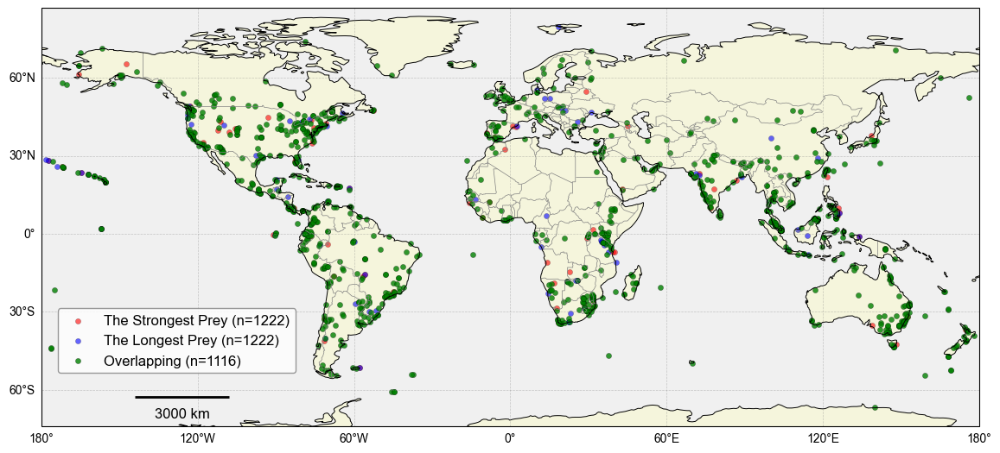

In [11]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.gridliner as gridliner
import pandas as pd

plt.rcParams['font.family'] = 'Arial'

def fix_minus_sign(x):
    if isinstance(x, str):
        return x.replace('−', '-')
    return x

# 假设 df 已经存在
total_samples = len(df)
df['row_id'] = df.index

# --- 找每个物种最硬 ---
strongest_idx = (
    df.loc[df['Prey_Strength'].notna()]
    .sort_values(['Species.BirdTree', 'Prey_Strength', 'Size'], ascending=[True, False, False])
    .groupby('Species.BirdTree', as_index=False)
    .first()['row_id']
)

# --- 找每个物种最长 ---
longest_idx = (
    df.loc[df['Size'].notna()]
    .sort_values(['Species.BirdTree', 'Size'], ascending=[True, False])
    .groupby('Species.BirdTree', as_index=False)
    .first()['row_id']
)

# --- 转集合 ---
strong_ids = set(strongest_idx)
long_ids = set(longest_idx)
overlap_ids = strong_ids & long_ids
only_strong_ids = strong_ids - overlap_ids
only_long_ids = long_ids - overlap_ids

# --- 统计数量（原始数据里的总数） ---
strong_total = len(df[df['row_id'].isin(strong_ids)])
long_total = len(df[df['row_id'].isin(long_ids)])
overlap_total = len(df[df['row_id'].isin(overlap_ids)])

# --- 筛选绘图数据 ---
def clean_coords(sub_df):
    sub_df = sub_df.copy()
    sub_df['Prey.lat'] = sub_df['Prey.lat'].apply(fix_minus_sign)
    sub_df['Prey.long'] = sub_df['Prey.long'].apply(fix_minus_sign)
    sub_df['Prey.lat'] = pd.to_numeric(sub_df['Prey.lat'], errors='coerce')
    sub_df['Prey.long'] = pd.to_numeric(sub_df['Prey.long'], errors='coerce')
    return sub_df.dropna(subset=['Prey.lat', 'Prey.long'])

only_strong_df = clean_coords(df[df['row_id'].isin(only_strong_ids)])
only_long_df = clean_coords(df[df['row_id'].isin(only_long_ids)])
overlap_df = clean_coords(df[df['row_id'].isin(overlap_ids)])

# --- 绘图 ---
plt.figure(figsize=(14,7))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.set_facecolor('#f0f0f0')
ax.add_feature(cfeature.LAND, facecolor='#f5f5dc')
ax.add_feature(cfeature.BORDERS, edgecolor='gray', linewidth=0.5)
ax.add_feature(cfeature.COASTLINE, linewidth=0.7)

# 网格线
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xformatter = gridliner.LongitudeFormatter()
gl.yformatter = gridliner.LatitudeFormatter()
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

# 三类点
sc1 = ax.scatter(only_strong_df['Prey.long'], only_strong_df['Prey.lat'],
                 s=20, color='red', alpha=0.6, edgecolors='black', linewidth=0.2,
                 transform=ccrs.PlateCarree(),
                 label=f'The Strongest Prey (n={strong_total})')

sc2 = ax.scatter(only_long_df['Prey.long'], only_long_df['Prey.lat'],
                 s=20, color='blue', alpha=0.6, edgecolors='black', linewidth=0.2,
                 transform=ccrs.PlateCarree(),
                 label=f'The Longest Prey (n={long_total})')

sc3 = ax.scatter(overlap_df['Prey.long'], overlap_df['Prey.lat'],
                 s=20, color='green', alpha=0.8, edgecolors='black', linewidth=0.2,
                 transform=ccrs.PlateCarree(),
                 label=f'Overlapping (n={overlap_total})')  # 改名字


# 比例尺
scale_bar_length = 3000  # km
scale_bar_x = 0.15
scale_bar_y = 0.07
ax.hlines(scale_bar_y, scale_bar_x - 0.05, scale_bar_x + 0.05,
          transform=ax.transAxes, colors='k', linewidth=2)
ax.text(scale_bar_x, scale_bar_y - 0.05, f'{scale_bar_length} km',
        transform=ax.transAxes, fontsize=12, ha='center')

# 图例
legend = ax.legend(loc='lower left',
                   bbox_to_anchor=(scale_bar_x - 0.14, scale_bar_y + 0.04),  # 往左挪
                   frameon=True, edgecolor='gray', fontsize=12)

plt.show()


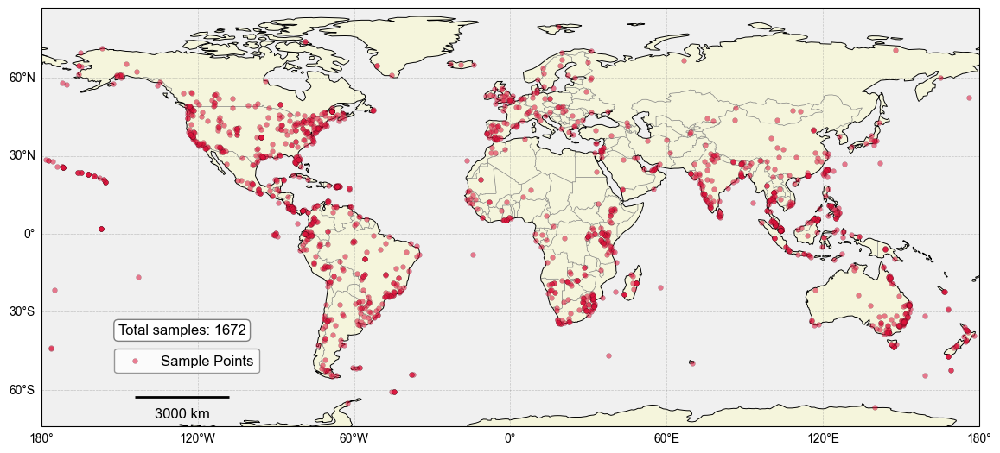

In [3]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.gridliner as gridliner
import pandas as pd

plt.rcParams['font.family'] = 'Arial'

def fix_minus_sign(x):
    if isinstance(x, str):
        return x.replace('−', '-')
    return x

# 样本总数（包含经纬度缺失的）
total_samples = len(df)

# 有经纬度的样本
df_map = df.dropna(subset=['Prey.lat', 'Prey.long']).copy()
df_map['Prey.lat'] = df_map['Prey.lat'].apply(fix_minus_sign)
df_map['Prey.long'] = df_map['Prey.long'].apply(fix_minus_sign)
df_map['Prey.lat'] = pd.to_numeric(df_map['Prey.lat'], errors='coerce')
df_map['Prey.long'] = pd.to_numeric(df_map['Prey.long'], errors='coerce')
df_map = df_map.dropna(subset=['Prey.lat', 'Prey.long'])

lats = df_map['Prey.lat'].values
lons = df_map['Prey.long'].values

plt.figure(figsize=(14,7))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.set_facecolor('#f0f0f0')
ax.add_feature(cfeature.LAND, facecolor='#f5f5dc')
ax.add_feature(cfeature.BORDERS, edgecolor='gray', linewidth=0.5)
ax.add_feature(cfeature.COASTLINE, linewidth=0.7)

gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xformatter = gridliner.LongitudeFormatter()
gl.yformatter = gridliner.LatitudeFormatter()
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

sc = ax.scatter(lons, lats, s=18, color='crimson', alpha=0.55,
                edgecolors='black', linewidth=0.15, transform=ccrs.PlateCarree(), zorder=5,
                label='Sample Points')

# 比例尺
scale_bar_length = 3000  # km
scale_bar_x = 0.15
scale_bar_y = 0.07

ax.hlines(scale_bar_y, scale_bar_x - 0.05, scale_bar_x + 0.05,
          transform=ax.transAxes, colors='k', linewidth=2)
ax.text(scale_bar_x, scale_bar_y - 0.05, f'{scale_bar_length} km',
        transform=ax.transAxes, fontsize=12, ha='center')

# 样本总数（放在左下角，图例上方）
ax.text(scale_bar_x, scale_bar_y + 0.15, f'Total samples: {total_samples}',
        transform=ax.transAxes, fontsize=12, ha='center',
        bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.3'))

# 图例（比例尺下面一点）
legend = ax.legend(loc='lower left',
                   bbox_to_anchor=(scale_bar_x - 0.08, scale_bar_y + 0.04),
                   frameon=True, edgecolor='gray', fontsize=12)

plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.348e-15 t=-8.131e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:9.177e-13 t=-7.256e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:3.349e-53 t=-1.650e+01


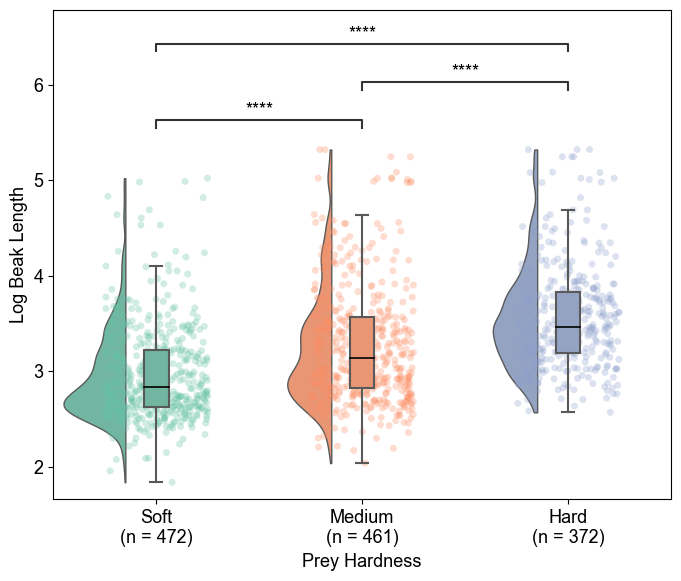

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.161e-12 t=-7.210e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:3.413e-31 t=-1.211e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:3.763e-79 t=-2.101e+01


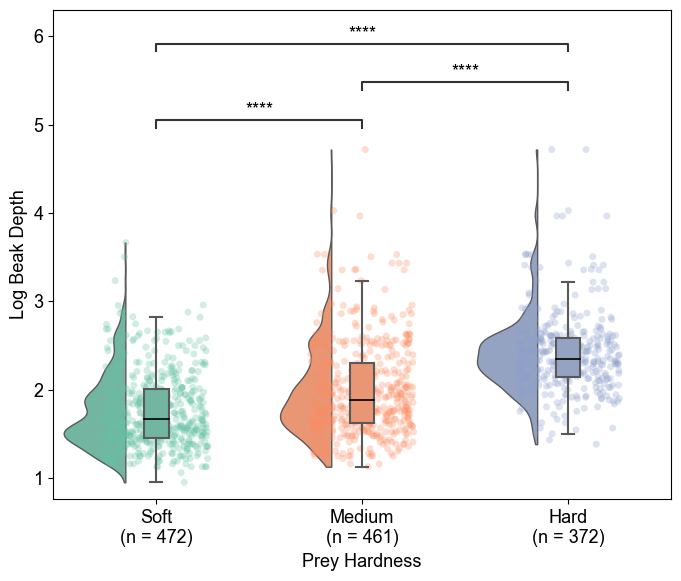

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.457e-10 t=-6.483e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.246e-32 t=-1.242e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.374e-77 t=-2.071e+01


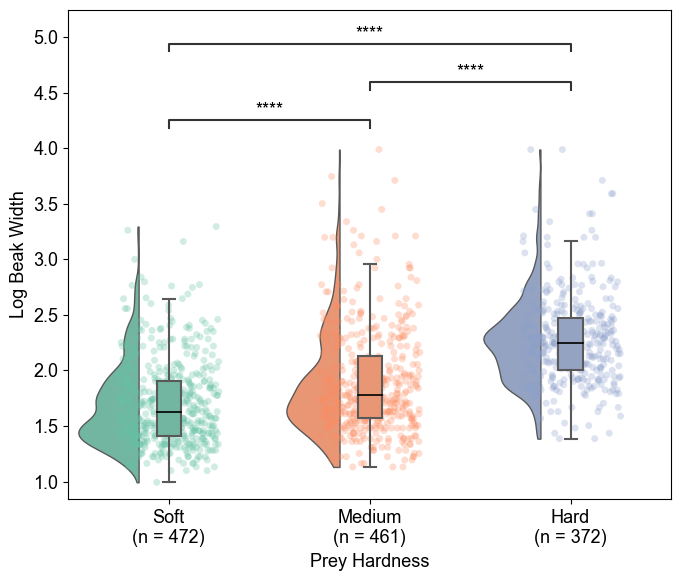

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.052e-14 t=-7.861e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.641e-28 t=-1.145e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:9.581e-80 t=-2.111e+01


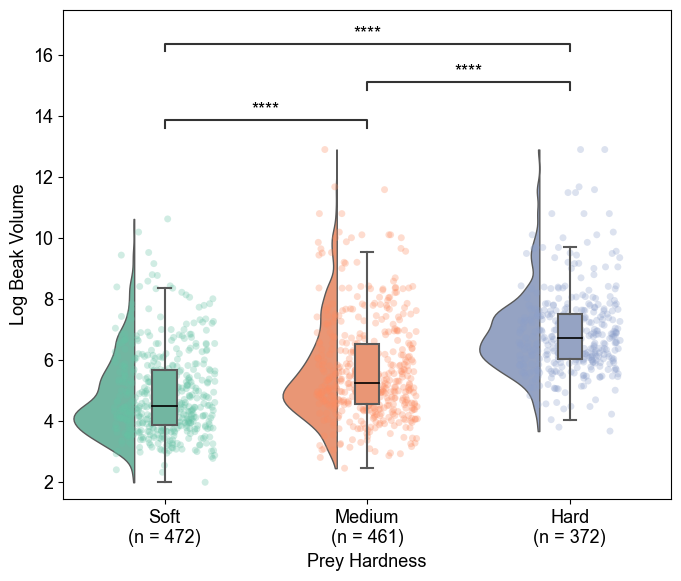

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.203e-12 t=-7.062e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.121e-34 t=-1.287e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.946e-83 t=-2.173e+01


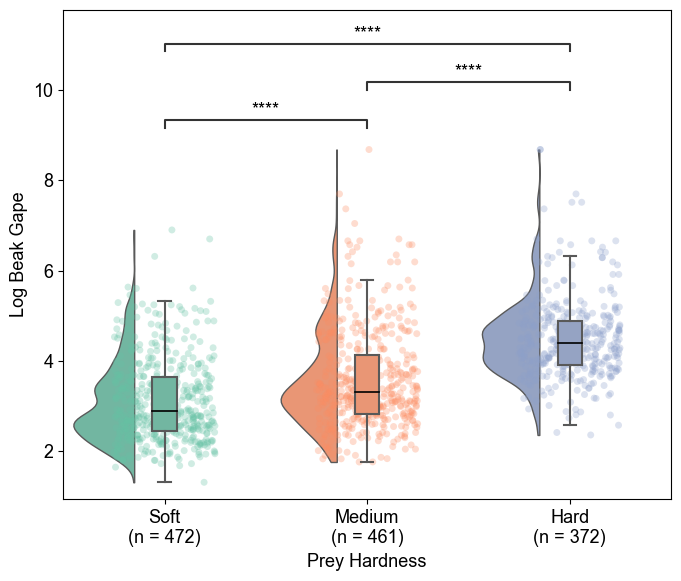

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:4.053e-02 t=-2.051e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:3.723e-11 t=6.705e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:5.292e-07 t=5.055e+00


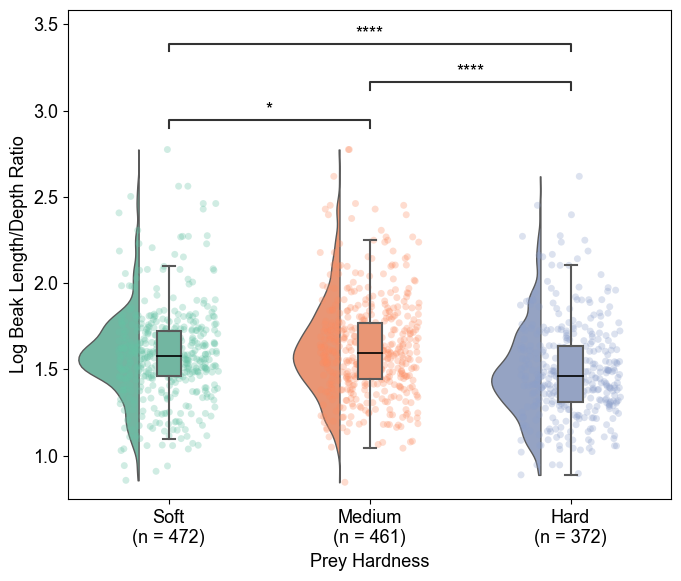

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:2.854e-10 t=-6.376e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.167e-04 t=-3.871e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.569e-23 t=-1.030e+01


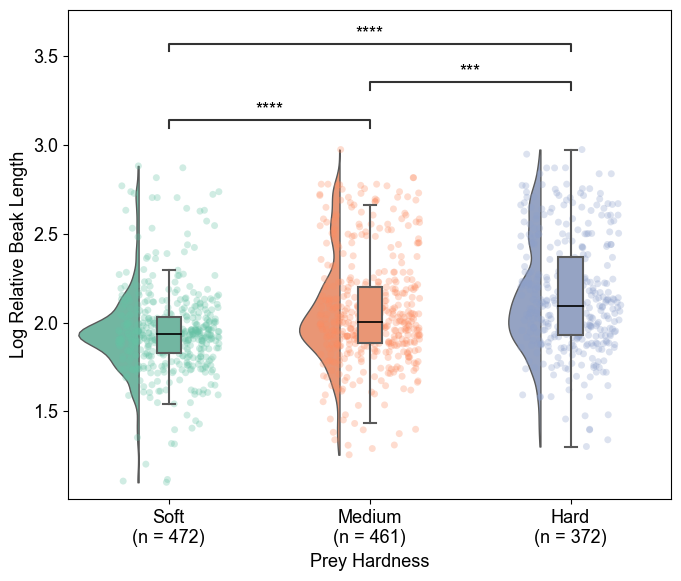

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:2.352e-03 t=-3.050e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:4.854e-31 t=-1.207e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:5.516e-53 t=-1.646e+01


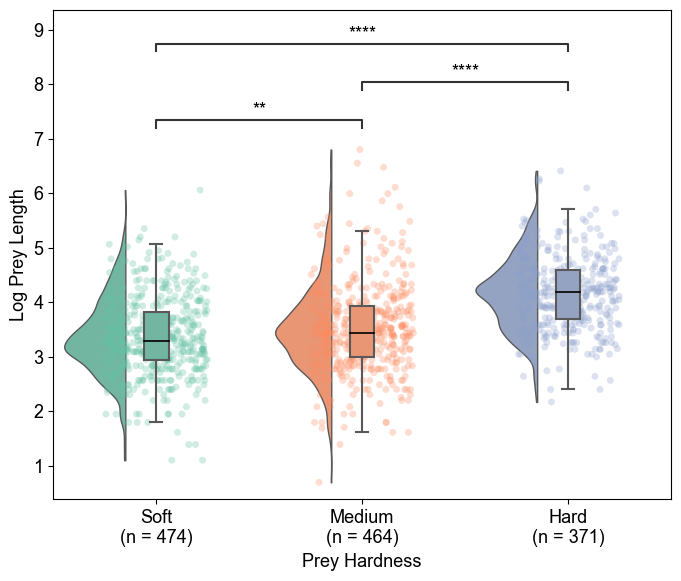

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:7.281e-07 t=-5.004e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:8.663e-23 t=-1.032e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.579e-45 t=-1.546e+01


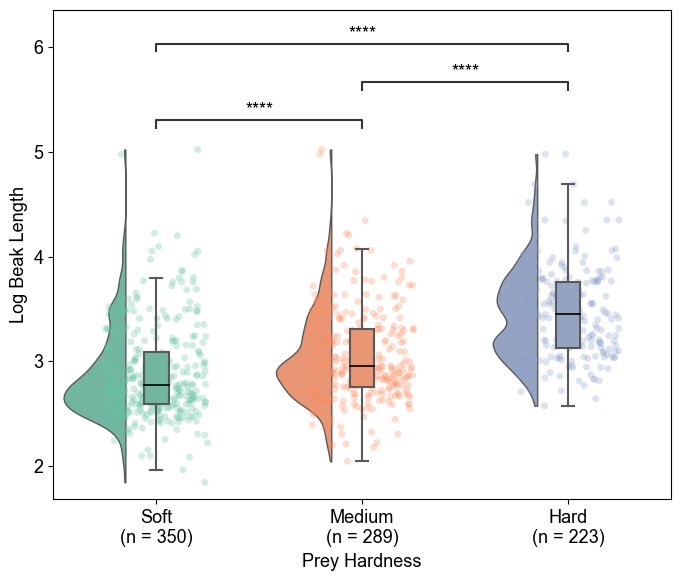

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.350e-06 t=-4.879e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:9.176e-37 t=-1.374e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:4.814e-66 t=-1.965e+01


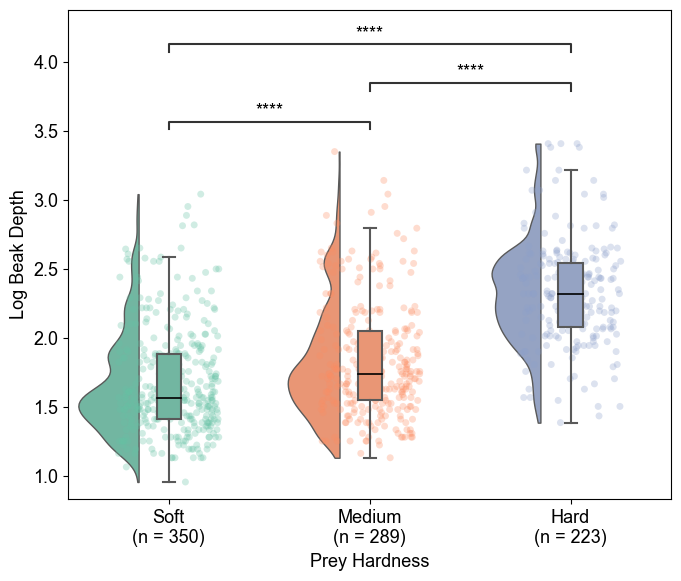

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:5.099e-07 t=-5.075e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:5.316e-35 t=-1.333e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.900e-66 t=-1.973e+01


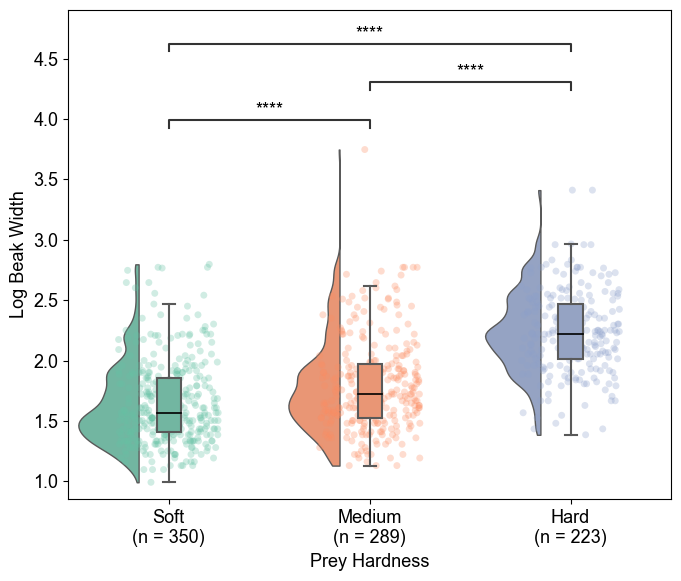

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.347e-07 t=-5.332e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.733e-35 t=-1.344e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:8.946e-66 t=-1.960e+01


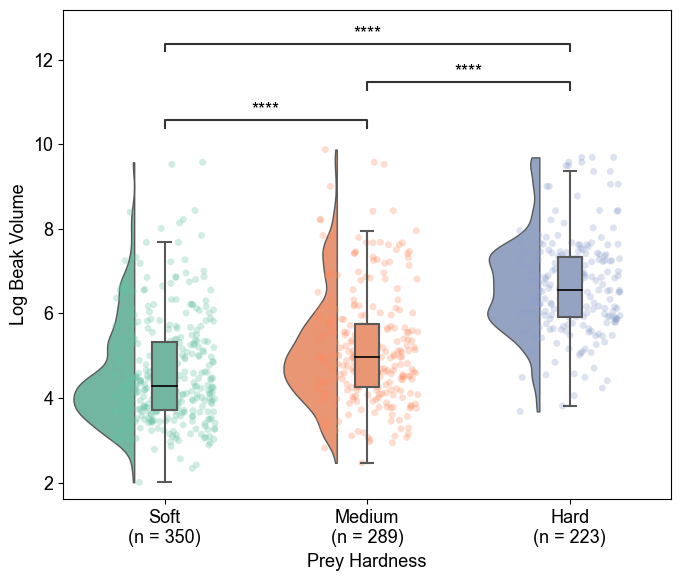

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.652e-07 t=-5.140e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.220e-38 t=-1.410e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:6.355e-70 t=-2.041e+01


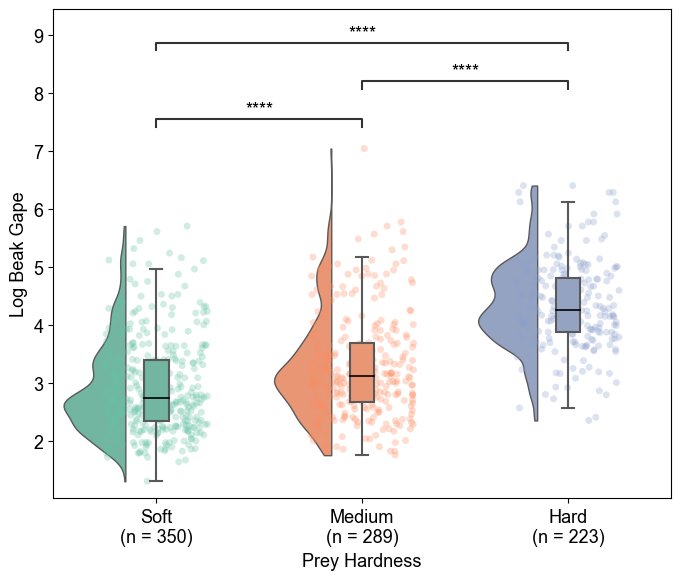

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:9.448e-01 t=6.931e-02
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.472e-08 t=5.758e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.927e-09 t=6.103e+00


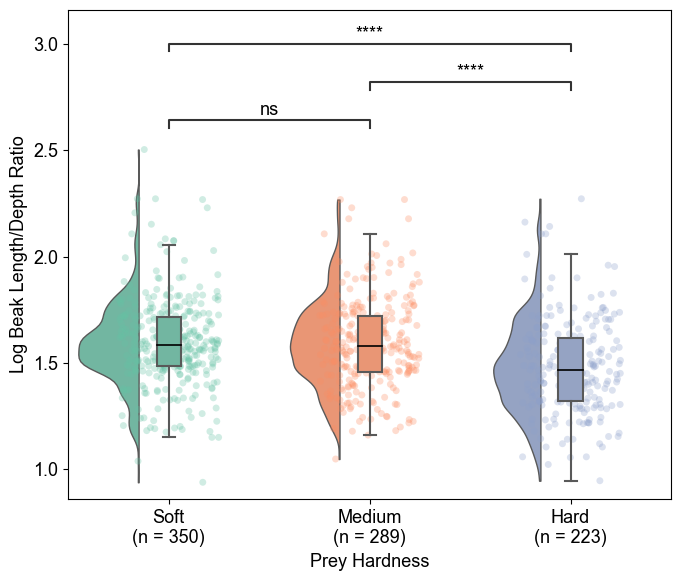

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:6.757e-07 t=-5.019e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.267e-09 t=-6.186e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.048e-26 t=-1.126e+01


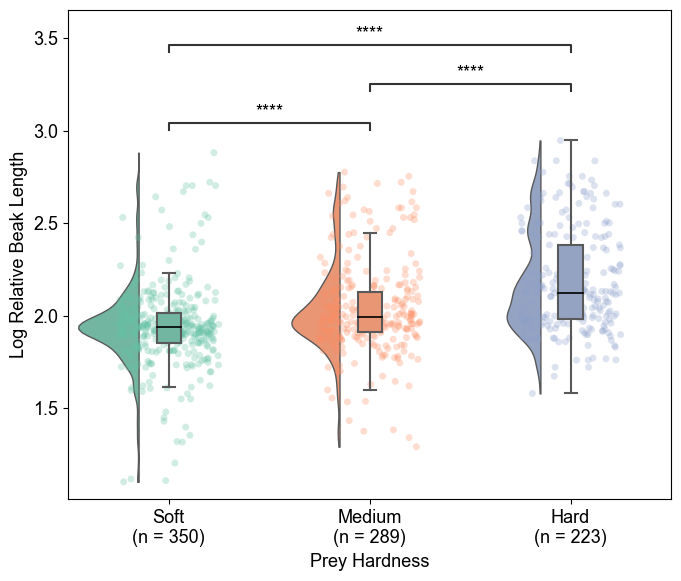

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.880e-02 t=-2.355e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:6.330e-24 t=-1.062e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.159e-41 t=-1.469e+01


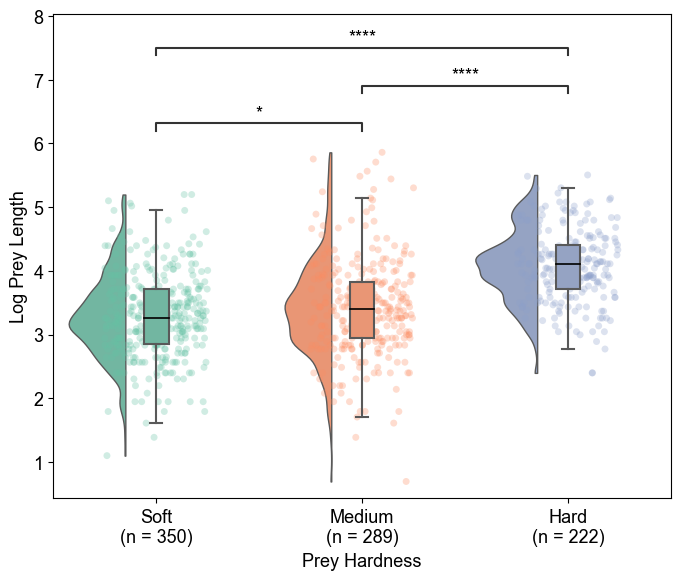

In [ ]:
# 筛选所有猎物，包括 Size.Type=1 的物种
species_with_invert = df[df['Size.Type'] == 1]['Species.BirdTree'].unique()
df1 = df[df['Species.BirdTree'].isin(species_with_invert)].copy()

# 筛选专门食虫鸟的物种（Avonet中Trophic.Niche为Invertivore，且Size.Type=1）
invertivore_species = df[df['Trophic.Niche'] == 'Invertivore']['Species.BirdTree'].unique()
df2 = df[df['Species.BirdTree'].isin(invertivore_species)].copy()

# 你给的绘图函数，封装成一个函数方便调用
def plot_hardness_associations(df_plot):
    import ptitprince as pt
    import seaborn as sns
    import matplotlib.pyplot as plt
    from statannotations.Annotator import Annotator
    from pandas.api.types import CategoricalDtype

    plot_vars = {
        'log_Beak.Length_Culmen':"Log Beak Length",
        'log_Beak.Depth': 'Log Beak Depth',
        'log_Beak.Width': 'Log Beak Width',
        'log_Beak_volume': 'Log Beak Volume',
        'log_Beak_gape': 'Log Beak Gape',
        'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio',
        'log_Beak_rel_length': 'Log Relative Beak Length' ,
        'log_Size': 'Log Prey Length',
    }

    hardness_order = ["Soft", "Medium", "Hard"]
    palette = {"Soft": "#66c2a5", "Medium": "#fc8d62", "Hard": "#8da0cb"}

    df_plot['Prey_Hardness'] = df_plot['Prey_Hardness'].str.strip().str.capitalize()
    hardness_type = CategoricalDtype(categories=hardness_order, ordered=True)
    df_plot['Prey_Hardness'] = df_plot['Prey_Hardness'].astype(hardness_type)

    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 13

    for var, label in plot_vars.items():
        sample_counts = df_plot.groupby('Prey_Hardness')[var].count()
        xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in hardness_order]

        plt.figure(figsize=(7, 6))
        ax = plt.gca()

        pt.half_violinplot(
            x='Prey_Hardness', y=var, data=df_plot,
            palette=palette, bw=.2, cut=0., scale="area",
            width=.6, inner=None, orient="v", linewidth=1,
            order=hardness_order, ax=ax, zorder=-1
        )

        sns.boxplot(
            x='Prey_Hardness', y=var, data=df_plot,
            order=hardness_order, palette=palette, width=.12,
            showcaps=True,
            boxprops={"zorder": 10},
            whiskerprops={"linewidth": 1.5, "zorder": 10},
            medianprops={"color": "black", "linewidth": 1.2},
            showfliers=False, zorder=10
        )

        sns.stripplot(
            x='Prey_Hardness', y=var, data=df_plot,
            order=hardness_order, palette=palette,
            jitter=0.25, alpha=0.3, zorder=0
        )

        comparisons = [("Soft", "Medium"), ("Soft", "Hard"), ("Medium", "Hard")]
        annotator = Annotator(ax, comparisons, data=df_plot,
                              x='Prey_Hardness', y=var,
                              order=hardness_order)
        annotator.configure(test='t-test_ind', text_format='star',
                            loc='inside', comparisons_correction="fdr_bh")
        annotator.apply_and_annotate()

        ax.set_xticklabels(xtick_labels)
        plt.xlabel("Prey Hardness")
        plt.ylabel(label)
        plt.tight_layout()
        plt.show()

# 分别画两组
plot_hardness_associations(df1)
plot_hardness_associations(df2)


# 不同硬度分类比较喙形态

## 补充分析

In [48]:
df = df.rename(columns={
    'log_Beak.Length_Culmen': 'log_Beak_Length_Culmen',
    'log_Beak.Depth': 'log_Beak_Depth'
})


import statsmodels.formula.api as smf
from statsmodels.stats.anova import anova_lm

# 喙深 vs 猎物硬度
model_depth = smf.ols('log_Beak_Depth ~ C(Prey_Strength)', data=df).fit()
anova_lm(model_depth)




,df,sum_sq,mean_sq,F,PR(>F)
C(Prey_Strength),2.0,176.968045,88.484022,322.580786,4.232054e-119
Residual,1662.0,455.887180,0.274300,NaN,NaN


In [49]:
# 喙长 vs 猎物硬度
model_length = smf.ols('log_Beak_Length_Culmen ~ C(Prey_Strength)', data=df).fit()
anova_lm(model_length)

,df,sum_sq,mean_sq,F,PR(>F)
C(Prey_Strength),2.0,178.027440,89.013720,214.460659,1.392376e-83
Residual,1662.0,689.827234,0.415059,NaN,NaN


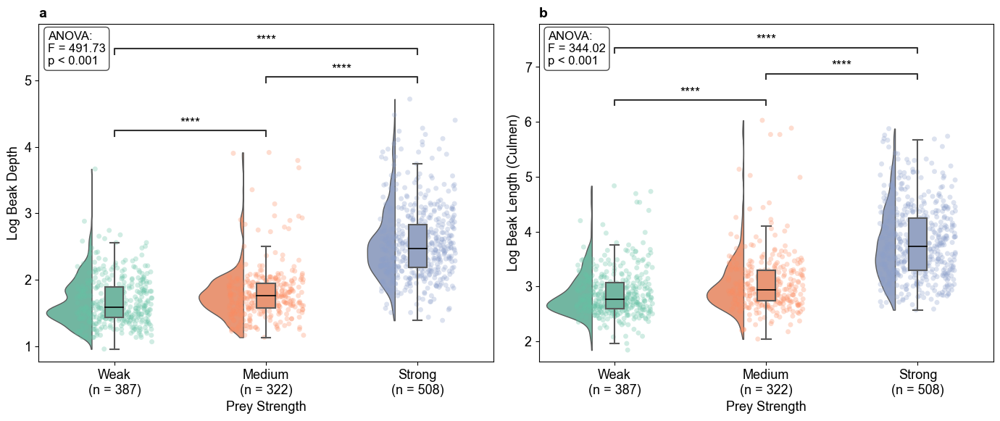

In [31]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ptitprince as pt
from pandas.api.types import CategoricalDtype
import statsmodels.formula.api as smf
from statsmodels.stats.anova import anova_lm
from statannotations.Annotator import Annotator

# ========== 1) 复制并把列名里的 "." 改为 "_" ==========
df_plot = df.copy()
df_plot.columns = df_plot.columns.str.replace('.', '_', regex=False)

# ========== 2) 每个物种保留“最强硬且尺寸最大”的那条记录 ==========
def filter_strongest(dfin):
    strength_order_map = {"Weak": 0, "Medium": 1, "Strong": 2}
    d = dfin.copy()
    d['Prey_Strength'] = d['Prey_Strength'].astype(str).str.strip().str.capitalize()
    d['StrengthRank'] = d['Prey_Strength'].map(strength_order_map)
    d = d.dropna(subset=['Species_BirdTree', 'Prey_Strength', 'Size'])
    d = d.sort_values(by=['Species_BirdTree', 'StrengthRank', 'Size'],
                      ascending=[True, False, False])
    d = d.groupby('Species_BirdTree', as_index=False).head(1)
    d = d.drop(columns='StrengthRank')
    return d

df_all = filter_strongest(df_plot)

# 只保留绘图所需列，并去掉缺失
needed = ['Prey_Strength', 'log_Beak_Depth', 'log_Beak_Length_Culmen']
df_all = df_all.dropna(subset=needed).copy()

# ========== 3) 分类顺序 & 调色 ==========
strength_order = ["Weak", "Medium", "Strong"]
strength_type = CategoricalDtype(categories=strength_order, ordered=True)
df_all['Prey_Strength'] = df_all['Prey_Strength'].astype(strength_type)
palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

# ========== 4) 绘制两个子图（左：喙深；右：喙长），F/p + t检验星号 ==========
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)
abc = ['a', 'b']
var_map = [
    ('log_Beak_Depth', 'Log Beak Depth'),
    ('log_Beak_Length_Culmen', 'Log Beak Length (Culmen)')
]

def format_p(p_val):
    if p_val < 0.001:
        return "p < 0.001"
    elif p_val < 0.01:
        return "p < 0.01"
    elif p_val < 0.05:
        return "p < 0.05"
    else:
        return f"p = {p_val:.2f}"

for k, (var, y_label) in enumerate(var_map):
    ax = axes[k]

    # 样本量
    counts = df_all.groupby('Prey_Strength')[var].count()
    xtick_labels = [f"{g}\n(n = {counts.get(g, 0)})" for g in strength_order]

    # 半小提琴
    pt.half_violinplot(
        x='Prey_Strength', y=var, data=df_all,
        palette=palette, bw=.2, cut=0., scale="area",
        width=.6, inner=None, orient="v", linewidth=1,
        order=strength_order, ax=ax, zorder=-1
    )

    # 箱线
    sns.boxplot(
        x='Prey_Strength', y=var, data=df_all,
        order=strength_order, palette=palette, width=.12,
        showcaps=True,
        boxprops={"zorder": 10},
        whiskerprops={"linewidth": 1.5, "zorder": 10},
        medianprops={"color": "black", "linewidth": 1.2},
        showfliers=False, zorder=10, ax=ax
    )

    # 散点（轻微抖动 + 透明度）
    sns.stripplot(
        x='Prey_Strength', y=var, data=df_all,
        order=strength_order, palette=palette,
        jitter=0.25, alpha=0.3, zorder=0, ax=ax
    )

    # ANOVA：y ~ C(Prey_Strength)
    model = smf.ols(f'{var} ~ C(Prey_Strength)', data=df_all).fit()
    aov = anova_lm(model)
    F_val = aov.loc['C(Prey_Strength)', 'F']
    p_val = aov.loc['C(Prey_Strength)', 'PR(>F)']
    p_text = format_p(p_val)

    # F/p 标注：左上角
    ax.text(0.02, 0.98, f"ANOVA:\nF = {F_val:.2f}\n{p_text}",
            transform=ax.transAxes, ha='left', va='top',
            fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    # t检验显著性星号
    comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
    annotator = Annotator(ax, comparisons, data=df_all,
                          x='Prey_Strength', y=var,
                          order=strength_order)
    annotator.configure(test='t-test_ind', text_format='star',
                        loc='inside',  # 显示在箱线图上方
                        comparisons_correction="fdr_bh",
                        verbose=0)
    annotator.apply_and_annotate()

    # 轴 & 样本量
    ax.set_xticklabels(xtick_labels)
    ax.set_xlabel("Prey Strength")
    ax.set_ylabel(y_label)
    ax.text(0, 1.05, f"{abc[k]}",
            transform=ax.transAxes, fontsize=14,
            fontweight='bold', va='top', ha='left')

plt.tight_layout()
plt.show()


In [22]:
import pandas as pd
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# ======= 筛选每个物种 Size 最大的个体 =======
def filter_strongest(df):
    strength_order = {"Weak": 0, "Medium": 1, "Strong": 2}
    df = df.copy()
    df['Prey_Strength'] = df['Prey_Strength'].str.strip().str.capitalize()
    df['StrengthRank'] = df['Prey_Strength'].map(strength_order)
    df = df.sort_values(by=['Species.BirdTree', 'StrengthRank', 'Size'],
                        ascending=[True, False, False])
    df = df.groupby('Species.BirdTree').head(1)
    df = df.drop(columns='StrengthRank')
    return df

# ======= 绘图函数 =======
def plot_all_prey_with_ttest(df_all):
    plot_vars = {
        'log_Beak_Length_Culmen': 'Log Beak Length (Culmen)',
        'log_Beak_Depth': 'Log Beak Depth'
    }

    strength_order = ["Weak", "Medium", "Strong"]
    palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}
    strength_type = CategoricalDtype(categories=strength_order, ordered=True)

    df_all['Prey_Strength'] = df_all['Prey_Strength'].astype(strength_type)

    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 13

    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)
    abc_labels = ['a', 'b']

    for i, (var, label) in enumerate(plot_vars.items()):
        ax = axes[i]

        sample_counts = df_all.groupby('Prey_Strength')[var].count()
        xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp,0)})" for grp in strength_order]

        # 半小提琴图
        pt.half_violinplot(
            x='Prey_Strength', y=var, data=df_all,
            palette=palette, bw=.2, cut=0., scale="area",
            width=.6, inner=None, orient="v", linewidth=1,
            order=strength_order, ax=ax, zorder=-1
        )

        # 箱线图
        sns.boxplot(
            x='Prey_Strength', y=var, data=df_all,
            order=strength_order, palette=palette, width=.12,
            showcaps=True,
            boxprops={"zorder": 10},
            whiskerprops={"linewidth": 1.5, "zorder": 10},
            medianprops={"color": "black", "linewidth": 1.2},
            showfliers=False, zorder=10, ax=ax
        )

        # 散点图
        sns.stripplot(
            x='Prey_Strength', y=var, data=df_all,
            order=strength_order, palette=palette,
            jitter=0.25, alpha=0.3, zorder=0, ax=ax
        )

        # t检验显著性标注
        comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
        annotator = Annotator(ax, comparisons, data=df_all,
                              x='Prey_Strength', y=var, order=strength_order)
        annotator.configure(test='t-test_ind', text_format='star',
                            loc='inside', comparisons_correction="fdr_bh")
        annotator.apply_and_annotate()

        ax.set_xticklabels(xtick_labels)
        ax.set_xlabel("Prey Strength")
        ax.set_ylabel(label)

        # 子图标题
        ax.text(0, 1.05, f"{abc_labels[i]} All prey",
                transform=ax.transAxes, fontsize=14,
                fontweight='bold', va='top', ha='left')

    plt.tight_layout()
    plt.show()

# ======= 数据准备 =======
df_all = filter_strongest(df.copy())  # 只保留 All prey
df_all = df_all.dropna(subset=['Prey_Strength', 'log_Beak_Length_Culmen', 'log_Beak_Depth'])

# ======= 绘图调用 =======
plot_all_prey_with_ttest(df_all)


KeyError: ['log_Beak_Length_Culmen', 'log_Beak_Depth']

## 修改后的硬度

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.215e-06 t=-4.896e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.103e-80 t=-2.122e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.466e-128 t=-2.857e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.221e-04 t=-3.615e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:2.368e-70 t=-1.956e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochber

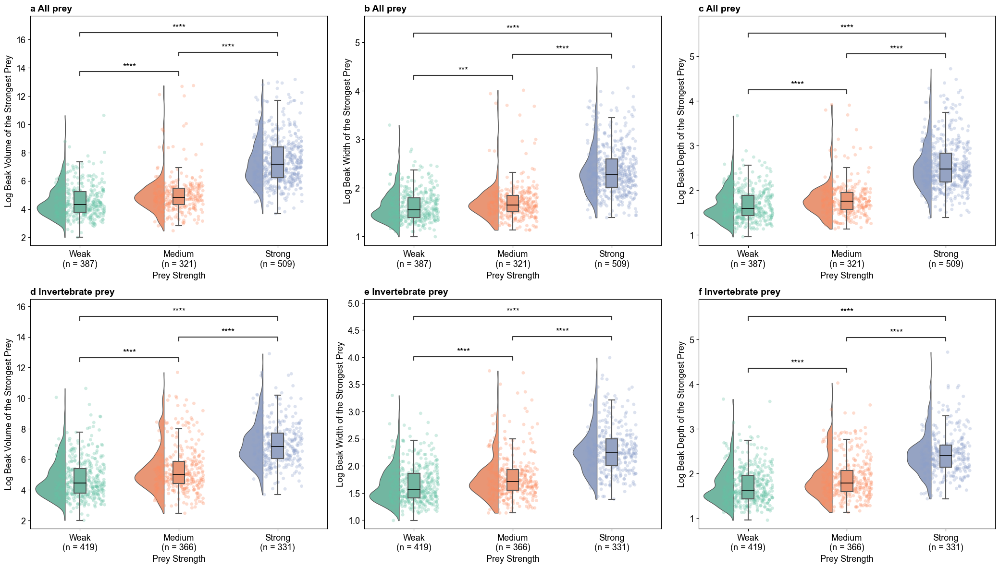

In [20]:
import pandas as pd
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# ======= 筛选每个物种 Size 最大的个体 =======
def filter_strongest(df):
    strength_order = {"Weak": 0, "Medium": 1, "Strong": 2}
    df = df.copy()
    df['Prey_Strength'] = df['Prey_Strength'].str.strip().str.capitalize()
    df['StrengthRank'] = df['Prey_Strength'].map(strength_order)
    df = df.sort_values(by=['Species.BirdTree', 'StrengthRank', 'Size'],
                        ascending=[True, False, False])
    df = df.groupby('Species.BirdTree').head(1)
    df = df.drop(columns='StrengthRank')
    return df

# ======= 绘图函数 =======
def plot_two_groups(df_list, group_labels):
    plot_vars = {
        'log_Beak_volume': 'Log Beak Volume',
        'log_Beak.Width': 'Log Beak Width',
        'log_Beak.Depth': 'Log Beak Depth',
    }

    strength_order = ["Weak", "Medium", "Strong"]
    palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}
    strength_type = CategoricalDtype(categories=strength_order, ordered=True)

    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 13

    fig, axes = plt.subplots(2, 3, figsize=(21, 12), sharey=False)  # ✅ 两行三列
    abc_labels = list('abcdef')
    axes = axes.flatten()

    for i, (df_subset, group_label) in enumerate(zip(df_list, group_labels)):
        df_subset['Prey_Strength'] = df_subset['Prey_Strength'].astype(strength_type)

        for j, (var, label) in enumerate(plot_vars.items()):
            ax_idx = i*3 + j
            ax = axes[ax_idx]

            sample_counts = df_subset.groupby('Prey_Strength')[var].count()
            xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp,0)})" for grp in strength_order]

            # 半小提琴图
            pt.half_violinplot(
                x='Prey_Strength', y=var, data=df_subset,
                palette=palette, bw=.2, cut=0., scale="area",
                width=.6, inner=None, orient="v", linewidth=1,
                order=strength_order, ax=ax, zorder=-1
            )

            # 箱线图
            sns.boxplot(
                x='Prey_Strength', y=var, data=df_subset,
                order=strength_order, palette=palette, width=.12,
                showcaps=True,
                boxprops={"zorder": 10},
                whiskerprops={"linewidth": 1.5, "zorder": 10},
                medianprops={"color": "black", "linewidth": 1.2},
                showfliers=False, zorder=10, ax=ax
            )

            # 散点图
            sns.stripplot(
                x='Prey_Strength', y=var, data=df_subset,
                order=strength_order, palette=palette,
                jitter=0.25, alpha=0.3, zorder=0, ax=ax
            )

            # 显著性标注
            comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
            annotator = Annotator(ax, comparisons, data=df_subset,
                                  x='Prey_Strength', y=var,
                                  order=strength_order)
            annotator.configure(test='t-test_ind', text_format='star',
                                loc='inside', comparisons_correction="fdr_bh")
            annotator.apply_and_annotate()

            ax.set_xticklabels(xtick_labels)
            ax.set_xlabel("Prey Strength")
            ax.set_ylabel(f"{label} of the Strongest Prey")

            # 子图标题
            ax.text(0, 1.05, f"{abc_labels[ax_idx]} {group_label}",
                    transform=ax.transAxes, fontsize=14,
                    fontweight='bold', va='top', ha='left')

    plt.tight_layout()
    plt.show()

# ======= 数据准备 =======
df_all = filter_strongest(df.copy())  # 第一组：全部物种
df_size12 = filter_strongest(df[df['Size.Type'].isin([1, 2])].copy())  # 第二组：Size.Type == 1 或 2

# ======= 绘图调用 =======
plot_two_groups(
    [df_all, df_size12],
    ["All prey", "Invertebrate prey"]
)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.215e-06 t=-4.896e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.103e-80 t=-2.122e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.466e-128 t=-2.857e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:8.207e-09 t=-5.828e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.061e-45 t=-1.517e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochber

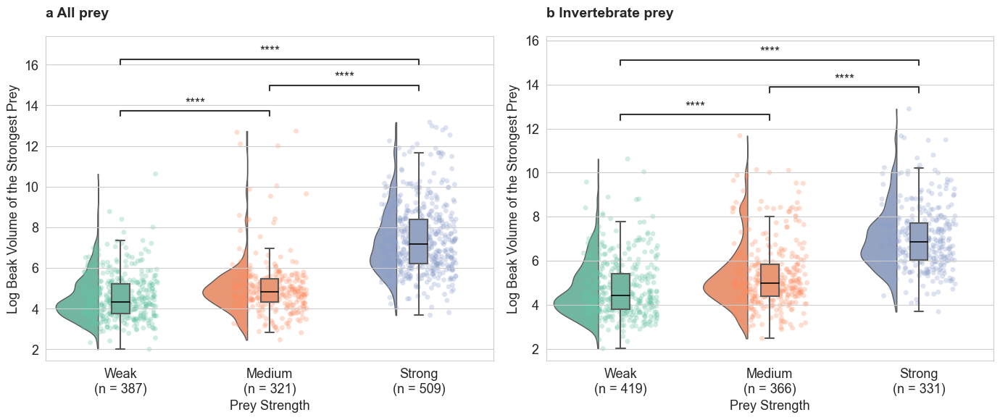

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.221e-04 t=-3.615e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:2.368e-70 t=-1.956e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:2.235e-109 t=-2.568e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.540e-05 t=-4.162e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:1.367e-82 t=-2.163e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochber

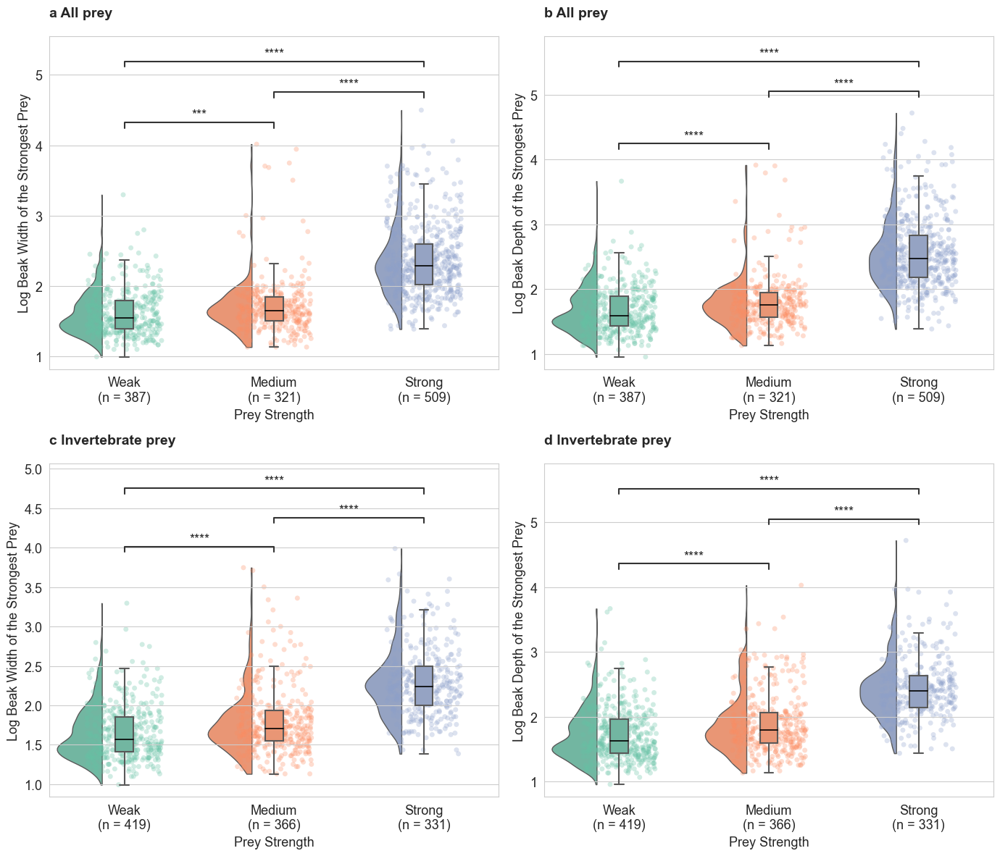

In [11]:
import pandas as pd
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# ======= 筛选每个物种 Size 最大的个体 =======
def filter_strongest(df):
    strength_order = {"Weak": 0, "Medium": 1, "Strong": 2}
    df = df.copy()
    df['Prey_Strength'] = df['Prey_Strength'].str.strip().str.capitalize()
    df['StrengthRank'] = df['Prey_Strength'].map(strength_order)
    df = df.sort_values(by=['Species.BirdTree', 'StrengthRank', 'Size'],
                        ascending=[True, False, False])
    df = df.groupby('Species.BirdTree').head(1)
    df = df.drop(columns='StrengthRank')
    return df

# ======= 通用绘图（单变量） =======
def plot_single_var(df_list, group_labels, var, label):
    strength_order = ["Weak", "Medium", "Strong"]
    palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}
    strength_type = CategoricalDtype(categories=strength_order, ordered=True)

    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 13

    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)
    abc_labels = list('ab')   # 子图序号
    axes = axes.flatten()

    for i, (df_subset, group_label) in enumerate(zip(df_list, group_labels)):
        df_subset['Prey_Strength'] = df_subset['Prey_Strength'].astype(strength_type)
        ax = axes[i]

        sample_counts = df_subset.groupby('Prey_Strength')[var].count()
        xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp,0)})" for grp in strength_order]

        # 半小提琴图
        pt.half_violinplot(
            x='Prey_Strength', y=var, data=df_subset,
            palette=palette, bw=.2, cut=0., scale="area",
            width=.6, inner=None, orient="v", linewidth=1,
            order=strength_order, ax=ax, zorder=-1
        )

        # 箱线图
        sns.boxplot(
            x='Prey_Strength', y=var, data=df_subset,
            order=strength_order, palette=palette, width=.12,
            showcaps=True,
            boxprops={"zorder": 10},
            whiskerprops={"linewidth": 1.5, "zorder": 10},
            medianprops={"color": "black", "linewidth": 1.2},
            showfliers=False, zorder=10, ax=ax
        )

        # 散点图
        sns.stripplot(
            x='Prey_Strength', y=var, data=df_subset,
            order=strength_order, palette=palette,
            jitter=0.25, alpha=0.3, zorder=0, ax=ax
        )

        # 显著性标注
        comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
        annotator = Annotator(ax, comparisons, data=df_subset,
                              x='Prey_Strength', y=var,
                              order=strength_order)
        annotator.configure(test='t-test_ind', text_format='star',
                            loc='inside', comparisons_correction="fdr_bh")
        annotator.apply_and_annotate()

        ax.set_xticklabels(xtick_labels)
        ax.set_xlabel("Prey Strength")
        ax.set_ylabel(f"{label} of the Strongest Prey")

        # 左上角标注序号 + 分组名（无括号）
        ax.text(0, 1.05, f"{abc_labels[i]} {group_label}",
                transform=ax.transAxes, fontsize=14,
                fontweight='bold', va='bottom', ha='left')

    plt.tight_layout()
    plt.show()

# ======= 通用绘图（两个变量并排） =======
def plot_two_vars(df_list, group_labels, var_labels):
    strength_order = ["Weak", "Medium", "Strong"]
    palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}
    strength_type = CategoricalDtype(categories=strength_order, ordered=True)

    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 13

    fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharey=False)
    abc_labels = list('abcd')  # 子图序号
    axes = axes.flatten()

    for i, (df_subset, group_label) in enumerate(zip(df_list, group_labels)):
        df_subset['Prey_Strength'] = df_subset['Prey_Strength'].astype(strength_type)

        for j, (var, label) in enumerate(var_labels.items()):
            ax = axes[i*2 + j]

            sample_counts = df_subset.groupby('Prey_Strength')[var].count()
            xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp,0)})" for grp in strength_order]

            # 半小提琴图
            pt.half_violinplot(
                x='Prey_Strength', y=var, data=df_subset,
                palette=palette, bw=.2, cut=0., scale="area",
                width=.6, inner=None, orient="v", linewidth=1,
                order=strength_order, ax=ax, zorder=-1
            )

            # 箱线图
            sns.boxplot(
                x='Prey_Strength', y=var, data=df_subset,
                order=strength_order, palette=palette, width=.12,
                showcaps=True,
                boxprops={"zorder": 10},
                whiskerprops={"linewidth": 1.5, "zorder": 10},
                medianprops={"color": "black", "linewidth": 1.2},
                showfliers=False, zorder=10, ax=ax
            )

            # 散点图
            sns.stripplot(
                x='Prey_Strength', y=var, data=df_subset,
                order=strength_order, palette=palette,
                jitter=0.25, alpha=0.3, zorder=0, ax=ax
            )

            # 显著性标注
            comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
            annotator = Annotator(ax, comparisons, data=df_subset,
                                  x='Prey_Strength', y=var,
                                  order=strength_order)
            annotator.configure(test='t-test_ind', text_format='star',
                                loc='inside', comparisons_correction="fdr_bh")
            annotator.apply_and_annotate()

            ax.set_xticklabels(xtick_labels)
            ax.set_xlabel("Prey Strength")
            ax.set_ylabel(f"{label} of the Strongest Prey")

            # 左上角标注序号 + 分组名（无括号）
            ax.text(0, 1.05, f"{abc_labels[i*2+j]} {group_label}",
                    transform=ax.transAxes, fontsize=14,
                    fontweight='bold', va='bottom', ha='left')

    plt.tight_layout()
    plt.show()

# ======= 数据准备 =======
df_all = filter_strongest(df.copy())
df_size12 = filter_strongest(df[df['Size.Type'].isin([1, 2])].copy())

# ======= 绘图调用 =======
# 图 1：体积
plot_single_var(
    [df_all, df_size12],
    ["All prey", "Invertebrate prey"],
    var="log_Beak_volume",
    label="Log Beak Volume"
)

# 图 2：宽和深
plot_two_vars(
    [df_all, df_size12],
    ["All prey", "Invertebrate prey"],
    var_labels={"log_Beak.Width": "Log Beak Width", "log_Beak.Depth": "Log Beak Depth"}
)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.215e-06 t=-4.896e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.103e-80 t=-2.122e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.466e-128 t=-2.857e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.221e-04 t=-3.615e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:2.368e-70 t=-1.956e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochber

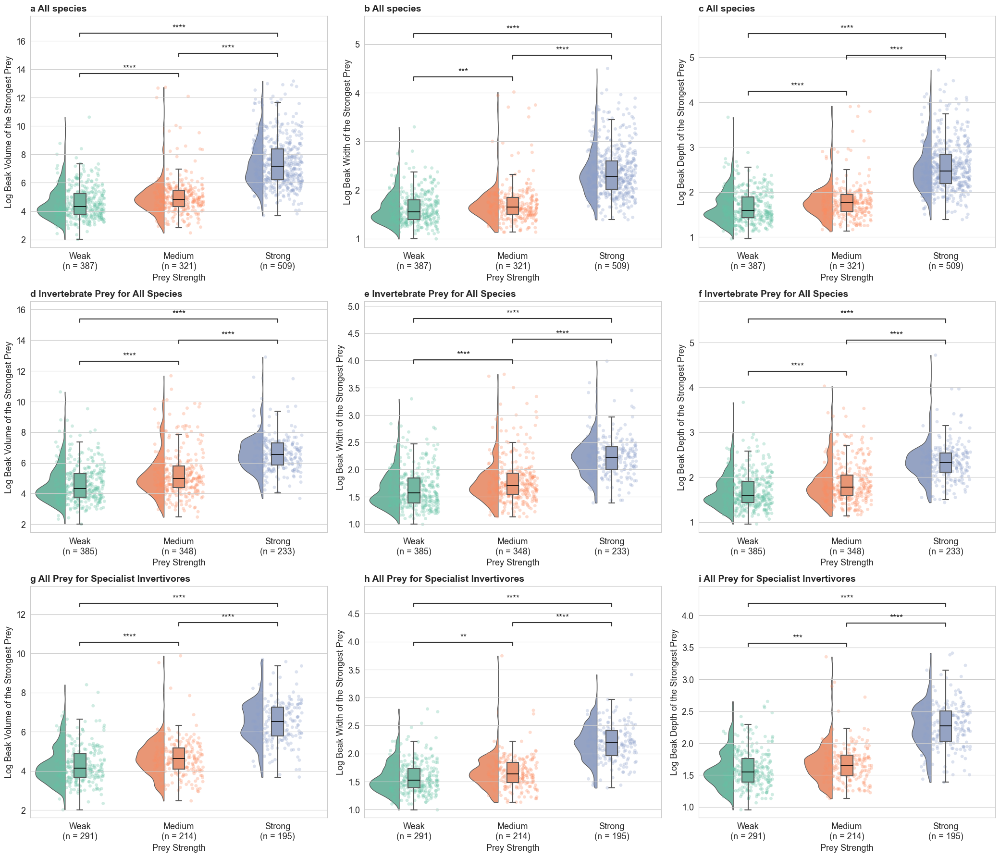

In [26]:
import pandas as pd
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# ======= 筛选每个物种 Size 最大的个体 =======
def filter_strongest(df):
    strength_order = {"Weak": 0, "Medium": 1, "Strong": 2}
    df = df.copy()
    df['Prey_Strength'] = df['Prey_Strength'].str.strip().str.capitalize()
    df['StrengthRank'] = df['Prey_Strength'].map(strength_order)
    df = df.sort_values(by=['Species.BirdTree', 'StrengthRank', 'Size'],
                        ascending=[True, False, False])
    df = df.groupby('Species.BirdTree').head(1)
    df = df.drop(columns='StrengthRank')
    return df

# ======= 绘图函数 =======
def plot_three_groups(df_list, group_labels):
    plot_vars = {
        'log_Beak_volume': 'Log Beak Volume',
        'log_Beak.Width': 'Log Beak Width',
        'log_Beak.Depth': 'Log Beak Depth',
    }

    strength_order = ["Weak", "Medium", "Strong"]
    palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}
    strength_type = CategoricalDtype(categories=strength_order, ordered=True)

    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 13

    fig, axes = plt.subplots(3, 3, figsize=(21, 18), sharey=False)
    abc_labels = list('abcdefghi')
    axes = axes.flatten()

    for i, (df_subset, group_label) in enumerate(zip(df_list, group_labels)):
        df_subset['Prey_Strength'] = df_subset['Prey_Strength'].astype(strength_type)

        for j, (var, label) in enumerate(plot_vars.items()):
            ax_idx = i*3 + j
            ax = axes[ax_idx]

            sample_counts = df_subset.groupby('Prey_Strength')[var].count()
            xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp,0)})" for grp in strength_order]

            # 半小提琴图
            pt.half_violinplot(
                x='Prey_Strength', y=var, data=df_subset,
                palette=palette, bw=.2, cut=0., scale="area",
                width=.6, inner=None, orient="v", linewidth=1,
                order=strength_order, ax=ax, zorder=-1
            )

            # 箱线图
            sns.boxplot(
                x='Prey_Strength', y=var, data=df_subset,
                order=strength_order, palette=palette, width=.12,
                showcaps=True,
                boxprops={"zorder": 10},
                whiskerprops={"linewidth": 1.5, "zorder": 10},
                medianprops={"color": "black", "linewidth": 1.2},
                showfliers=False, zorder=10, ax=ax
            )

            # 散点图
            sns.stripplot(
                x='Prey_Strength', y=var, data=df_subset,
                order=strength_order, palette=palette,
                jitter=0.25, alpha=0.3, zorder=0, ax=ax
            )

            # 显著性标注
            comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
            annotator = Annotator(ax, comparisons, data=df_subset,
                                  x='Prey_Strength', y=var,
                                  order=strength_order)
            annotator.configure(test='t-test_ind', text_format='star',
                                loc='inside', comparisons_correction="fdr_bh")
            annotator.apply_and_annotate()

            ax.set_xticklabels(xtick_labels)
            ax.set_xlabel("Prey Strength")
            ax.set_ylabel(f"{label} of the Strongest Prey")  # ✅ 修改y轴标题

            # 子图标题
            ax.text(0, 1.05, f"{abc_labels[ax_idx]} {group_label}",
                    transform=ax.transAxes, fontsize=14,
                    fontweight='bold', va='top', ha='left')

    plt.tight_layout()
    plt.show()

# ======= 数据准备 =======
df_all = filter_strongest(df.copy())  # 第一组：全部物种
df_size1 = filter_strongest(df[df['Size.Type']==1].copy())  # 第二组：Size.Type == 1
df_invert = filter_strongest(df[df['Trophic.Niche']=='Invertivore'].copy())  # 第三组：Invertivore

# ======= 绘图调用 =======
plot_three_groups(
    [df_all, df_size1, df_invert],
    ["All species", "Invertebrate Prey for All Species",
     "All Prey for Specialist Invertivores"]
)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.035e-06 t=-4.706e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:8.919e-79 t=-2.099e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:2.448e-124 t=-2.800e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:2.137e-04 t=-3.724e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:5.625e-53 t=-1.748e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochber

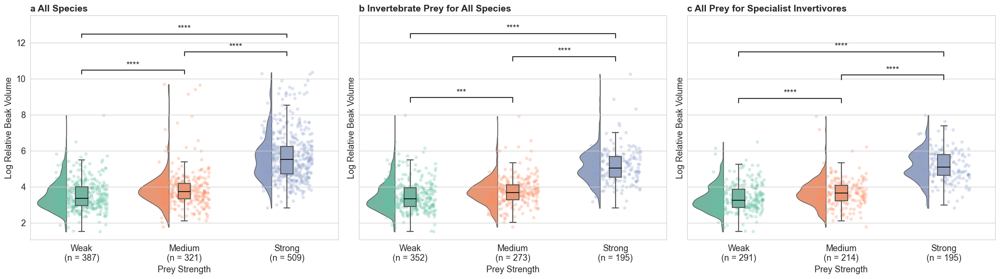

In [27]:
import pandas as pd
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# 先统一Prey_Strength格式并映射数值排序
strength_order = {"Weak": 0, "Medium": 1, "Strong": 2}
df['Prey_Strength'] = df['Prey_Strength'].str.strip().str.capitalize()
df['strength_rank'] = df['Prey_Strength'].map(strength_order)

# 先筛选每个物种里Prey_Strength最强，强度相同选Size最大
df_strongest = (
    df.sort_values(['Species.BirdTree', 'strength_rank', 'Size'], ascending=[True, False, False])
      .groupby('Species.BirdTree', as_index=False)
      .first()
)

df_strongest = df_strongest.drop(columns='strength_rank')

# 分类顺序和颜色映射
prey_strength_order = ["Weak", "Medium", "Strong"]
prey_strength_type = CategoricalDtype(categories=prey_strength_order, ordered=True)
df_strongest['Prey_Strength'] = df_strongest['Prey_Strength'].astype(prey_strength_type)

palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

def plot_rel_volume_three_categories(df):
    # 重新排序categories，调整第二和第三项顺序
    categories = {
        "All species": df,
        "Size.Type == 1": df[df['Size.Type'] == 1],
        "Invertivore species": df[df['Trophic.Niche'] == 'Invertivore'],
    }

    titles = ['a All Species', 'b Invertebrate Prey for All Species', 'c All Prey for Specialist Invertivores']
    fig, axes = plt.subplots(1, 3, figsize=(21, 6), sharey=True)

    var = 'log_Beak_rel_volume'
    ylabel = 'Log Relative Beak Volume'

    for ax, (title, subset), label in zip(axes, categories.items(), titles):
        subset = subset.copy()
        subset['Prey_Strength'] = subset['Prey_Strength'].astype(prey_strength_type)
        
        sample_counts = subset.groupby('Prey_Strength')[var].count()
        xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in prey_strength_order]

        pt.half_violinplot(
            x='Prey_Strength', y=var, data=subset,
            palette=palette, bw=.2, cut=0., scale="area",
            width=.6, inner=None, orient="v", linewidth=1,
            order=prey_strength_order, ax=ax, zorder=-1
        )

        sns.boxplot(
            x='Prey_Strength', y=var, data=subset,
            order=prey_strength_order, palette=palette, width=.12,
            showcaps=True,
            boxprops={"zorder": 10},
            whiskerprops={"linewidth": 1.5, "zorder": 10},
            medianprops={"color": "black", "linewidth": 1.2},
            showfliers=False, zorder=10, ax=ax
        )

        sns.stripplot(
            x='Prey_Strength', y=var, data=subset,
            order=prey_strength_order, palette=palette,
            jitter=0.25, alpha=0.3, zorder=0, ax=ax
        )

        comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
        annotator = Annotator(ax, comparisons, data=subset,
                              x='Prey_Strength', y=var,
                              order=prey_strength_order)
        annotator.configure(test='t-test_ind', text_format='star',
                            loc='inside', comparisons_correction="fdr_bh")
        annotator.apply_and_annotate()

        ax.set_xticklabels(xtick_labels)
        ax.set_xlabel("Prey Strength")
        ax.set_ylabel(ylabel)
        ax.set_title(label, fontsize=14, fontweight='bold', loc='left')

    plt.tight_layout()
    plt.show()


# 运行函数画图
plot_rel_volume_three_categories(df_strongest)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.215e-06 t=-4.896e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.103e-80 t=-2.122e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:4.466e-128 t=-2.857e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.221e-04 t=-3.615e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:2.368e-70 t=-1.956e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochber

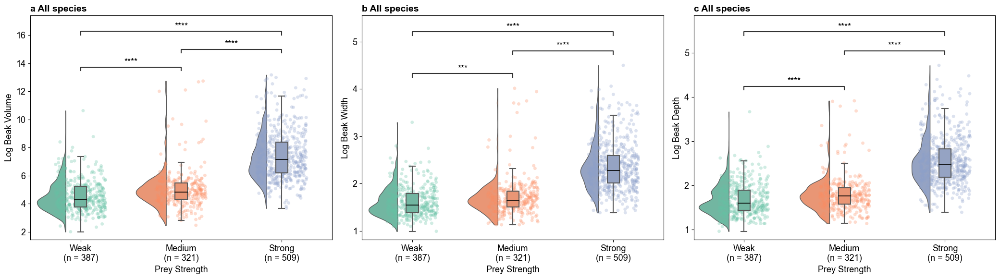

In [8]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# ===== 先筛选每个物种保留一条记录 =====
strength_order_map = {"Weak": 0, "Medium": 1, "Strong": 2}

df['Prey_Strength'] = df['Prey_Strength'].str.strip().str.capitalize()
df['strength_rank'] = df['Prey_Strength'].map(strength_order_map)

df_strongest = (
    df.sort_values(['Species.BirdTree', 'strength_rank', 'Size'], ascending=[True, False, False])
      .groupby('Species.BirdTree', as_index=False)
      .first()
)
df_strongest = df_strongest.drop(columns='strength_rank')

# ===== 绘图准备 =====
plot_vars = {
    'log_Beak_volume': 'Log Beak Volume',
    'log_Beak.Width': 'Log Beak Width',
    'log_Beak.Depth': 'Log Beak Depth',
}

strength_order = ["Weak", "Medium", "Strong"]
palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}

strength_type = CategoricalDtype(categories=strength_order, ordered=True)
df_strongest['Prey_Strength'] = df_strongest['Prey_Strength'].astype(strength_type)

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

fig, axes = plt.subplots(1, 3, figsize=(21, 6), sharey=False)
labels_abc = ['a', 'b', 'c']

for ax, (var, label), abc in zip(axes, plot_vars.items(), labels_abc):
    sample_counts = df_strongest.groupby('Prey_Strength')[var].count()
    xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in strength_order]

    pt.half_violinplot(
        x='Prey_Strength', y=var, data=df_strongest,
        palette=palette, bw=.2, cut=0., scale="area",
        width=.6, inner=None, orient="v", linewidth=1,
        order=strength_order, ax=ax, zorder=-1
    )

    sns.boxplot(
        x='Prey_Strength', y=var, data=df_strongest,
        order=strength_order, palette=palette, width=.12,
        showcaps=True,
        boxprops={"zorder": 10},
        whiskerprops={"linewidth": 1.5, "zorder": 10},
        medianprops={"color": "black", "linewidth": 1.2},
        showfliers=False, zorder=10, ax=ax
    )

    sns.stripplot(
        x='Prey_Strength', y=var, data=df_strongest,
        order=strength_order, palette=palette,
        jitter=0.25, alpha=0.3, zorder=0, ax=ax
    )

    comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
    annotator = Annotator(ax, comparisons, data=df_strongest,
                          x='Prey_Strength', y=var,
                          order=strength_order)
    annotator.configure(test='t-test_ind', text_format='star',
                        loc='inside', comparisons_correction="fdr_bh")
    annotator.apply_and_annotate()

    ax.set_xticklabels(xtick_labels)
    ax.set_xlabel("Prey Strength")
    ax.set_ylabel(label)

    # 修改标题为 a All species 这种格式
    ax.set_title(f"{abc} All species", fontsize=14, fontweight='bold', loc='left')

plt.tight_layout()
plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:2.899e-05 t=-4.211e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:5.638e-67 t=-1.969e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:3.249e-96 t=-2.466e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:5.885e-03 t=-2.763e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:5.796e-63 t=-1.891e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg

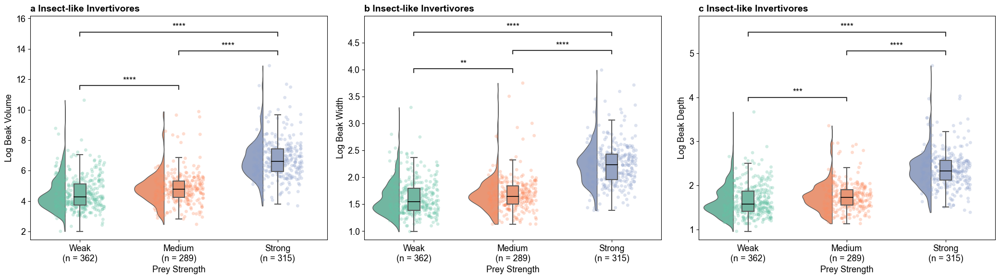

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:5.367e-05 t=-4.074e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:6.041e-53 t=-1.782e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:8.035e-80 t=-2.304e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Weak vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.001e-03 t=-3.310e+00
Medium vs. Strong: t-test independent samples with Benjamini-Hochberg correction, P_val:8.262e-50 t=-1.710e+01
Weak vs. Strong: t-test independent samples with Benjamini-Hochberg

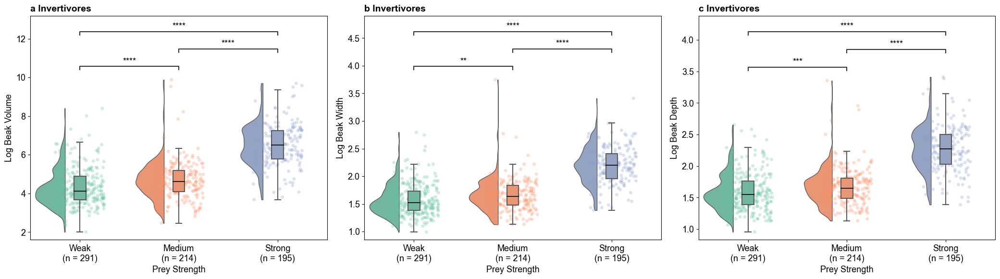

In [11]:
import pandas as pd
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# ======= 筛选函数 =======
def filter_strongest(df):
    # Prey_Strength 优先级
    strength_order = {"Weak": 0, "Medium": 1, "Strong": 2}
    df = df.copy()
    df['StrengthRank'] = df['Prey_Strength'].map(strength_order)
    # 按优先级、Size 降序排序
    df = df.sort_values(by=['Species.BirdTree', 'StrengthRank', 'Size'],
                        ascending=[True, False, False])
    # 每个物种保留第一条
    df = df.groupby('Species.BirdTree').head(1)
    df = df.drop(columns='StrengthRank')
    return df

# ======= 画三子图函数 =======
def plot_three_vars(df_subset, group_label):
    plot_vars = {
        'log_Beak_volume': 'Log Beak Volume',
        'log_Beak.Width': 'Log Beak Width',
        'log_Beak.Depth': 'Log Beak Depth',
    }

    # 分类顺序和颜色
    strength_order = ["Weak", "Medium", "Strong"]
    palette = {"Weak": "#66c2a5", "Medium": "#fc8d62", "Strong": "#8da0cb"}
    strength_type = CategoricalDtype(categories=strength_order, ordered=True)
    df_subset['Prey_Strength'] = df_subset['Prey_Strength'].astype(strength_type)

    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 13

    fig, axes = plt.subplots(1, 3, figsize=(21, 6), sharey=False)

    for ax, (var, label), abc in zip(axes, plot_vars.items(), ['a', 'b', 'c']):
        sample_counts = df_subset.groupby('Prey_Strength')[var].count()
        xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in strength_order]

        # 半小提琴图
        pt.half_violinplot(
            x='Prey_Strength', y=var, data=df_subset,
            palette=palette, bw=.2, cut=0., scale="area",
            width=.6, inner=None, orient="v", linewidth=1,
            order=strength_order, ax=ax, zorder=-1
        )

        # 箱线图
        sns.boxplot(
            x='Prey_Strength', y=var, data=df_subset,
            order=strength_order, palette=palette, width=.12,
            showcaps=True,
            boxprops={"zorder": 10},
            whiskerprops={"linewidth": 1.5, "zorder": 10},
            medianprops={"color": "black", "linewidth": 1.2},
            showfliers=False, zorder=10, ax=ax
        )

        # 散点图
        sns.stripplot(
            x='Prey_Strength', y=var, data=df_subset,
            order=strength_order, palette=palette,
            jitter=0.25, alpha=0.3, zorder=0, ax=ax
        )

        # 显著性标注
        comparisons = [("Weak", "Medium"), ("Weak", "Strong"), ("Medium", "Strong")]
        annotator = Annotator(ax, comparisons, data=df_subset,
                              x='Prey_Strength', y=var,
                              order=strength_order)
        annotator.configure(test='t-test_ind', text_format='star',
                            loc='inside', comparisons_correction="fdr_bh")
        annotator.apply_and_annotate()

        ax.set_xticklabels(xtick_labels)
        ax.set_xlabel("Prey Strength")
        ax.set_ylabel(label)

        # 子图标题加组名
        ax.text(0, 1.05, f"{abc} {group_label}", transform=ax.transAxes,
                fontsize=14, fontweight='bold', va='top', ha='left')

    plt.tight_layout()
    plt.show()

# ======= 数据筛选并画图 =======
# 第一组：Size.Type == 1 的物种
species_with_invert = df[df['Size.Type'] == 1]['Species.BirdTree'].unique()
df1 = df[df['Species.BirdTree'].isin(species_with_invert)].copy()
df1 = filter_strongest(df1)
plot_three_vars(df1, "Insect-like Invertivores")

# 第二组：Trophic.Niche == 'Invertivore' 的物种
invertivore_species = df[df['Trophic.Niche'] == 'Invertivore']['Species.BirdTree'].unique()
df2 = df[df['Species.BirdTree'].isin(invertivore_species)].copy()
df2 = filter_strongest(df2)
plot_three_vars(df2, "Invertivores")


## 全部

In [ ]:
# 标准化硬度标签为首字母大写，防止绘图失败
df['Prey_Hardness'] = df['Prey_Hardness'].str.strip().str.capitalize()

# 可选：设为有序分类变量（确保 Boxplot 按正确顺序显示）
from pandas.api.types import CategoricalDtype
hardness_order = CategoricalDtype(categories=["Soft", "Medium", "Hard"], ordered=True)
df["Prey_Hardness"] = df["Prey_Hardness"].astype(hardness_order)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.509e-19 t=-9.126e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.652e-45 t=-1.477e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.441e-118 t=-2.625e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:5.355e-14 t=-7.626e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.069e-45 t=-1.479e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correc

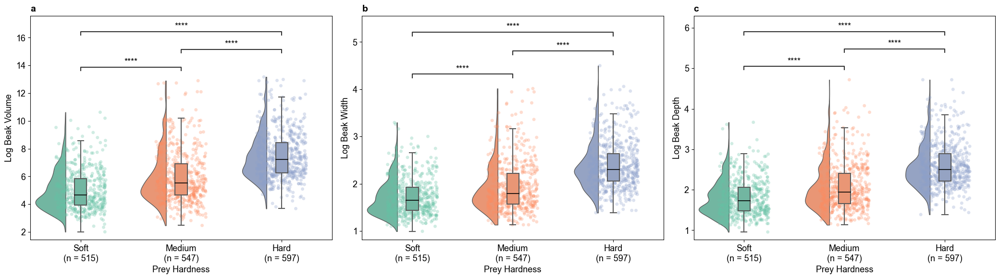

In [ ]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# 只保留这三个变量
plot_vars = {
    'log_Beak_volume': 'Log Beak Volume',
    'log_Beak.Width': 'Log Beak Width',
    'log_Beak.Depth': 'Log Beak Depth',
}

# 分类顺序 & 颜色
hardness_order = ["Soft", "Medium", "Hard"]
palette = {"Soft": "#66c2a5", "Medium": "#fc8d62", "Hard": "#8da0cb"}

# 分类列标准化
df['Prey_Hardness'] = df['Prey_Hardness'].str.strip().str.capitalize()
hardness_type = CategoricalDtype(categories=hardness_order, ordered=True)
df['Prey_Hardness'] = df['Prey_Hardness'].astype(hardness_type)

# 设置样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

fig, axes = plt.subplots(1, 3, figsize=(21, 6), sharey=False)
labels_abc = ['a', 'b', 'c']  # 小写abc

for ax, (var, label), abc in zip(axes, plot_vars.items(), labels_abc):
    sample_counts = df.groupby('Prey_Hardness')[var].count()
    xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in hardness_order]

    # 半小提琴图
    pt.half_violinplot(
        x='Prey_Hardness', y=var, data=df,
        palette=palette, bw=.2, cut=0., scale="area",
        width=.6, inner=None, orient="v", linewidth=1,
        order=hardness_order, ax=ax, zorder=-1
    )

    # 箱线图
    sns.boxplot(
        x='Prey_Hardness', y=var, data=df,
        order=hardness_order, palette=palette, width=.12,
        showcaps=True,
        boxprops={"zorder": 10},
        whiskerprops={"linewidth": 1.5, "zorder": 10},
        medianprops={"color": "black", "linewidth": 1.2},
        showfliers=False, zorder=10, ax=ax
    )

    # 散点图（低透明度）
    sns.stripplot(
        x='Prey_Hardness', y=var, data=df,
        order=hardness_order, palette=palette,
        jitter=0.25, alpha=0.3, zorder=0, ax=ax
    )

    # 显著性比较
    comparisons = [("Soft", "Medium"), ("Soft", "Hard"), ("Medium", "Hard")]
    annotator = Annotator(ax, comparisons, data=df,
                          x='Prey_Hardness', y=var,
                          order=hardness_order)
    annotator.configure(test='t-test_ind', text_format='star',
                        loc='inside', comparisons_correction="fdr_bh")
    annotator.apply_and_annotate()

    ax.set_xticklabels(xtick_labels)
    ax.set_xlabel("Prey Hardness")
    ax.set_ylabel(label)

    # 添加abc图题，小写，放左上角外面一点
    ax.text(0, 1.05, abc, transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')

plt.tight_layout()
plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.180e-18 t=-8.865e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:4.020e-45 t=-1.474e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.167e-115 t=-2.584e+01


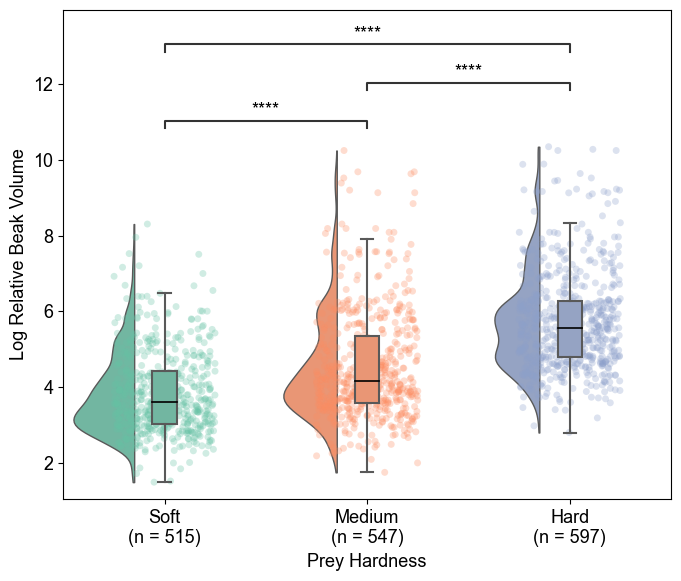

In [ ]:
var = 'log_Beak_rel_volume'
label = 'Log Relative Beak Volume'

sample_counts = df.groupby('Prey_Hardness')[var].count()
xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in hardness_order]

plt.figure(figsize=(7,6))
ax = plt.gca()

pt.half_violinplot(
    x='Prey_Hardness', y=var, data=df,
    palette=palette, bw=.2, cut=0., scale="area",
    width=.6, inner=None, orient="v", linewidth=1,
    order=hardness_order, ax=ax, zorder=-1
)

sns.boxplot(
    x='Prey_Hardness', y=var, data=df,
    order=hardness_order, palette=palette, width=.12,
    showcaps=True,
    boxprops={"zorder": 10},
    whiskerprops={"linewidth": 1.5, "zorder": 10},
    medianprops={"color": "black", "linewidth": 1.2},
    showfliers=False, zorder=10, ax=ax
)

sns.stripplot(
    x='Prey_Hardness', y=var, data=df,
    order=hardness_order, palette=palette,
    jitter=0.25, alpha=0.3, zorder=0, ax=ax
)

comparisons = [("Soft", "Medium"), ("Soft", "Hard"), ("Medium", "Hard")]
annotator = Annotator(ax, comparisons, data=df,
                      x='Prey_Hardness', y=var,
                      order=hardness_order)
annotator.configure(test='t-test_ind', text_format='star',
                    loc='inside', comparisons_correction="fdr_bh")
annotator.apply_and_annotate()

ax.set_xticklabels(xtick_labels)
ax.set_xlabel("Prey Hardness")
ax.set_ylabel(label)

plt.tight_layout()
plt.show()


## 不同鸟类

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.052e-14 t=-7.861e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.641e-28 t=-1.145e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:9.581e-80 t=-2.111e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.457e-10 t=-6.483e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.246e-32 t=-1.242e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correct

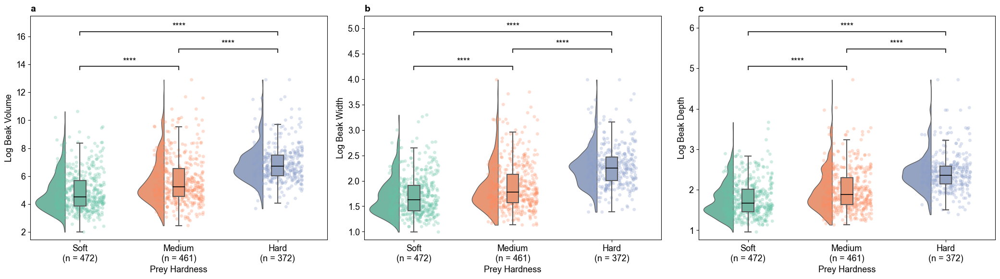

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.740e-14 t=-7.793e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.012e-30 t=-1.200e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.020e-82 t=-2.156e+01


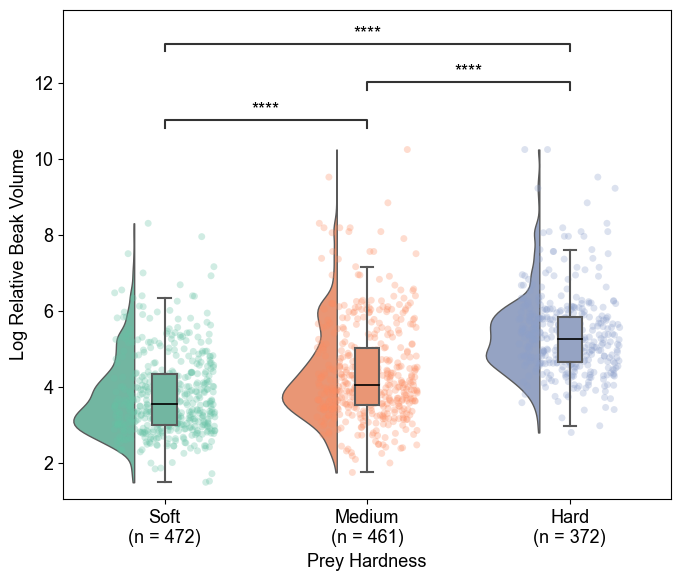

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.347e-07 t=-5.332e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.733e-35 t=-1.344e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:8.946e-66 t=-1.960e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:5.099e-07 t=-5.075e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:5.316e-35 t=-1.333e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correct

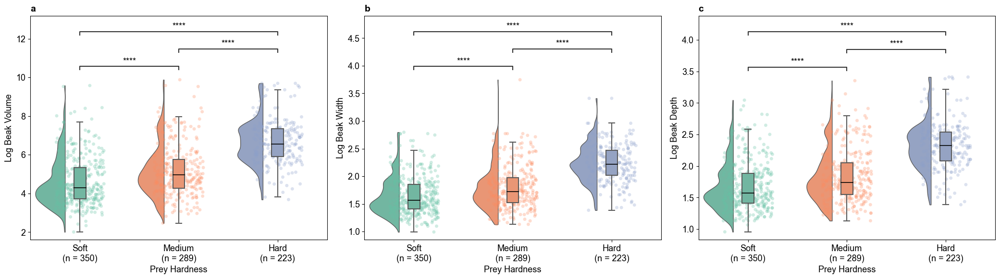

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:2.187e-08 t=-5.668e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.234e-35 t=-1.342e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:3.392e-70 t=-2.046e+01


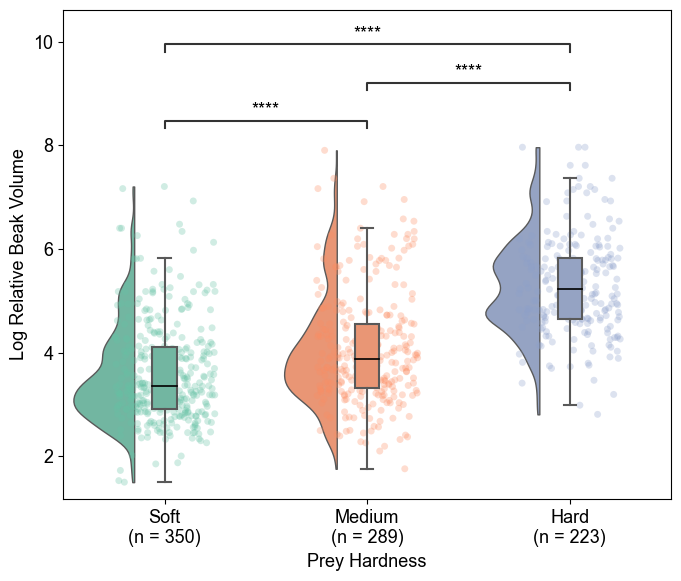

In [ ]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# 分类列标准化
df['Prey_Hardness'] = df['Prey_Hardness'].str.strip().str.capitalize()
hardness_order = ["Soft", "Medium", "Hard"]
hardness_type = CategoricalDtype(categories=hardness_order, ordered=True)
df['Prey_Hardness'] = df['Prey_Hardness'].astype(hardness_type)

palette = {"Soft": "#66c2a5", "Medium": "#fc8d62", "Hard": "#8da0cb"}

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

def plot_three_vars(df_subset):
    plot_vars = {
        'log_Beak_volume': 'Log Beak Volume',
        'log_Beak.Width': 'Log Beak Width',
        'log_Beak.Depth': 'Log Beak Depth',
    }
    hardness_order = ["Soft", "Medium", "Hard"]
    
    fig, axes = plt.subplots(1, 3, figsize=(21, 6), sharey=False)

    for ax, (var, label), abc in zip(axes, plot_vars.items(), ['a', 'b', 'c']):
        sample_counts = df_subset.groupby('Prey_Hardness')[var].count()
        xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in hardness_order]

        pt.half_violinplot(
            x='Prey_Hardness', y=var, data=df_subset,
            palette=palette, bw=.2, cut=0., scale="area",
            width=.6, inner=None, orient="v", linewidth=1,
            order=hardness_order, ax=ax, zorder=-1
        )

        sns.boxplot(
            x='Prey_Hardness', y=var, data=df_subset,
            order=hardness_order, palette=palette, width=.12,
            showcaps=True,
            boxprops={"zorder": 10},
            whiskerprops={"linewidth": 1.5, "zorder": 10},
            medianprops={"color": "black", "linewidth": 1.2},
            showfliers=False, zorder=10, ax=ax
        )

        sns.stripplot(
            x='Prey_Hardness', y=var, data=df_subset,
            order=hardness_order, palette=palette,
            jitter=0.25, alpha=0.3, zorder=0, ax=ax
        )

        comparisons = [("Soft", "Medium"), ("Soft", "Hard"), ("Medium", "Hard")]
        annotator = Annotator(ax, comparisons, data=df_subset,
                              x='Prey_Hardness', y=var,
                              order=hardness_order)
        annotator.configure(test='t-test_ind', text_format='star',
                            loc='inside', comparisons_correction="fdr_bh")
        annotator.apply_and_annotate()

        ax.set_xticklabels(xtick_labels)
        ax.set_xlabel("Prey Hardness")
        ax.set_ylabel(label)

        ax.text(0, 1.05, abc, transform=ax.transAxes,
                fontsize=14, fontweight='bold', va='top', ha='left')
    
    plt.tight_layout()
    plt.show()

def plot_rel_volume(df_subset):
    var = 'log_Beak_rel_volume'
    hardness_order = ["Soft", "Medium", "Hard"]
    sample_counts = df_subset.groupby('Prey_Hardness')[var].count()
    xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in hardness_order]

    fig, ax = plt.subplots(figsize=(7,6))
    
    pt.half_violinplot(
        x='Prey_Hardness', y=var, data=df_subset,
        palette=palette, bw=.2, cut=0., scale="area",
        width=.6, inner=None, orient="v", linewidth=1,
        order=hardness_order, ax=ax, zorder=-1
    )
    
    sns.boxplot(
        x='Prey_Hardness', y=var, data=df_subset,
        order=hardness_order, palette=palette, width=.12,
        showcaps=True,
        boxprops={"zorder": 10},
        whiskerprops={"linewidth": 1.5, "zorder": 10},
        medianprops={"color": "black", "linewidth": 1.2},
        showfliers=False, zorder=10, ax=ax
    )
    
    sns.stripplot(
        x='Prey_Hardness', y=var, data=df_subset,
        order=hardness_order, palette=palette,
        jitter=0.25, alpha=0.3, zorder=0, ax=ax
    )
    
    comparisons = [("Soft", "Medium"), ("Soft", "Hard"), ("Medium", "Hard")]
    annotator = Annotator(ax, comparisons, data=df_subset,
                          x='Prey_Hardness', y=var,
                          order=hardness_order)
    annotator.configure(test='t-test_ind', text_format='star',
                        loc='inside', comparisons_correction="fdr_bh")
    annotator.apply_and_annotate()

    ax.set_xticklabels(xtick_labels)
    ax.set_xlabel("Prey Hardness")
    ax.set_ylabel("Log Relative Beak Volume")

    plt.tight_layout()
    plt.show()

# ---- 筛选 ----
species_with_invert = df[df['Size.Type'] == 1]['Species.BirdTree'].unique()
df1 = df[df['Species.BirdTree'].isin(species_with_invert)].copy()

invertivore_species = df[df['Trophic.Niche'] == 'Invertivore']['Species.BirdTree'].unique()
df2 = df[df['Species.BirdTree'].isin(invertivore_species)].copy()

# 画图
plot_three_vars(df1)
plot_rel_volume(df1)

plot_three_vars(df2)
plot_rel_volume(df2)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.562e-19 t=-9.220e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.099e-26 t=-1.090e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:4.643e-88 t=-2.181e+01


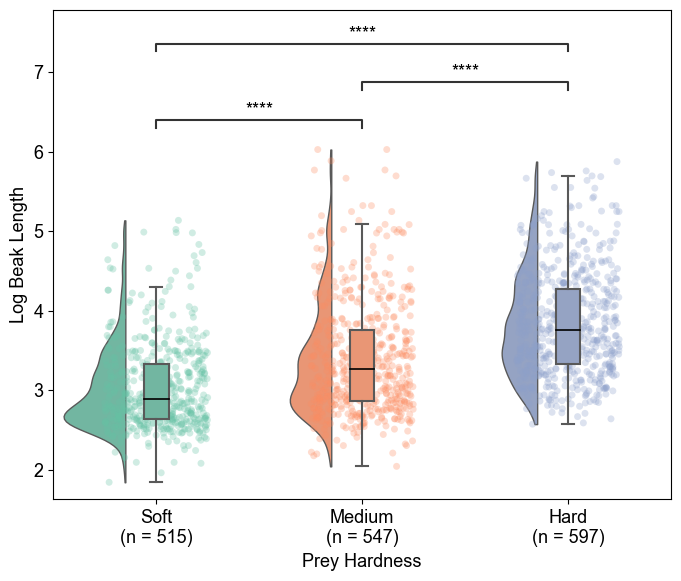

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:2.903e-17 t=-8.597e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:7.389e-50 t=-1.560e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.649e-117 t=-2.610e+01


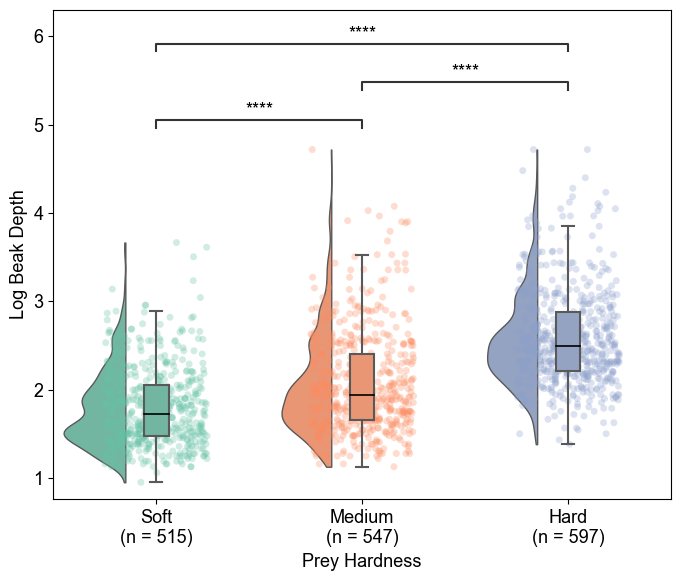

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:5.355e-14 t=-7.626e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.069e-45 t=-1.479e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:3.364e-106 t=-2.448e+01


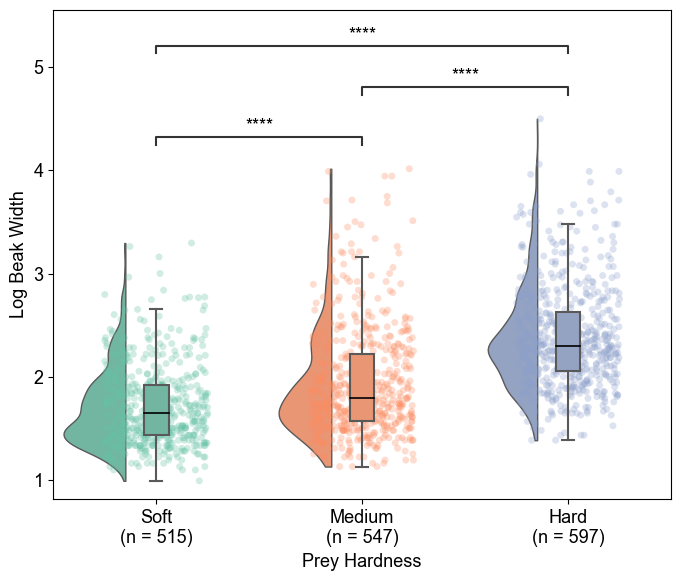

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:3.509e-19 t=-9.126e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.652e-45 t=-1.477e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.441e-118 t=-2.625e+01


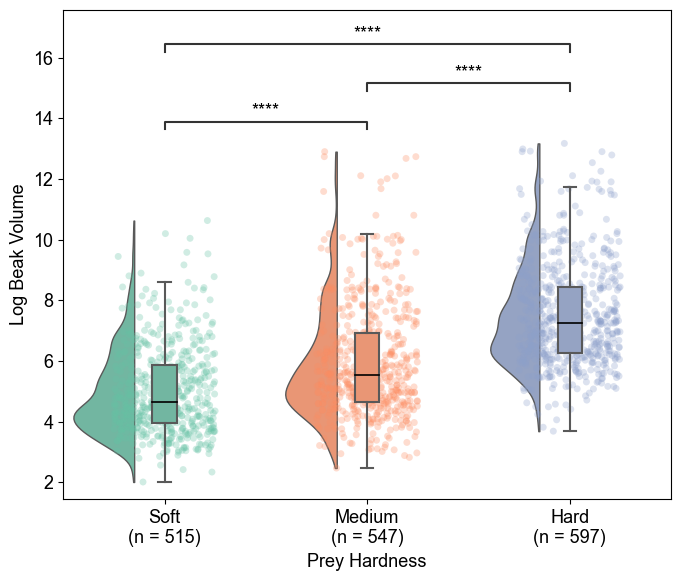

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.983e-16 t=-8.358e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:7.823e-52 t=-1.595e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.363e-120 t=-2.654e+01


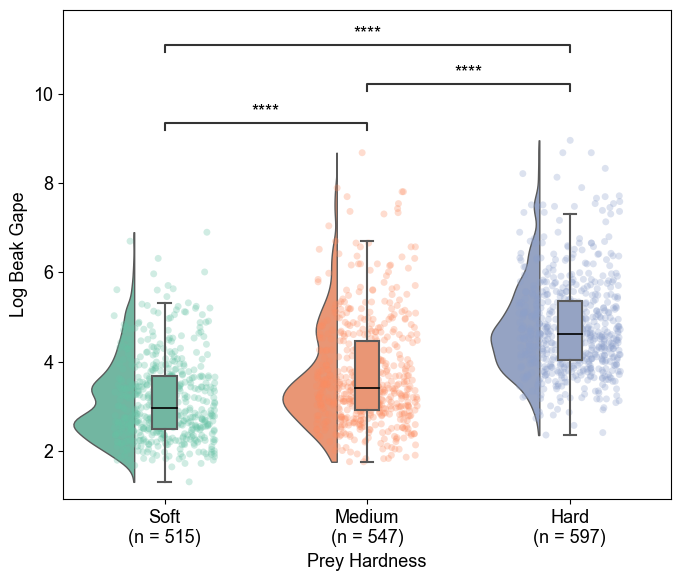

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:9.530e-03 t=-2.597e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:4.447e-08 t=5.509e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:4.742e-03 t=2.830e+00


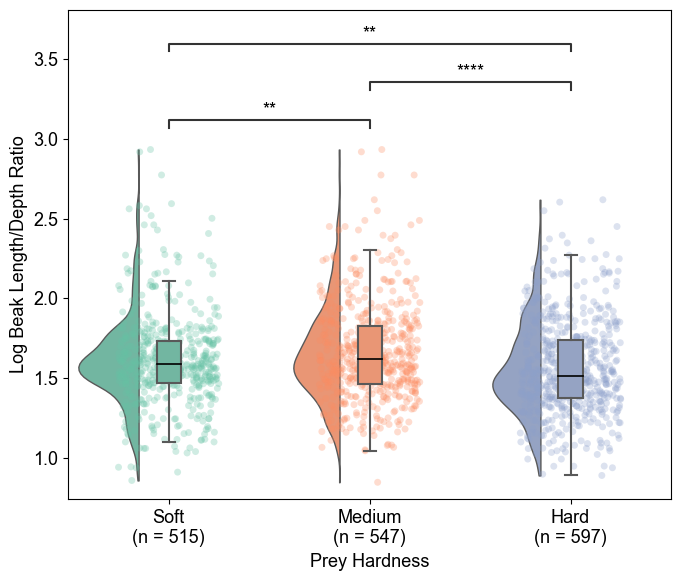

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.308e-10 t=-6.491e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:7.814e-06 t=-4.491e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:1.611e-28 t=-1.139e+01


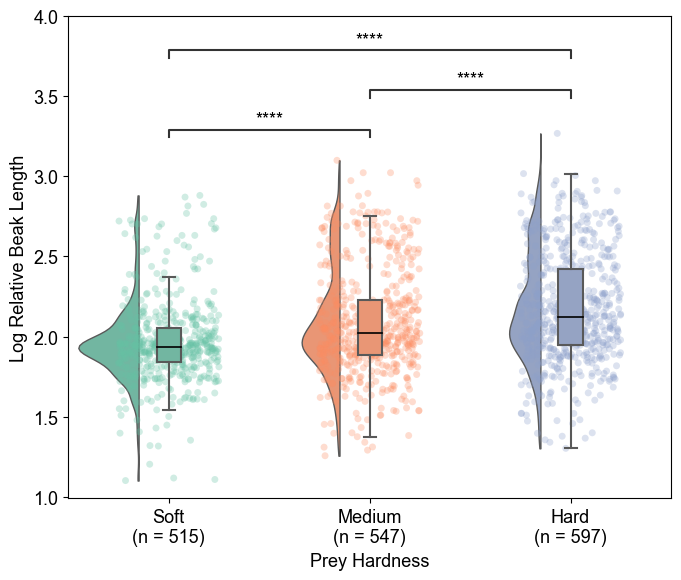

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:1.207e-06 t=-4.883e+00
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:7.574e-43 t=-1.431e+01
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:4.336e-83 t=-2.106e+01


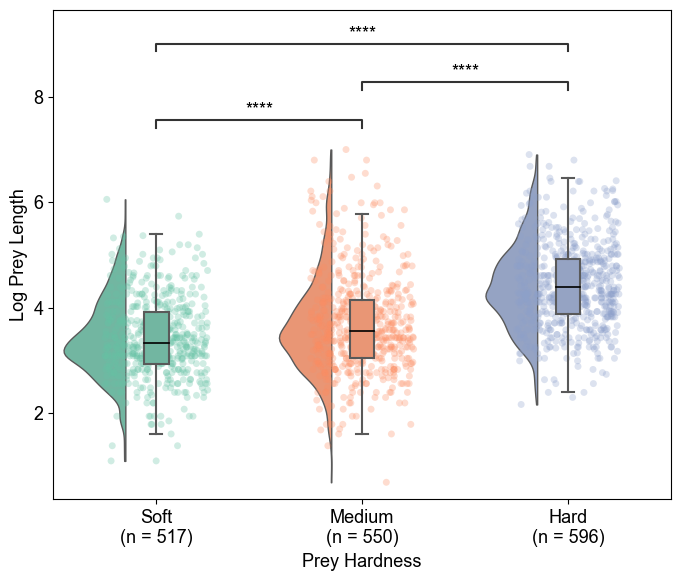

In [ ]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
from pandas.api.types import CategoricalDtype

# 变量和标签
plot_vars = {
    'log_Beak.Length_Culmen':"Log Beak Length",
    'log_Beak.Depth': 'Log Beak Depth',
    'log_Beak.Width': 'Log Beak Width',
    'log_Beak_volume': 'Log Beak Volume',
    'log_Beak_gape': 'Log Beak Gape',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio',
    'log_Beak_rel_length': 'Log Relative Beak Length' ,
    'log_Size': 'Log Prey Length',
}

# 分类顺序 & 颜色
hardness_order = ["Soft", "Medium", "Hard"]
palette = {"Soft": "#66c2a5", "Medium": "#fc8d62", "Hard": "#8da0cb"}

# 分类列标准化
df['Prey_Hardness'] = df['Prey_Hardness'].str.strip().str.capitalize()
hardness_type = CategoricalDtype(categories=hardness_order, ordered=True)
df['Prey_Hardness'] = df['Prey_Hardness'].astype(hardness_type)

# 设置样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

# 循环绘图
for var, label in plot_vars.items():
    sample_counts = df.groupby('Prey_Hardness')[var].count()
    xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in hardness_order]

    plt.figure(figsize=(7, 6))
    ax = plt.gca()

    # 半小提琴图
    pt.half_violinplot(
        x='Prey_Hardness', y=var, data=df,
        palette=palette, bw=.2, cut=0., scale="area",
        width=.6, inner=None, orient="v", linewidth=1,
        order=hardness_order, ax=ax, zorder=-1
    )

    # 箱线图
    sns.boxplot(
        x='Prey_Hardness', y=var, data=df,
        order=hardness_order, palette=palette, width=.12,
        showcaps=True,
        boxprops={"zorder": 10},
        whiskerprops={"linewidth": 1.5, "zorder": 10},
        medianprops={"color": "black", "linewidth": 1.2},
        showfliers=False, zorder=10
    )

    # 散点图（低透明度）
    sns.stripplot(
        x='Prey_Hardness', y=var, data=df,
        order=hardness_order, palette=palette,
        jitter=0.25, alpha=0.3, zorder=0
    )

    # 显著性比较
    comparisons = [("Soft", "Medium"), ("Soft", "Hard"), ("Medium", "Hard")]
    annotator = Annotator(ax, comparisons, data=df,
                          x='Prey_Hardness', y=var,
                          order=hardness_order)
    annotator.configure(test='t-test_ind', text_format='star',
                        loc='inside', comparisons_correction="fdr_bh")
    annotator.apply_and_annotate()

    # 标签与格式
    ax.set_xticklabels(xtick_labels)
    plt.xlabel("Prey Hardness")
    plt.ylabel(label)
    plt.tight_layout()
    plt.show()


# 不同硬度相对体型

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Soft vs. Medium: t-test independent samples with Benjamini-Hochberg correction, P_val:5.247e-01 t=-6.363e-01
Medium vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:2.511e-20 t=-9.416e+00
Soft vs. Hard: t-test independent samples with Benjamini-Hochberg correction, P_val:9.933e-27 t=-1.099e+01


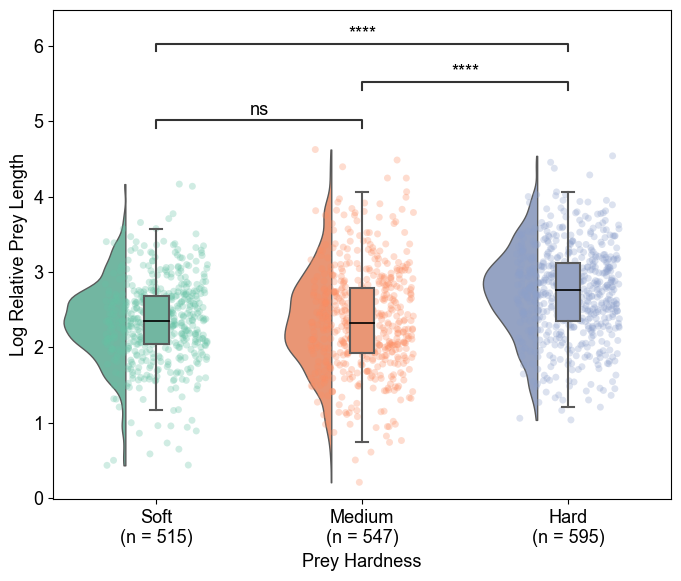

In [ ]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

# 设置变量与标签
var = 'log_Prey_rel_length'
label = 'Log Relative Prey Length'
hardness_order = ["Soft", "Medium", "Hard"]
palette = {"Soft": "#66c2a5", "Medium": "#fc8d62", "Hard": "#8da0cb"}

# 样本量统计
sample_counts = df.groupby('Prey_Hardness')[var].count()
xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in hardness_order]

# 创建图形
plt.figure(figsize=(7, 6))
ax = plt.gca()
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
# 半小提琴图
pt.half_violinplot(
    x='Prey_Hardness', y=var, data=df,
    palette=palette, bw=.2, cut=0., scale="area",
    width=.6, inner=None, orient="v", linewidth=1,
    order=hardness_order, ax=ax, zorder=-1
)

# ✅ 修复后的箱线图（一次性画全体，颜色不乱位）
sns.boxplot(
    x='Prey_Hardness', y=var, data=df,
    order=hardness_order, palette=palette, width=.12,
    showcaps=True,
    boxprops={"zorder": 10},  # ✅ 只保留 zorder，不设颜色
    whiskerprops={"linewidth": 1.5, "zorder": 10},
    medianprops={"color": "black", "linewidth": 1.2},
    showfliers=False, zorder=10
)


# 散点图（低透明度）
sns.stripplot(
    x='Prey_Hardness', y=var, data=df,
    order=hardness_order, palette=palette,
    jitter=0.25, alpha=0.3, zorder=0
)

# 显著性标注
comparisons = [("Soft", "Medium"), ("Soft", "Hard"), ("Medium", "Hard")]
annotator = Annotator(ax, comparisons, data=df,
                      x='Prey_Hardness', y=var,
                      order=hardness_order)
annotator.configure(test='t-test_ind', text_format='star',
                    loc='inside', comparisons_correction="fdr_bh")
annotator.apply_and_annotate()

# 标签与格式
ax.set_xticklabels(xtick_labels)
plt.xlabel("Prey Hardness")
plt.ylabel(label)
plt.tight_layout()
plt.show()


# 不同猎物类型相对体型

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:4.174e-76 t=-1.984e+01
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:2.594e-01 t=-1.129e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:8.144e-06 t=-4.528e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:1.915e-97 t=-2.288e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:1.037e-07 t=-5.460e+00
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:5.274e-65 t=-1.827e+01


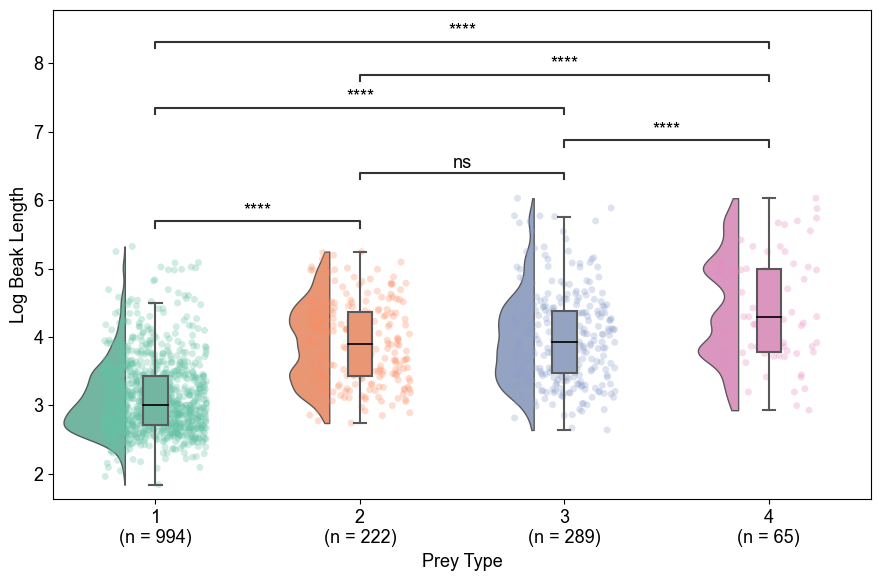

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:1.350e-37 t=-1.326e+01
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:1.450e-04 t=-3.828e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.757e-05 t=-4.249e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:2.176e-76 t=-1.981e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:8.103e-12 t=-7.134e+00
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:6.642e-54 t=-1.638e+01


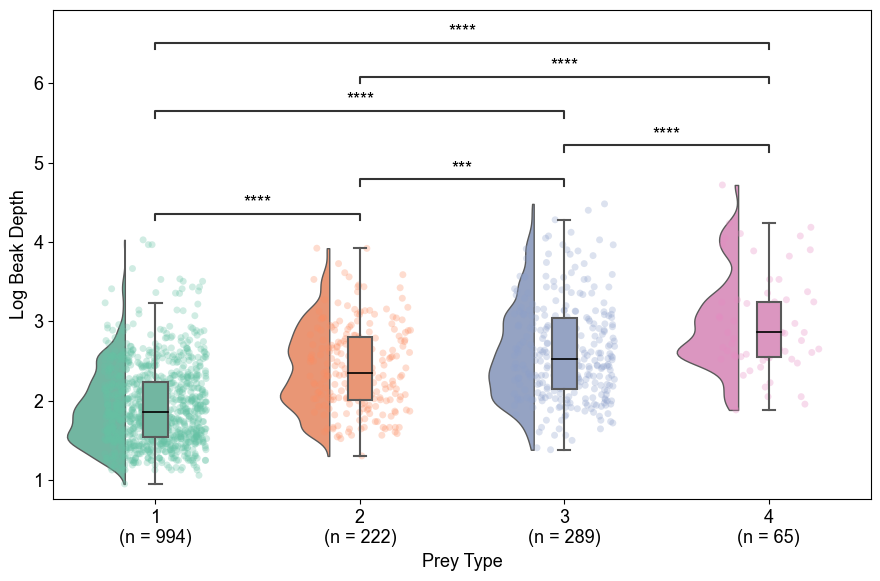

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:5.794e-16 t=-8.206e+00
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:1.350e-05 t=-4.395e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:1.776e-04 t=-3.789e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:3.417e-51 t=-1.574e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.352e-11 t=-6.959e+00
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:1.005e-41 t=-1.414e+01


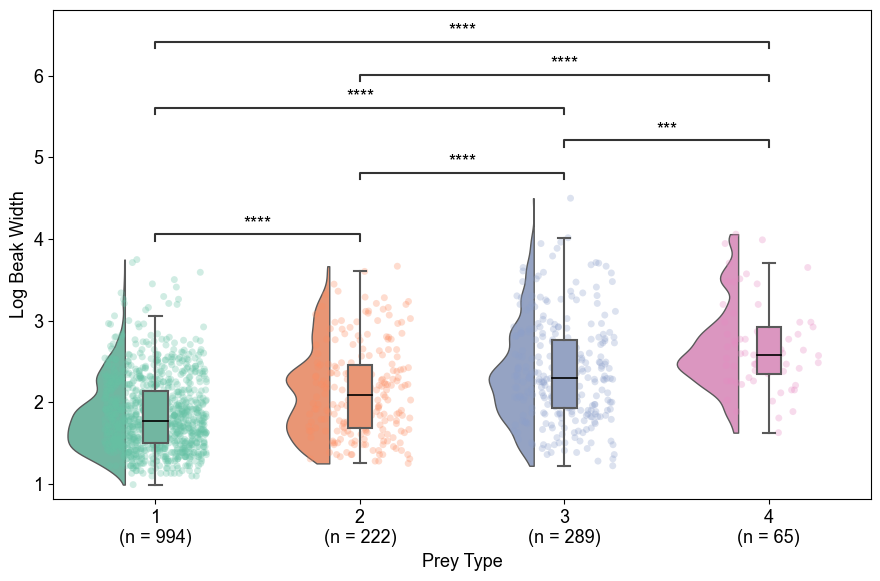

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:3.982e-45 t=-1.470e+01
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:9.052e-04 t=-3.338e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:1.120e-05 t=-4.457e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:7.520e-82 t=-2.063e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.697e-11 t=-6.937e+00
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:5.231e-57 t=-1.692e+01


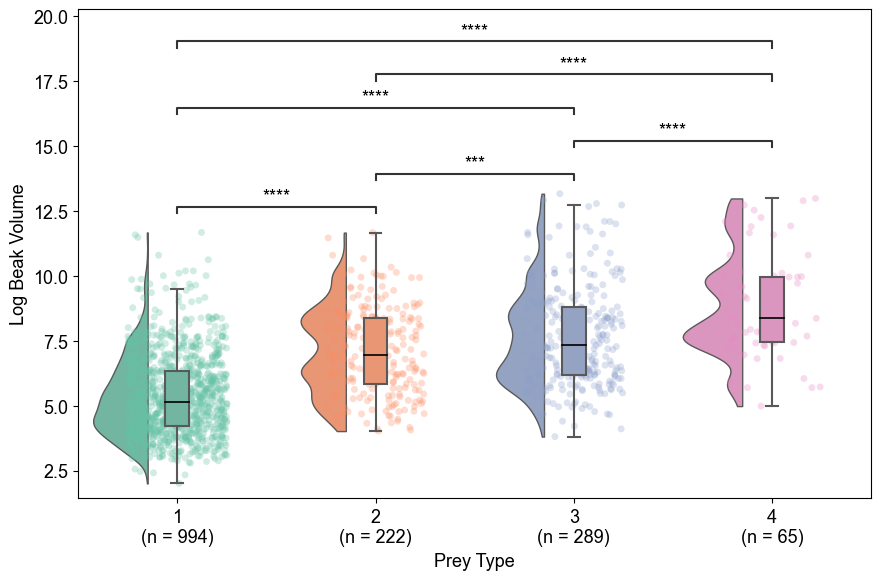

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:7.398e-27 t=-1.099e+01
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:2.794e-05 t=-4.228e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:4.306e-05 t=-4.143e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:1.588e-65 t=-1.812e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:4.781e-12 t=-7.219e+00
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:6.005e-48 t=-1.531e+01


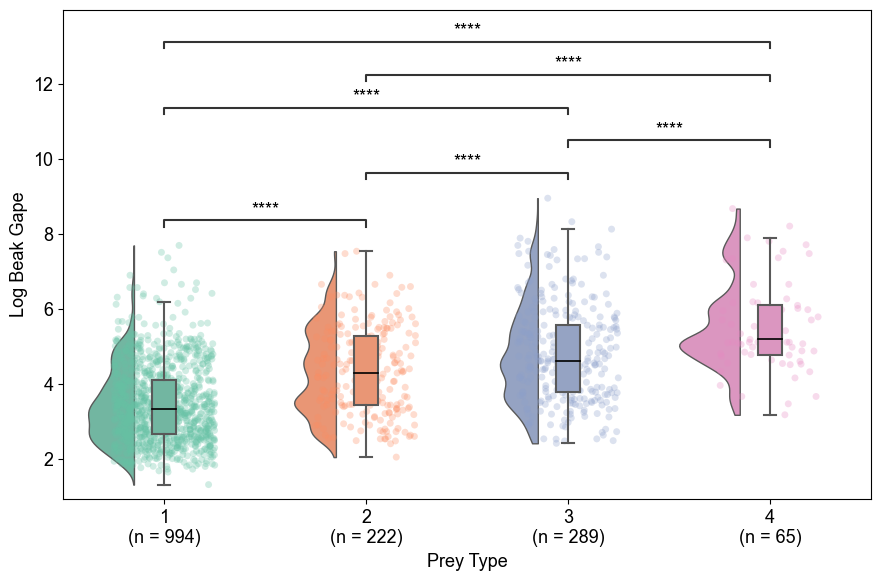

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:1.738e-25 t=-1.067e+01
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:5.590e-05 t=4.064e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:3.815e-01 t=-8.762e-01
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:7.821e-08 t=-5.403e+00
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:7.513e-02 t=1.786e+00
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:4.163e-05 t=-4.116e+00


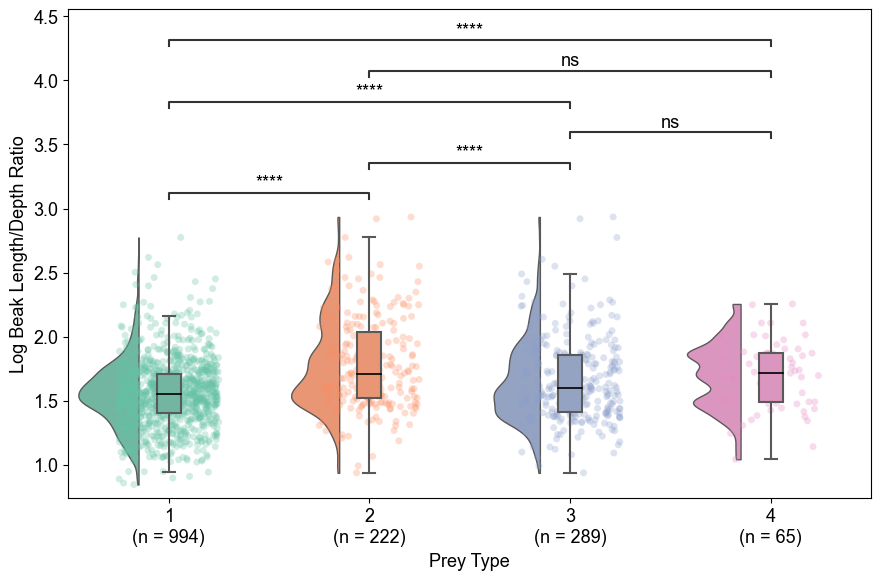

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:2.445e-08 t=-5.614e+00
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:3.566e-04 t=-3.594e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:7.000e-03 t=-2.713e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:6.133e-31 t=-1.188e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:1.545e-06 t=-4.909e+00
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.906e-23 t=-1.017e+01


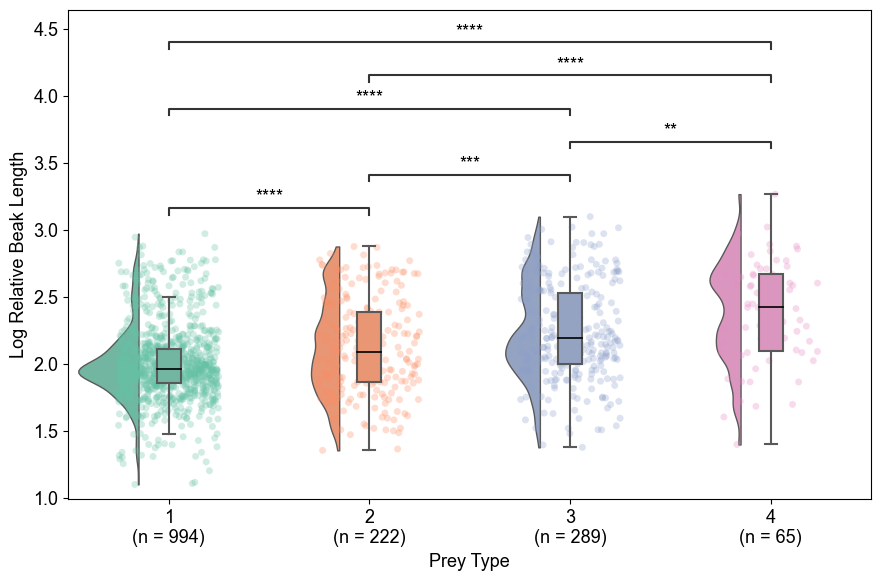

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:6.037e-59 t=-1.710e+01
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:5.345e-18 t=-8.978e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:7.037e-22 t=-1.029e+01
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:2.300e-168 t=-3.234e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.398e-35 t=-1.431e+01
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:3.700e-128 t=-2.779e+01


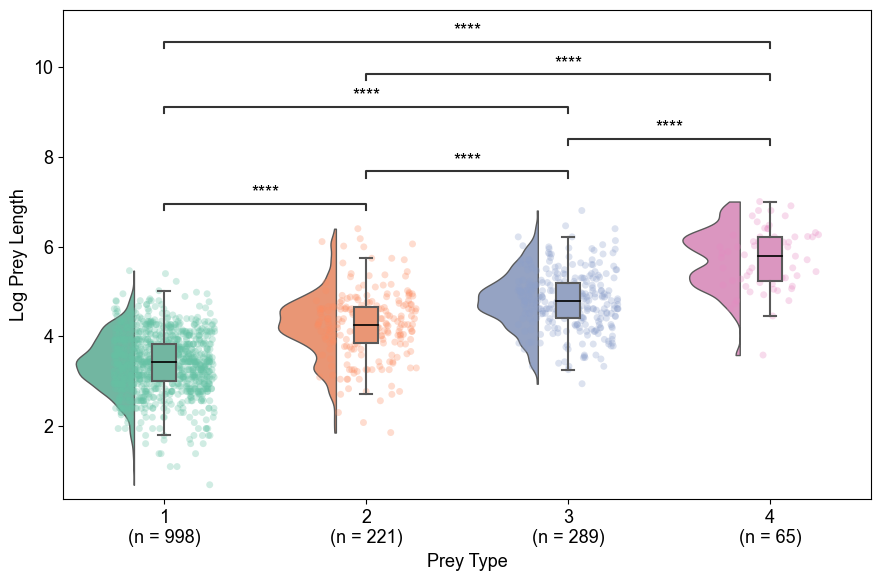

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:2.012e-04 t=-3.729e+00
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:1.159e-29 t=-1.207e+01
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:1.672e-18 t=-9.289e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:6.213e-82 t=-2.064e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:4.652e-35 t=-1.423e+01
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.773e-71 t=-1.929e+01


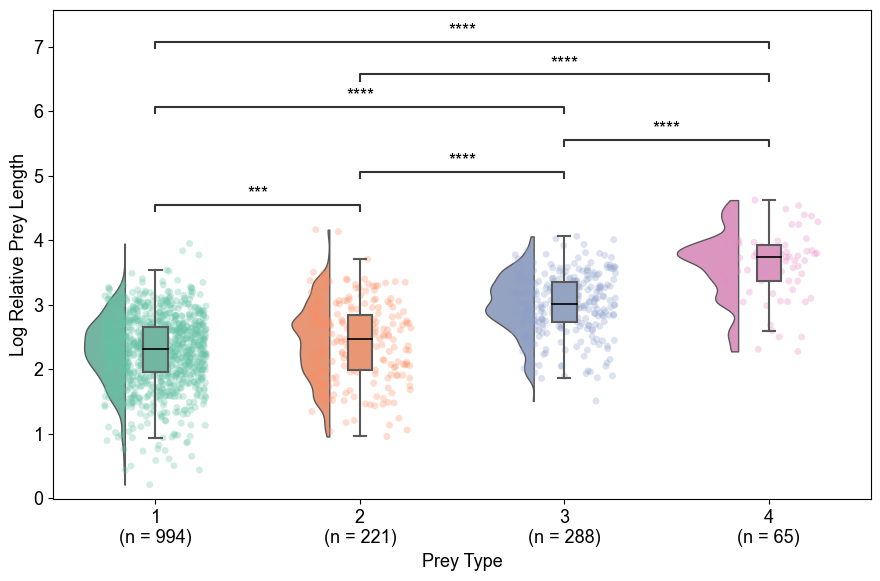

In [ ]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

# 变量和标签（这里可以继续扩展）
plot_vars = {
    'log_Beak.Length_Culmen': "Log Beak Length",
    'log_Beak.Depth': 'Log Beak Depth',
    'log_Beak.Width': 'Log Beak Width',
    'log_Beak_volume': 'Log Beak Volume',
    'log_Beak_gape': 'Log Beak Gape',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio',
    'log_Beak_rel_length': 'Log Relative Beak Length',
    'log_Size': 'Log Prey Length',
    'log_Prey_rel_length': 'Log Relative Prey Length',
}

# 设置样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

# 获取分类顺序 & 调色板
type_order = sorted(df['Size.Type'].dropna().unique())
palette = sns.color_palette("Set2", n_colors=len(type_order))
palette = dict(zip(type_order, palette))

# 循环绘图
for var, label in plot_vars.items():
    sample_counts = df.groupby('Size.Type')[var].count()
    xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in type_order]

    plt.figure(figsize=(9, 6))
    ax = plt.gca()

    # 半小提琴图
    pt.half_violinplot(
        x='Size.Type', y=var, data=df,
        palette=palette, bw=.2, cut=0., scale="area",
        width=.6, inner=None, orient="v", linewidth=1,
        order=type_order, ax=ax, zorder=-1
    )

    # 箱线图
    sns.boxplot(
        x='Size.Type', y=var, data=df,
        order=type_order, palette=palette, width=.12,
        showcaps=True,
        boxprops={"zorder": 10},
        whiskerprops={"linewidth": 1.5, "zorder": 10},
        medianprops={"color": "black", "linewidth": 1.2},
        showfliers=False, zorder=10
    )

    # 散点图
    sns.stripplot(
        x='Size.Type', y=var, data=df,
        order=type_order, palette=palette,
        jitter=0.25, alpha=0.3, zorder=0
    )

    # 显著性比较
    comparisons = [(a, b) for i, a in enumerate(type_order) for b in type_order[i+1:]]
    annotator = Annotator(ax, comparisons, data=df,
                          x='Size.Type', y=var,
                          order=type_order)
    annotator.configure(test='t-test_ind', text_format='star',
                        loc='inside', comparisons_correction="fdr_bh")
    annotator.apply_and_annotate()

    # 标签与格式
    ax.set_xticklabels(xtick_labels)
    plt.xlabel("Prey Type")
    plt.ylabel(label)
    plt.tight_layout()
    plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:2.012e-04 t=-3.729e+00
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:1.159e-29 t=-1.207e+01
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:1.672e-18 t=-9.289e+00
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:6.213e-82 t=-2.064e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:4.652e-35 t=-1.423e+01
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.773e-71 t=-1.929e+01


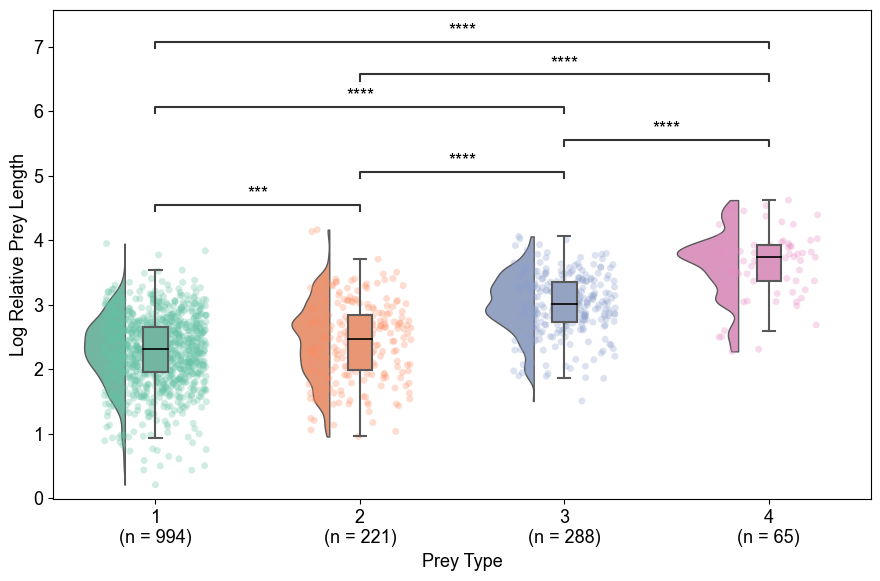

In [ ]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

# 设置变量与标签
var = 'log_Prey_rel_length'
label = 'Log Relative Prey Length'
type_order = sorted(df['Size.Type'].dropna().unique())  # 获取分类顺序，可自行排序
palette = sns.color_palette("Set2", n_colors=len(type_order))
palette = dict(zip(type_order, palette))  # 转为字典便于指定颜色

# 样本量统计
sample_counts = df.groupby('Size.Type')[var].count()
xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in type_order]

# 创建图形
plt.figure(figsize=(9, 6))
ax = plt.gca()
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

# 半小提琴图
pt.half_violinplot(
    x='Size.Type', y=var, data=df,
    palette=palette, bw=.2, cut=0., scale="area",
    width=.6, inner=None, orient="v", linewidth=1,
    order=type_order, ax=ax, zorder=-1
)

# 箱线图
sns.boxplot(
    x='Size.Type', y=var, data=df,
    order=type_order, palette=palette, width=.12,
    showcaps=True,
    boxprops={"zorder": 10},
    whiskerprops={"linewidth": 1.5, "zorder": 10},
    medianprops={"color": "black", "linewidth": 1.2},
    showfliers=False, zorder=10
)

# 散点图
sns.stripplot(
    x='Size.Type', y=var, data=df,
    order=type_order, palette=palette,
    jitter=0.25, alpha=0.3, zorder=0
)

# 显著性比较（如果需要）
comparisons = [(a, b) for i, a in enumerate(type_order) for b in type_order[i+1:]]
annotator = Annotator(ax, comparisons, data=df,
                      x='Size.Type', y=var,
                      order=type_order)
annotator.configure(test='t-test_ind', text_format='star',
                    loc='inside', comparisons_correction="fdr_bh")
annotator.apply_and_annotate()

# 设置标签
ax.set_xticklabels(xtick_labels)
plt.xlabel("Prey Type")
plt.ylabel(label)
plt.tight_layout()
plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: t-test independent samples with Benjamini-Hochberg correction, P_val:6.037e-59 t=-1.710e+01
2 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:5.345e-18 t=-8.978e+00
3 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:7.037e-22 t=-1.029e+01
1 vs. 3: t-test independent samples with Benjamini-Hochberg correction, P_val:2.300e-168 t=-3.234e+01
2 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:2.398e-35 t=-1.431e+01
1 vs. 4: t-test independent samples with Benjamini-Hochberg correction, P_val:3.700e-128 t=-2.779e+01


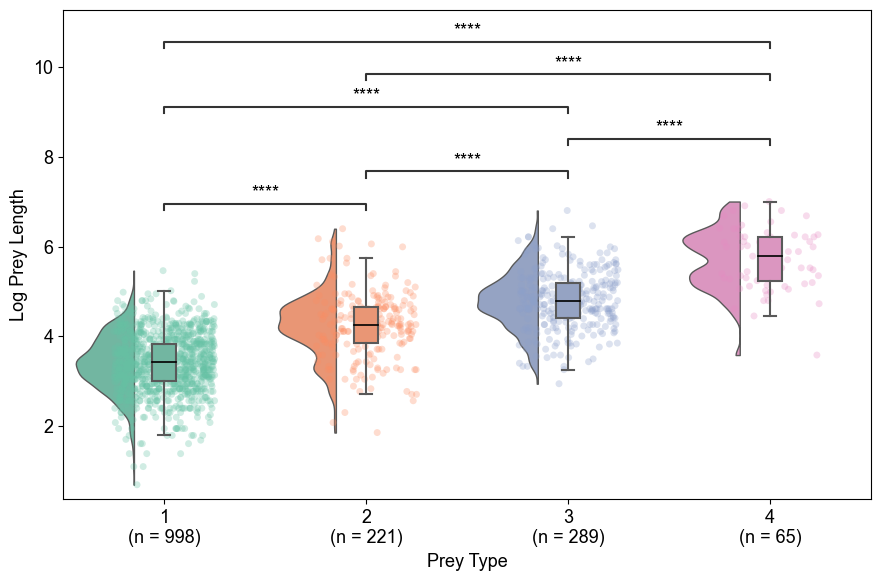

In [ ]:
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

# 设置变量与标签
var = 'log_Size'
label = 'Log Prey Length'
type_order = sorted(df['Size.Type'].dropna().unique())
palette = sns.color_palette("Set2", n_colors=len(type_order))
palette = dict(zip(type_order, palette))

# 样本量统计
sample_counts = df.groupby('Size.Type')[var].count()
xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in type_order]

# 创建图形
plt.figure(figsize=(9, 6))
ax = plt.gca()
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

# 半小提琴图
pt.half_violinplot(
    x='Size.Type', y=var, data=df,
    palette=palette, bw=.2, cut=0., scale="area",
    width=.6, inner=None, orient="v", linewidth=1,
    order=type_order, ax=ax, zorder=-1
)

# 箱线图
sns.boxplot(
    x='Size.Type', y=var, data=df,
    order=type_order, palette=palette, width=.12,
    showcaps=True,
    boxprops={"zorder": 10},
    whiskerprops={"linewidth": 1.5, "zorder": 10},
    medianprops={"color": "black", "linewidth": 1.2},
    showfliers=False, zorder=10
)

# 散点图
sns.stripplot(
    x='Size.Type', y=var, data=df,
    order=type_order, palette=palette,
    jitter=0.25, alpha=0.3, zorder=0
)

# 显著性比较
comparisons = [(a, b) for i, a in enumerate(type_order) for b in type_order[i+1:]]
annotator = Annotator(ax, comparisons, data=df,
                      x='Size.Type', y=var,
                      order=type_order)
annotator.configure(test='t-test_ind', text_format='star',
                    loc='inside', comparisons_correction="fdr_bh")
annotator.apply_and_annotate()

# 设置标签
ax.set_xticklabels(xtick_labels)
plt.xlabel("Prey Type")
plt.ylabel(label)
plt.tight_layout()
plt.show()


# 线性拟合

C:\Users\86186\AppData\Local\Temp\ipykernel_1884\2064411176.py:70: UserWarning: Glyph 21913 (\N{CJK UNIFIED IDEOGRAPH-5599}) missing from current font.
  plt.tight_layout()
C:\Users\86186\AppData\Local\Temp\ipykernel_1884\2064411176.py:70: UserWarning: Glyph 38271 (\N{CJK UNIFIED IDEOGRAPH-957F}) missing from current font.
  plt.tight_layout()
C:\Users\86186\AppData\Local\Temp\ipykernel_1884\2064411176.py:70: UserWarning: Glyph 29454 (\N{CJK UNIFIED IDEOGRAPH-730E}) missing from current font.
  plt.tight_layout()
C:\Users\86186\AppData\Local\Temp\ipykernel_1884\2064411176.py:70: UserWarning: Glyph 29289 (\N{CJK UNIFIED IDEOGRAPH-7269}) missing from current font.
  plt.tight_layout()
C:\Users\86186\AppData\Local\Temp\ipykernel_1884\2064411176.py:70: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  plt.tight_layout()
C:\Users\86186\AppData\Local\Temp\ipykernel_1884\2064411176.py:70: UserWarning: Glyph 28145 (\N{CJK UNIFIED IDEOGRAPH-6DF1}) missing fr

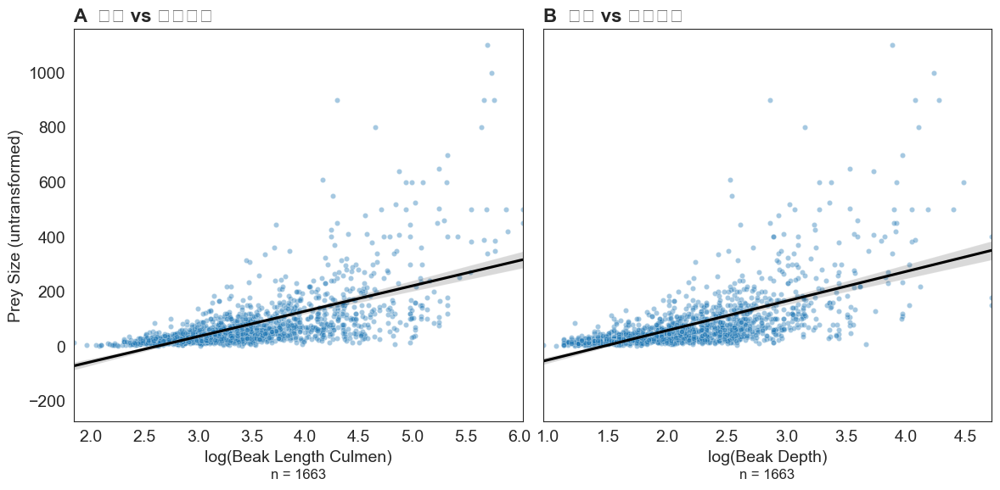

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ================= 样式设置 =================
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 14

# 假设 df 已经存在，包含以下变量：
# df['Size'] (猎物长度, 未 log 转换)
# df['log_Beak.Length_Culmen'] (喙长)
# df['log_Beak.Depth'] (喙深)

# ================ 绘图 =================
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

# -------- 图 A：喙长 vs 猎物长度 --------
sns.scatterplot(
    data=df,
    x="log_Beak.Length_Culmen", 
    y="Size", 
    alpha=0.4, ax=axes[0], s=20
)

sns.regplot(
    data=df,
    x="log_Beak.Length_Culmen", 
    y="Size",
    scatter=False, ax=axes[0], color="black", ci=95
)

axes[0].set_title("A  喙长 vs 猎物长度", loc="left", fontsize=16, weight="bold")
axes[0].set_xlabel("log(Beak Length Culmen)")
axes[0].set_ylabel("Prey Size (untransformed)")
# 样本量标注在下方
n1 = df[["log_Beak.Length_Culmen", "Size"]].dropna().shape[0]
axes[0].text(0.5, -0.12, f"n = {n1}", transform=axes[0].transAxes, 
             ha="center", va="top", fontsize=12)

# -------- 图 B：喙深 vs 猎物长度 --------
sns.scatterplot(
    data=df,
    x="log_Beak.Depth", 
    y="Size", 
    alpha=0.4, ax=axes[1], s=20
)

sns.regplot(
    data=df,
    x="log_Beak.Depth", 
    y="Size",
    scatter=False, ax=axes[1], color="black", ci=95
)

axes[1].set_title("B  喙深 vs 猎物长度", loc="left", fontsize=16, weight="bold")
axes[1].set_xlabel("log(Beak Depth)")
axes[1].set_ylabel("")

# 样本量标注在下方
n2 = df[["log_Beak.Depth", "Size"]].dropna().shape[0]
axes[1].text(0.5, -0.12, f"n = {n2}", transform=axes[1].transAxes, 
             ha="center", va="top", fontsize=12)

# -------- 调整整体 y 轴范围 (往下延申) --------
ymin, ymax = axes[0].get_ylim()
axes[0].set_ylim(ymin - (ymax - ymin) * 0.1, ymax)  # 往下延申 10%
axes[1].set_ylim(axes[0].get_ylim())

plt.tight_layout()
plt.show()


C:\Users\86186\AppData\Local\Temp\ipykernel_1884\1453061006.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['log_Size'] = np.log(df_clean['Size'])



=== Model a: log_Size ~ log_Beak.Length_Culmen ===
                            OLS Regression Results                            
Dep. Variable:               log_Size   R-squared:                       0.622
Model:                            OLS   Adj. R-squared:                  0.622
Method:                 Least Squares   F-statistic:                     1999.
Date:                Mon, 18 Aug 2025   Prob (F-statistic):          6.40e-259
Time:                        01:24:30   Log-Likelihood:                -1167.7
No. Observations:                1217   AIC:                             2339.
Df Residuals:                    1215   BIC:                             2350.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


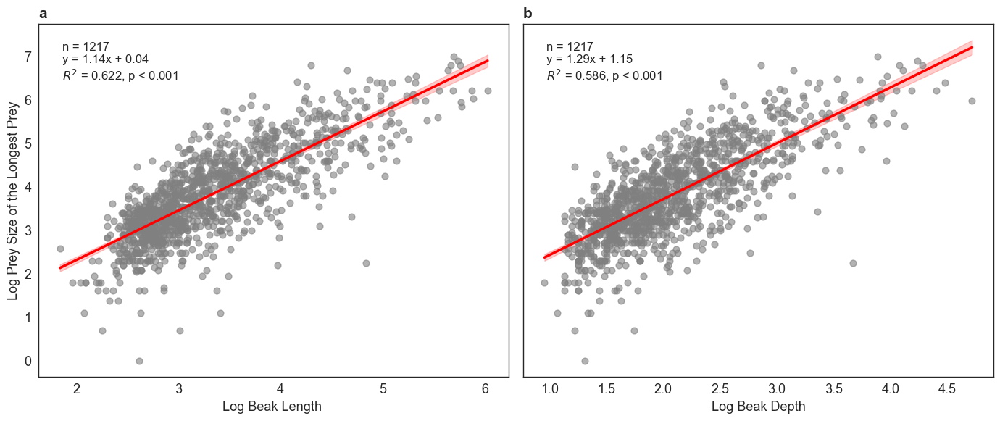

In [44]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from matplotlib.lines import Line2D

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
sns.set_style("white")

# -----------------------------
# 预处理：每物种最大猎物
# -----------------------------
df_clean = df.dropna(subset=['Size', 'log_Beak.Length_Culmen', 'log_Beak.Depth'])
df_clean['log_Size'] = np.log(df_clean['Size'])
df_max_size = df_clean.loc[df_clean.groupby('Species.BirdTree')['log_Size'].idxmax()]

# -----------------------------
# 创建两图
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

predictors = ['log_Beak.Length_Culmen', 'log_Beak.Depth']
x_labels = ['Log Beak Length ', 'Log Beak Depth']
titles = ['a', 'b']

for ax, pred, xlabel, title in zip(axes, predictors, x_labels, titles):
    x = df_max_size[pred]
    y = df_max_size['log_Size']

    model = smf.ols('log_Size ~ x', data=pd.DataFrame({'log_Size':y,'x':x})).fit()
    print(f"\n=== Model {title}: log_Size ~ {pred} ===")
    print(model.summary())

    x_pred = np.linspace(x.min(), x.max(), 200)
    pred_df = pd.DataFrame({'x': x_pred})
    pred_res = model.get_prediction(pred_df).summary_frame(alpha=0.05)

    ax.scatter(x, y, color='gray', alpha=0.6, s=40, zorder=2)
    ax.plot(x_pred, pred_res['mean'], color='red', linewidth=2.5)
    ax.fill_between(x_pred, pred_res['mean_ci_lower'], pred_res['mean_ci_upper'], color='red', alpha=0.2)

    # 样本量标注保持原样，不动
    n = len(df_max_size)
    slope = model.params['x']
    intercept = model.params['Intercept']
    r2 = model.rsquared
    pval = model.pvalues['x']
    p_text = "p < 0.001" if pval<0.001 else f"p = {pval:.3f}"
    textstr = f'n = {n}\ny = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.3f}, {p_text}'
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    ax.set_xlabel(xlabel)
    ax.set_ylabel("Log Prey Size of the Longest Prey" if title=='a' else "")
    ax.set_title(title, loc='left', fontsize=15, fontweight='bold')

    for spine in ['top','bottom','left','right']:
        ax.spines[spine].set_visible(True)
        ax.spines[spine].set_linewidth(1)

plt.tight_layout()
plt.show()


                            OLS Regression Results                            
Dep. Variable:               log_Size   R-squared:                       0.632
Model:                            OLS   Adj. R-squared:                  0.632
Method:                 Least Squares   F-statistic:                     2086.
Date:                Wed, 13 Aug 2025   Prob (F-statistic):          5.66e-266
Time:                        23:01:07   Log-Likelihood:                -1115.1
No. Observations:                1217   AIC:                             2234.
Df Residuals:                    1215   BIC:                             2244.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           1.4682      0.055     

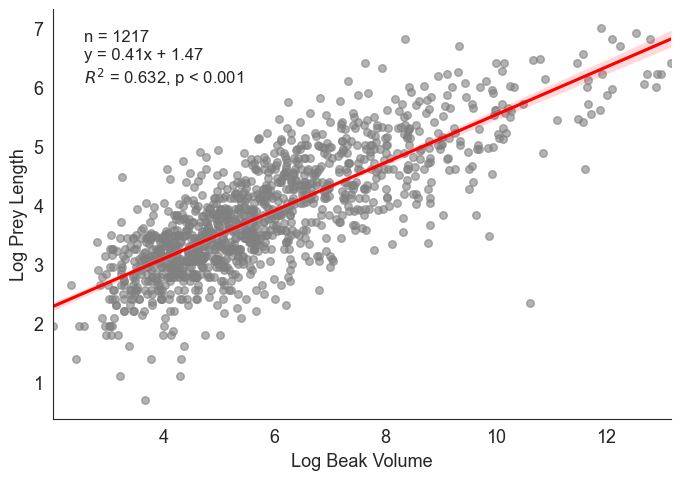

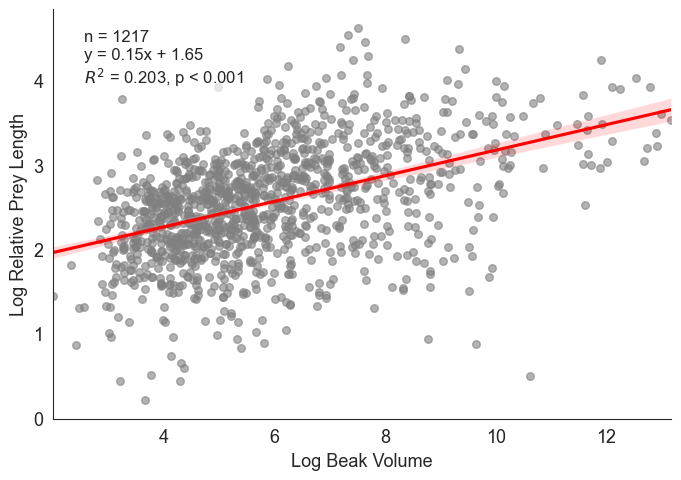

In [57]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import pandas as pd

# 设置全局字体
mpl.rcParams['font.family'] = 'Arial'

# === 1. 先筛选每个物种Size最大的个体 ===
df_max_size = df.loc[df.groupby('Species.BirdTree')['log_Size'].idxmax()]

# === 2. 线性建模 ===
# 绝对体型
df_lm1 = df_max_size[['log_Size', 'log_Beak_volume']].dropna()
model1 = smf.ols('log_Size ~ log_Beak_volume', data=df_lm1).fit()
print(model1.summary())

# 相对猎物长度
df_lm2 = df_max_size[['log_Prey_rel_length', 'log_Beak_volume']].dropna()
model2 = smf.ols('log_Prey_rel_length ~ log_Beak_volume', data=df_lm2).fit()
print(model2.summary())

# === 3. 绘图函数 ===
def format_pval(p):
    if p > 0.5:
        return "p > 0.5"
    elif p > 0.05:
        return "p < 0.05"
    elif p > 0.01:
        return "p < 0.01"
    else:
        return "p < 0.001"

def plot_model(df, xvar, yvar, model):
    plt.figure(figsize=(7, 5))
    sns.set_style("white")  # 移除背景网格
    ax = sns.regplot(
        x=xvar, y=yvar, data=df,
        scatter_kws={'s': 30, 'alpha': 0.6, 'color': 'gray'},
        line_kws={"color": "red"}
    )

    # 回归信息
    intercept = model.params['Intercept']
    slope = model.params[xvar]
    r2 = model.rsquared
    pval = model.pvalues[xvar]
    p_text = format_pval(pval)
    n = df[[xvar, yvar]].dropna().shape[0]  # 有效样本量

    textstr = f'n = {n}\ny = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.3f}, {p_text}'
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes,
            fontsize=12, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # 坐标轴标签
    ax.set_xlabel("Log Beak Volume", fontsize=13)
    ax.set_ylabel("Log Prey Length" if yvar == 'log_Size' else "Log Relative Prey Length", fontsize=13)

    sns.despine()
    plt.tight_layout()
    plt.show()

# === 4. 绘图调用 ===
plot_model(df_max_size, 'log_Beak_volume', 'log_Size', model1)
plot_model(df_max_size, 'log_Beak_volume', 'log_Prey_rel_length', model2)


In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

# 线性模型：log_Prey_length ~ log_Beak_volume 绝对体型
# 去除缺失值
df_lm1 = df[['log_Size', 'log_Beak_volume']].dropna()

# 拟合模型
model1 = smf.ols('log_Size ~ log_Beak_volume', data=df_lm1).fit()
print(model1.summary())

# 去除缺失值
df_lm2 = df[['log_Prey_rel_length', 'log_Beak_volume']].dropna()

# 拟合模型
model2 = smf.ols('log_Prey_rel_length ~ log_Beak_volume', data=df_lm2).fit()
print(model2.summary())



                            OLS Regression Results                            
Dep. Variable:               log_Size   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.550
Method:                 Least Squares   F-statistic:                     1915.
Date:                Tue, 05 Aug 2025   Prob (F-statistic):          5.98e-274
Time:                        21:48:58   Log-Likelihood:                -1515.6
No. Observations:                1568   AIC:                             3035.
Df Residuals:                    1566   BIC:                             3046.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           1.6742      0.053     

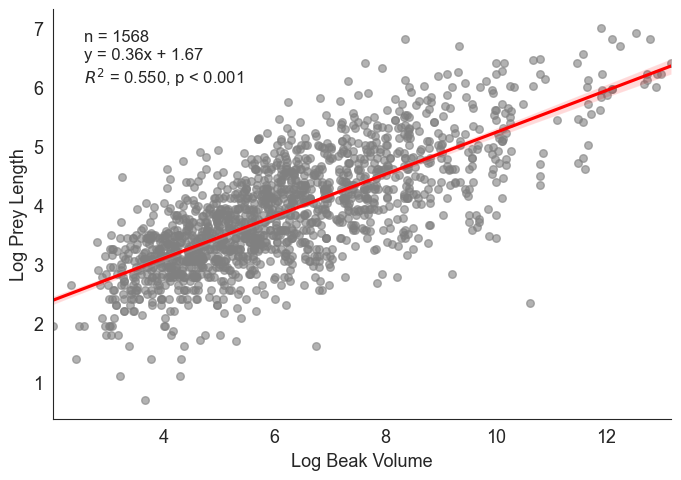

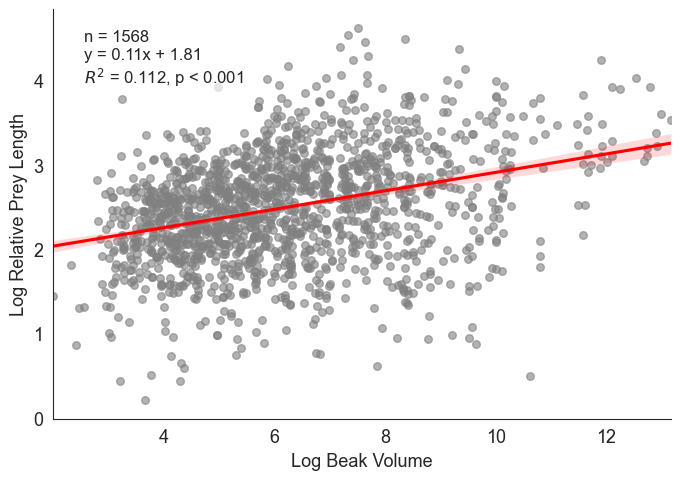

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

# 设置全局字体
mpl.rcParams['font.family'] = 'Arial'

def format_pval(p):
    if p > 0.5:
        return "p > 0.5"
    elif p > 0.05:
        return "p < 0.05"
    elif p > 0.01:
        return "p < 0.01"
    else:
        return "p < 0.001"

def plot_model(df, xvar, yvar, model):
    plt.figure(figsize=(7, 5))
    sns.set_style("white")  # 移除背景网格
    ax = sns.regplot(
        x=xvar, y=yvar, data=df,
        scatter_kws={'s': 30, 'alpha': 0.6, 'color': 'gray'},  # 灰色散点
        line_kws={"color": "red"}
    )

    # 回归信息
    intercept = model.params['Intercept']
    slope = model.params[xvar]
    r2 = model.rsquared
    pval = model.pvalues[xvar]
    p_text = format_pval(pval)
    n = df[[xvar, yvar]].dropna().shape[0]  # 有效样本量

    # 注释文本
    textstr = f'n = {n}\ny = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.3f}, {p_text}'
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes,
            fontsize=12, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # 坐标轴标签
    ax.set_xlabel("Log Beak Volume", fontsize=13)
    ax.set_ylabel("Log Prey Length" if yvar == 'log_Size' else "Log Relative Prey Length", fontsize=13)

    sns.despine()
    plt.tight_layout()
    plt.show()

# 绘图调用
plot_model(df, 'log_Beak_volume', 'log_Size', model1)
plot_model(df, 'log_Beak_volume', 'log_Prey_rel_length', model2)


## 分鸟类目拟合

--- Passeriformes ---
Model: y = 0.32x + 1.84
R² = 0.37, R = 0.61, p < 0.001

--- Charadriiformes ---
Model: y = 0.41x + 1.46
R² = 0.40, R = 0.63, p < 0.001

--- Coraciiformes ---
Model: y = 0.30x + 2.18
R² = 0.21, R = 0.46, p < 0.001

--- Pelecaniformes ---
Model: y = 0.33x + 2.04
R² = 0.23, R = 0.48, p < 0.001

--- Piciformes ---
Model: y = 0.35x + 1.43
R² = 0.47, R = 0.69, p < 0.001



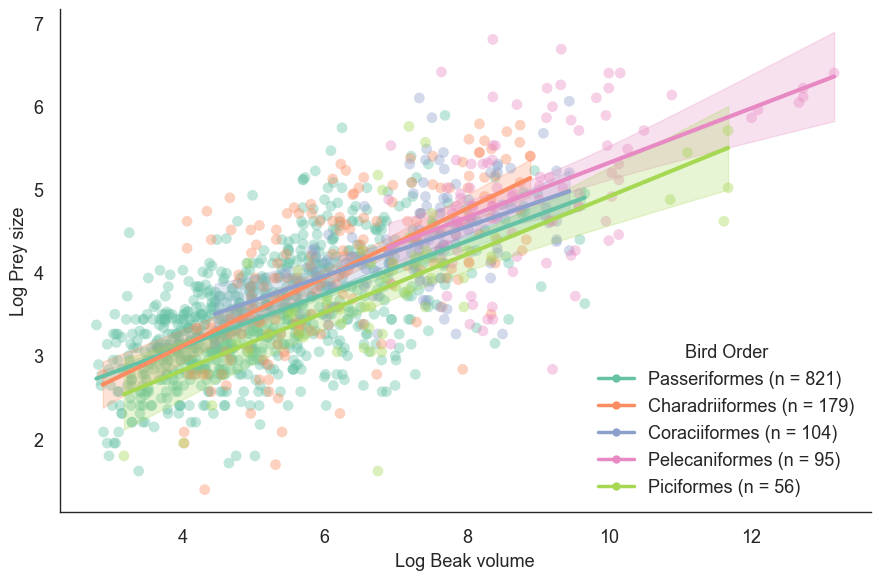

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from matplotlib.lines import Line2D

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
sns.set_style("white")

top_orders = df['Order3'].value_counts().head(5).index.tolist()
palette = sns.color_palette("Set2", n_colors=len(top_orders))

plt.figure(figsize=(9, 6))
legend_elements = []

for i, order in enumerate(top_orders):
    subset = df[df['Order3'] == order].dropna(subset=['log_Beak_volume', 'log_Size'])
    x = subset['log_Beak_volume']
    y = subset['log_Size']
    n = len(subset)  # 样本量

    model = smf.ols('log_Size ~ log_Beak_volume', data=subset).fit()
    a = model.params['log_Beak_volume']
    b = model.params['Intercept']
    r_squared = model.rsquared
    r_val, p_val = pearsonr(x, y)

    if p_val > 0.5:
        p_str = "p > 0.5"
    elif p_val < 0.001:
        p_str = "p < 0.001"
    elif p_val < 0.01:
        p_str = "p < 0.01"
    elif p_val < 0.05:
        p_str = "p < 0.05"
    else:
        p_str = f"p = {p_val:.2f}"

    print(f"--- {order} ---")
    print(f"Model: y = {a:.2f}x + {b:.2f}")
    print(f"R² = {r_squared:.2f}, R = {r_val:.2f}, {p_str}\n")

    x_pred = np.linspace(x.min(), x.max(), 200)
    pred_df = pd.DataFrame({'log_Beak_volume': x_pred})
    pred_res = model.get_prediction(pred_df).summary_frame(alpha=0.05)

    plt.scatter(x, y, color=palette[i], alpha=0.4, edgecolors='none', s=60)
    plt.plot(x_pred, pred_res['mean'], color=palette[i], linewidth=3)
    plt.fill_between(x_pred, pred_res['mean_ci_lower'], pred_res['mean_ci_upper'],
                     color=palette[i], alpha=0.25)

    # 添加样本量到图例
    label_with_n = f"{order} (n = {n})"
    legend_elements.append(Line2D([0], [0], color=palette[i], marker='o',
                                  markersize=6, linewidth=2.5, label=label_with_n,
                                  markerfacecolor=palette[i], markeredgewidth=0))

plt.xlabel("Log Beak volume")
plt.ylabel("Log Prey size")
plt.legend(handles=legend_elements, title="Bird Order", frameon=False, loc='lower right')

ax = plt.gca()
for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)

plt.grid(False)
sns.despine(trim=False)
plt.tick_params(axis='x', direction='out', pad=8)
plt.tick_params(axis='y', direction='out', pad=8)
plt.tight_layout()
plt.show()


--- Passeriformes ---
Model: y = 0.09x + 1.95
R² = 0.05, R = 0.23, p < 0.001

--- Charadriiformes ---
Model: y = 0.17x + 1.33
R² = 0.11, R = 0.34, p < 0.001

--- Coraciiformes ---
Model: y = 0.07x + 2.52
R² = 0.01, R = 0.12, p = 0.22

--- Pelecaniformes ---
Model: y = 0.09x + 2.02
R² = 0.03, R = 0.17, p = 0.10

--- Piciformes ---
Model: y = 0.17x + 1.36
R² = 0.19, R = 0.43, p < 0.001



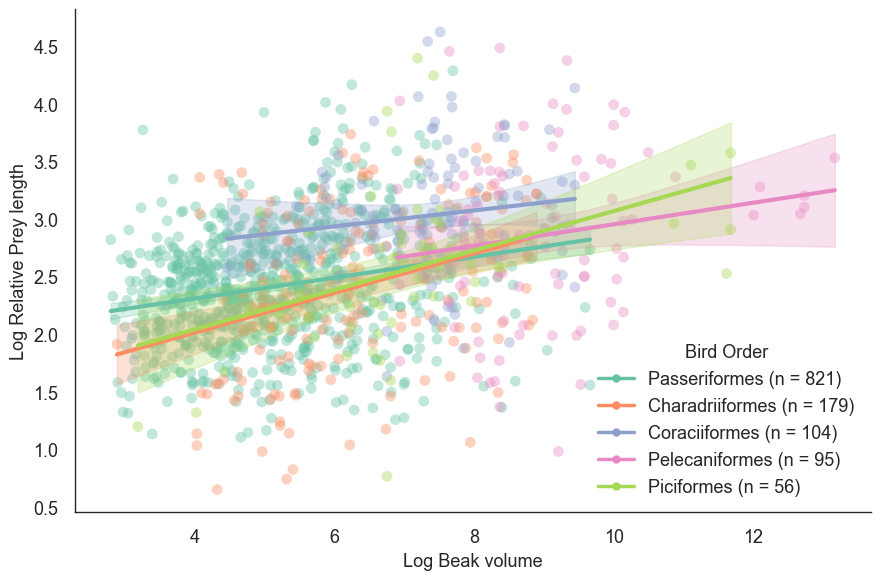

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from matplotlib.lines import Line2D

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
sns.set_style("white")

top_orders = df['Order3'].value_counts().head(5).index.tolist()
palette = sns.color_palette("Set2", n_colors=len(top_orders))

plt.figure(figsize=(9, 6))
legend_elements = []

for i, order in enumerate(top_orders):
    subset = df[df['Order3'] == order].dropna(subset=['log_Beak_volume', 'log_Prey_rel_length'])
    x = subset['log_Beak_volume']
    y = subset['log_Prey_rel_length']

    model = smf.ols('log_Prey_rel_length ~ log_Beak_volume', data=subset).fit()
    a = model.params['log_Beak_volume']
    b = model.params['Intercept']
    r_squared = model.rsquared
    r_val, p_val = pearsonr(x, y)

    if p_val > 0.5:
        p_str = "p > 0.5"
    elif p_val < 0.001:
        p_str = "p < 0.001"
    elif p_val < 0.01:
        p_str = "p < 0.01"
    elif p_val < 0.05:
        p_str = "p < 0.05"
    else:
        p_str = f"p = {p_val:.2f}"

    print(f"--- {order} ---")
    print(f"Model: y = {a:.2f}x + {b:.2f}")
    print(f"R² = {r_squared:.2f}, R = {r_val:.2f}, {p_str}\n")

    x_pred = np.linspace(x.min(), x.max(), 200)
    pred_df = pd.DataFrame({'log_Beak_volume': x_pred})
    pred_res = model.get_prediction(pred_df).summary_frame(alpha=0.05)

    plt.scatter(x, y, color=palette[i], alpha=0.4, edgecolors='none', s=60)
    plt.plot(x_pred, pred_res['mean'], color=palette[i], linewidth=3)
    plt.fill_between(x_pred, pred_res['mean_ci_lower'], pred_res['mean_ci_upper'],
                     color=palette[i], alpha=0.25)

    # 加入样本量
    n_samples = len(subset)

    legend_elements.append(Line2D([0], [0], color=palette[i], marker='o',
                                  markersize=6, linewidth=2.5,
                                  label=f"{order} (n = {n_samples})",
                                  markerfacecolor=palette[i], markeredgewidth=0))


plt.xlabel("Log Beak volume")
plt.ylabel("Log Relative Prey length")
plt.legend(handles=legend_elements, title="Bird Order", frameon=False, loc='lower right')

ax = plt.gca()
for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)

plt.grid(False)
sns.despine(trim=False)
plt.tick_params(axis='x', direction='out', pad=8)
plt.tick_params(axis='y', direction='out', pad=8)
plt.tight_layout()
plt.show()


## 分猎物硬度拟合

--- Prey Hardness: Hard ---
Model: y = 0.31x + 2.08
R² = 0.45, R = 0.67, p < 0.001

--- Prey Hardness: Medium ---
Model: y = 0.35x + 1.64
R² = 0.45, R = 0.67, p < 0.001

--- Prey Hardness: Soft ---
Model: y = 0.35x + 1.71
R² = 0.45, R = 0.67, p < 0.001



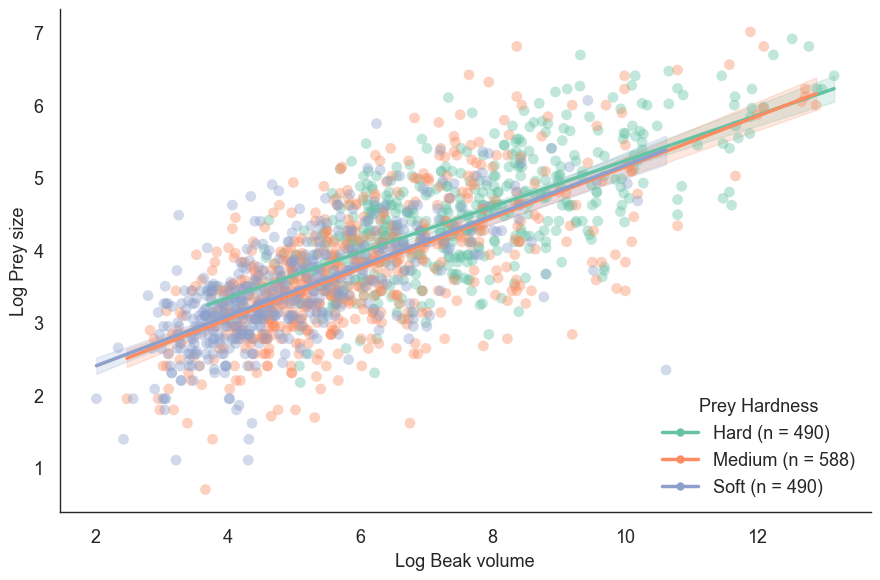

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from matplotlib.lines import Line2D

# 设置字体和样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
sns.set_style("white")

# 获取硬度等级顺序
hardness_levels = df['Prey_Hardness'].dropna().unique()
hardness_levels = sorted(hardness_levels)

# 设置颜色
palette = sns.color_palette("Set2", n_colors=len(hardness_levels))
color_map = dict(zip(hardness_levels, palette))

plt.figure(figsize=(9, 6))
legend_elements = []

for hardness in hardness_levels:
    subset = df[df['Prey_Hardness'] == hardness].dropna(subset=['log_Beak_volume', 'log_Size'])

    x = subset['log_Beak_volume']
    y = subset['log_Size']

    if len(subset) < 3:
        continue  # 样本太少跳过

    # 拟合线性模型
    model = smf.ols('log_Size ~ log_Beak_volume', data=subset).fit()
    a = model.params['log_Beak_volume']
    b = model.params['Intercept']
    r_squared = model.rsquared
    r_val, p_val = pearsonr(x, y)

    # p 值等级标注
    if p_val > 0.5:
        p_str = "p > 0.5"
    elif p_val < 0.001:
        p_str = "p < 0.001"
    elif p_val < 0.01:
        p_str = "p < 0.01"
    elif p_val < 0.05:
        p_str = "p < 0.05"
    else:
        p_str = f"p = {p_val:.2f}"

    # 打印模型信息
    print(f"--- Prey Hardness: {hardness} ---")
    print(f"Model: y = {a:.2f}x + {b:.2f}")
    print(f"R² = {r_squared:.2f}, R = {r_val:.2f}, {p_str}\n")

    # 回归预测和置信区间
    x_pred = np.linspace(x.min(), x.max(), 200)
    pred_df = pd.DataFrame({'log_Beak_volume': x_pred})
    pred_res = model.get_prediction(pred_df).summary_frame(alpha=0.05)

    # 散点图（颜色与线一致）
    plt.scatter(
        x, y,
        color=color_map[hardness], alpha=0.4, edgecolors='none', s=60, zorder=2
    )

    # 回归线
    plt.plot(x_pred, pred_res['mean'], color=color_map[hardness], linewidth=2.5, zorder=3)

    # 区间带
    plt.fill_between(x_pred, pred_res['mean_ci_lower'], pred_res['mean_ci_upper'],
                     color=color_map[hardness], alpha=0.2, zorder=1)

    n_samples = len(subset)  # 计算该组样本量

    # 添加图例元素：点在线上的符号，并加样本量
    legend_elements.append(Line2D(
        [0], [0],
        color=color_map[hardness],
        marker='o',
        markersize=6,
        linewidth=2.5,
        label=f"{hardness} (n = {n_samples})",
        markerfacecolor=color_map[hardness],
        markeredgewidth=0
    ))


# 图例，位置右下角
plt.legend(handles=legend_elements, title="Prey Hardness", frameon=False, loc='lower right')

# 坐标轴标签
plt.xlabel("Log Beak volume")
plt.ylabel("Log Prey size")

# 细节美化
ax = plt.gca()
for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)

plt.grid(False)
sns.despine(trim=False)
plt.tick_params(axis='x', direction='out', pad=8)
plt.tick_params(axis='y', direction='out', pad=8)

plt.tight_layout()
plt.show()


--- Prey Hardness: Hard ---
Model: y = 0.07x + 2.20
R² = 0.04, R = 0.20, p < 0.001

--- Prey Hardness: Medium ---
Model: y = 0.10x + 1.81
R² = 0.07, R = 0.26, p < 0.001

--- Prey Hardness: Soft ---
Model: y = 0.10x + 1.84
R² = 0.07, R = 0.27, p < 0.001



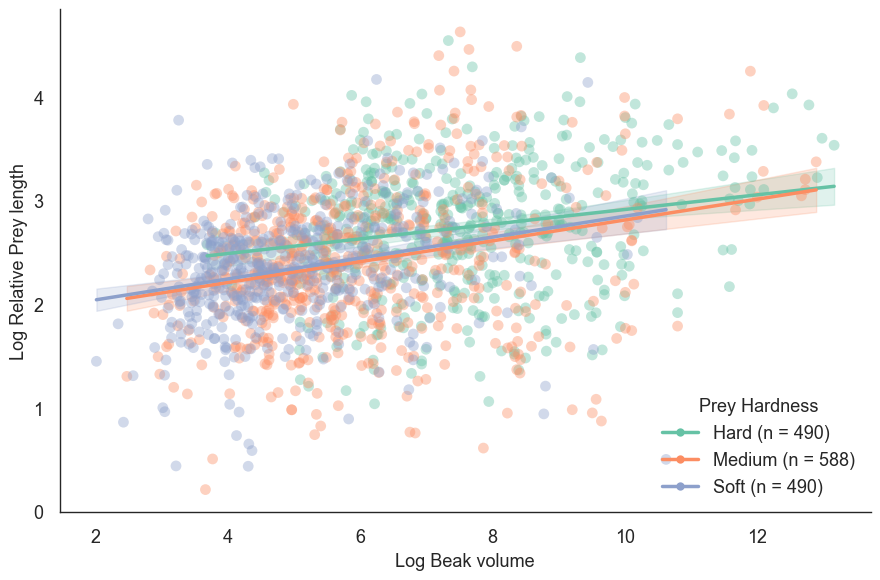

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from matplotlib.lines import Line2D

# 设置字体和样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
sns.set_style("white")

# 获取硬度等级顺序
hardness_levels = df['Prey_Hardness'].dropna().unique()
hardness_levels = sorted(hardness_levels)

# 设置颜色
palette = sns.color_palette("Set2", n_colors=len(hardness_levels))
color_map = dict(zip(hardness_levels, palette))

plt.figure(figsize=(9, 6))
legend_elements = []

for hardness in hardness_levels:
    subset = df[df['Prey_Hardness'] == hardness].dropna(subset=['log_Beak_volume', 'log_Prey_rel_length'])

    x = subset['log_Beak_volume']
    y = subset['log_Prey_rel_length']

    if len(subset) < 3:
        continue  # 样本太少跳过

    # 拟合线性模型
    model = smf.ols('log_Prey_rel_length ~ log_Beak_volume', data=subset).fit()
    a = model.params['log_Beak_volume']
    b = model.params['Intercept']
    r_squared = model.rsquared
    r_val, p_val = pearsonr(x, y)

    # p 值等级标注
    if p_val > 0.5:
        p_str = "p > 0.5"
    elif p_val < 0.001:
        p_str = "p < 0.001"
    elif p_val < 0.01:
        p_str = "p < 0.01"
    elif p_val < 0.05:
        p_str = "p < 0.05"
    else:
        p_str = f"p = {p_val:.2f}"

    # 打印模型信息
    print(f"--- Prey Hardness: {hardness} ---")
    print(f"Model: y = {a:.2f}x + {b:.2f}")
    print(f"R² = {r_squared:.2f}, R = {r_val:.2f}, {p_str}\n")

    # 回归预测和置信区间
    x_pred = np.linspace(x.min(), x.max(), 200)
    pred_df = pd.DataFrame({'log_Beak_volume': x_pred})
    pred_res = model.get_prediction(pred_df).summary_frame(alpha=0.05)

    # 散点图（颜色与线一致）
    plt.scatter(
        x, y,
        color=color_map[hardness], alpha=0.4, edgecolors='none', s=60, zorder=2
    )

    # 回归线
    plt.plot(x_pred, pred_res['mean'], color=color_map[hardness], linewidth=2.5, zorder=3)

    # 区间带
    plt.fill_between(x_pred, pred_res['mean_ci_lower'], pred_res['mean_ci_upper'],
                     color=color_map[hardness], alpha=0.2, zorder=1)

    n_samples = len(subset)  # 计算该组样本量

    # 添加图例元素：点在线上的符号，并加样本量
    legend_elements.append(Line2D(
        [0], [0],
        color=color_map[hardness],
        marker='o',
        markersize=6,
        linewidth=2.5,
        label=f"{hardness} (n = {n_samples})",
        markerfacecolor=color_map[hardness],
        markeredgewidth=0
    ))


# 图例，位置右下角
plt.legend(handles=legend_elements, title="Prey Hardness", frameon=False, loc='lower right')

# 坐标轴标签
plt.xlabel("Log Beak volume")
plt.ylabel("Log Relative Prey length")

# 细节美化
ax = plt.gca()
for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)

plt.grid(False)
sns.despine(trim=False)
plt.tick_params(axis='x', direction='out', pad=8)
plt.tick_params(axis='y', direction='out', pad=8)

plt.tight_layout()
plt.show()


## 分猎物类型拟合

--- Size.Type: 1 (Absolute Size) ---
Model: y = 0.24x + 2.09
R² = 0.33, R = 0.58, p < 0.001

--- Size.Type: 2 (Absolute Size) ---
Model: y = 0.24x + 2.58
R² = 0.28, R = 0.53, p < 0.001

--- Size.Type: 3 (Absolute Size) ---
Model: y = 0.25x + 2.91
R² = 0.53, R = 0.73, p < 0.001

--- Size.Type: 4 (Absolute Size) ---
Model: y = 0.22x + 3.78
R² = 0.41, R = 0.64, p < 0.001



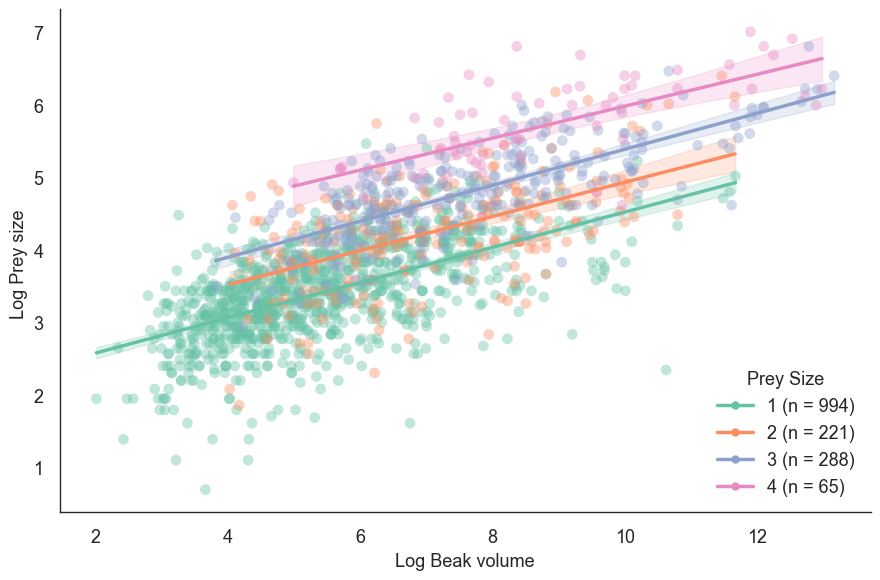

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from matplotlib.lines import Line2D

# 设置字体和样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
sns.set_style("white")

# 获取猎物类型列表（排除NA）
prey_types = df['Size.Type'].dropna().unique()
prey_types = sorted(prey_types)

# 颜色映射
palette = sns.color_palette("Set2", n_colors=len(prey_types))
color_map = dict(zip(prey_types, palette))

plt.figure(figsize=(9, 6))
legend_elements = []

for prey_type in prey_types:
    subset = df[df['Size.Type'] == prey_type].dropna(subset=['log_Beak_volume', 'log_Size'])

    x = subset['log_Beak_volume']
    y = subset['log_Size']

    if len(subset) < 3:
        continue  # 样本太少跳过

    # 拟合线性模型
    model = smf.ols('log_Size ~ log_Beak_volume', data=subset).fit()
    a = model.params['log_Beak_volume']
    b = model.params['Intercept']
    r_squared = model.rsquared
    r_val, p_val = pearsonr(x, y)

    # p 值等级标注
    if p_val > 0.5:
        p_str = "p > 0.5"
    elif p_val < 0.001:
        p_str = "p < 0.001"
    elif p_val < 0.01:
        p_str = "p < 0.01"
    elif p_val < 0.05:
        p_str = "p < 0.05"
    else:
        p_str = f"p = {p_val:.2f}"

    # 打印回归信息
    print(f"--- Size.Type: {prey_type} (Absolute Size) ---")
    print(f"Model: y = {a:.2f}x + {b:.2f}")
    print(f"R² = {r_squared:.2f}, R = {r_val:.2f}, {p_str}\n")

    # 预测和置信区间
    x_pred = np.linspace(x.min(), x.max(), 200)
    pred_df = pd.DataFrame({'log_Beak_volume': x_pred})
    pred_res = model.get_prediction(pred_df).summary_frame(alpha=0.05)

    # 散点
    plt.scatter(x, y, color=color_map[prey_type], alpha=0.4, edgecolors='none', s=60, zorder=2)

    # 回归线
    plt.plot(x_pred, pred_res['mean'], color=color_map[prey_type], linewidth=2.5, zorder=3)

    # 置信区间带
    plt.fill_between(x_pred, pred_res['mean_ci_lower'], pred_res['mean_ci_upper'],
                     color=color_map[prey_type], alpha=0.2, zorder=1)

    n_samples = len(subset)
    label_with_n = f"{prey_type} (n = {n_samples})"
    legend_elements.append(Line2D([0], [0], color=color_map[prey_type], marker='o',
                              markersize=6, linewidth=2.5, label=label_with_n,
                              markerfacecolor=color_map[prey_type], markeredgewidth=0))


# 图例放右下角
plt.legend(handles=legend_elements, title="Prey Size", frameon=False, loc='lower right')

plt.xlabel("Log Beak volume")
plt.ylabel("Log Prey size ")

ax = plt.gca()
for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)

plt.grid(False)
sns.despine(trim=False)
plt.tick_params(axis='x', direction='out', pad=8)
plt.tick_params(axis='y', direction='out', pad=8)

plt.tight_layout()
plt.show()


--- Size.Type: 1 (Relative Size) ---
Model: y = 0.03x + 2.12
R² = 0.01, R = 0.08, p < 0.01

--- Size.Type: 2 (Relative Size) ---
Model: y = 0.01x + 2.37
R² = 0.00, R = 0.02, p > 0.5

--- Size.Type: 3 (Relative Size) ---
Model: y = 0.03x + 2.75
R² = 0.02, R = 0.14, p < 0.05

--- Size.Type: 4 (Relative Size) ---
Model: y = -0.01x + 3.67
R² = 0.00, R = -0.02, p > 0.5



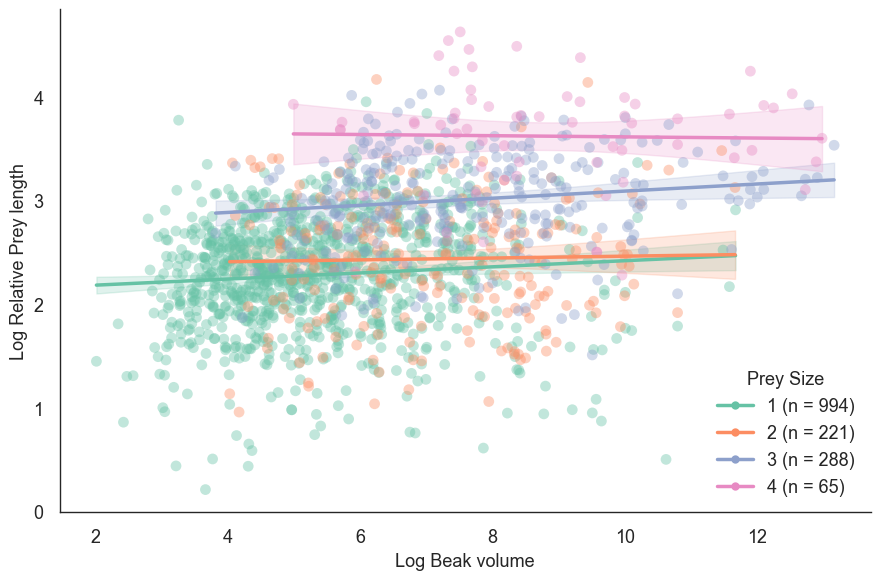

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from matplotlib.lines import Line2D

# 设置字体和样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
sns.set_style("white")

# 获取猎物类型列表（排除NA）
prey_types = df['Size.Type'].dropna().unique()
prey_types = sorted(prey_types)

# 颜色映射
palette = sns.color_palette("Set2", n_colors=len(prey_types))
color_map = dict(zip(prey_types, palette))

plt.figure(figsize=(9, 6))
legend_elements = []

for prey_type in prey_types:
    subset = df[df['Size.Type'] == prey_type].dropna(subset=['log_Beak_volume', 'log_Prey_rel_length'])

    x = subset['log_Beak_volume']
    y = subset['log_Prey_rel_length']

    if len(subset) < 3:
        continue  # 样本太少跳过

    # 拟合线性模型
    model = smf.ols('log_Prey_rel_length ~ log_Beak_volume', data=subset).fit()
    a = model.params['log_Beak_volume']
    b = model.params['Intercept']
    r_squared = model.rsquared
    r_val, p_val = pearsonr(x, y)

    # p 值等级标注
    if p_val > 0.5:
        p_str = "p > 0.5"
    elif p_val < 0.001:
        p_str = "p < 0.001"
    elif p_val < 0.01:
        p_str = "p < 0.01"
    elif p_val < 0.05:
        p_str = "p < 0.05"
    else:
        p_str = f"p = {p_val:.2f}"

    # 打印回归信息
    print(f"--- Size.Type: {prey_type} (Relative Size) ---")
    print(f"Model: y = {a:.2f}x + {b:.2f}")
    print(f"R² = {r_squared:.2f}, R = {r_val:.2f}, {p_str}\n")

    # 预测和置信区间
    x_pred = np.linspace(x.min(), x.max(), 200)
    pred_df = pd.DataFrame({'log_Beak_volume': x_pred})
    pred_res = model.get_prediction(pred_df).summary_frame(alpha=0.05)

    # 散点
    plt.scatter(x, y, color=color_map[prey_type], alpha=0.4, edgecolors='none', s=60, zorder=2)

    # 回归线
    plt.plot(x_pred, pred_res['mean'], color=color_map[prey_type], linewidth=2.5, zorder=3)

    # 置信区间带
    plt.fill_between(x_pred, pred_res['mean_ci_lower'], pred_res['mean_ci_upper'],
                     color=color_map[prey_type], alpha=0.2, zorder=1)

    n_samples = len(subset)
    label_with_n = f"{prey_type} (n = {n_samples})"
    legend_elements.append(Line2D([0], [0], color=color_map[prey_type], marker='o',
                              markersize=6, linewidth=2.5, label=label_with_n,
                              markerfacecolor=color_map[prey_type], markeredgewidth=0))

# 图例放右下角
plt.legend(handles=legend_elements, title="Prey Size", frameon=False, loc='lower right')

# 坐标轴标签
plt.xlabel("Log Beak volume")
plt.ylabel("Log Relative Prey length")

ax = plt.gca()
for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)

plt.grid(False)
sns.despine(trim=False)
plt.tick_params(axis='x', direction='out', pad=8)
plt.tick_params(axis='y', direction='out', pad=8)

plt.tight_layout()
plt.show()


# 非线性拟合

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     12.3117
Link Function:                     IdentityLink Log Likelihood:                                 -1563.2949
Number of Samples:                         1217 AIC:                                             3153.2131
                                                AICc:                                            3153.5299
                                                GCV:                                                0.3554
                                                Scale:                                              0.3489
                                                Pseudo R-Squared:                                   0.6526
Feature Function                  Lam

C:\Users\86186\AppData\Local\Temp\ipykernel_1884\3090516855.py:67: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())  # 输出模型摘要


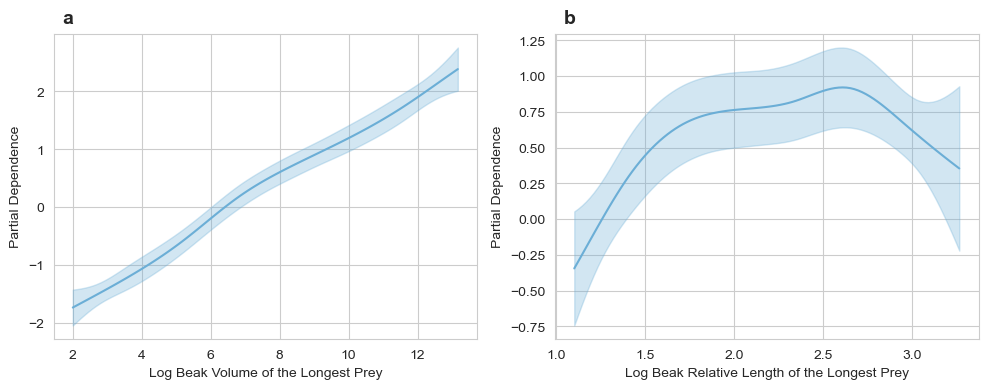

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.preprocessing import LabelEncoder

plt.rcParams["font.family"] = "Arial"
import seaborn as sns
sns.set_style("whitegrid")

# 配色
palette_cont = "#6baed6"  # 淡蓝
palette_cat = "#fd8d3c"   # 柔和橙

# 连续和分类变量
cont_predictors = [   'log_Beak_volume', 'log_Beak_rel_length'
                   ]
cat_predictors = []
all_predictors = cont_predictors + cat_predictors
response_vars = ['log_Size']  # 绝对体型

friendly_names = {
    'log_Beak_volume': 'Log Beak Volume of the Longest Prey',
    'log_Beak.Length_Culmen': 'Log Beak Length of the Longest Prey',
    'log_Beak_rel_length': 'Log Beak Relative Length of the Longest Prey',
    'log_Beak.Width': 'Log Beak Width of the Longest Prey',
    'log_Beak.Depth': 'Log Beak Depth of the Longest Prey',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio of the Longest Prey',
    'log_Beak_gape': 'Log Beak Gape of the Longest Prey',
    'Size.Type': 'Prey Type',
    'log_Size': 'Log Prey Length of the Longest Prey'
}

# -----------------------------
# 数据预处理
# -----------------------------
df_clean = df[all_predictors + ['log_Size','Size','Species.BirdTree']].copy()
df_clean = df_clean.replace([np.inf, -np.inf], np.nan).dropna(subset=['log_Size','Size']+cont_predictors+['Species.BirdTree'])

# 每物种取最长猎物
df_max_size = df_clean.loc[df_clean.groupby('Species.BirdTree')['Size'].idxmax()]

# 分类变量编码
label_encoders = {}
for var in cat_predictors:
    le = LabelEncoder()
    df_max_size[var] = le.fit_transform(df_max_size[var].astype(str))
    label_encoders[var] = le

# -----------------------------
# GAM 拟合
# -----------------------------
X = df_max_size[all_predictors].values
y = df_max_size['log_Size'].values

# 只调节连续变量的 n_splines 和 lam
terms = None
for i, var in enumerate(all_predictors):
    if var in cont_predictors:
        term = s(i, n_splines=10, lam=0.6)  # 更灵活曲线
    else:
        term = f(i)
    terms = term if terms is None else terms + term

gam = LinearGAM(terms).fit(X, y)

print(gam.summary())  # 输出模型摘要

# -----------------------------
# 绘图
# -----------------------------
n_terms = len(all_predictors)
n_cols = 3
n_rows = int(np.ceil(n_terms / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axs = axs.flatten()

# 用小写字母作为子图标注
import string
letters = string.ascii_lowercase

for i in range(n_terms):
    ax = axs[i]
    var = all_predictors[i]
    
    if var in cont_predictors:
        XX = gam.generate_X_grid(term=i)
        pdep, confi = gam.partial_dependence(term=i, X=XX, width=0.95)
        lower = confi[:, 0]
        upper = confi[:, 1]
        ax.plot(XX[:, i], pdep, color=palette_cont)
        ax.fill_between(XX[:, i], lower, upper, color=palette_cont, alpha=0.3)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
        
    else:
        le = label_encoders[var]
        n_cats = len(le.classes_)
        XX = gam.generate_X_grid(term=i, n=n_cats)
        pdep = gam.partial_dependence(term=i, X=XX)
        confi = gam.confidence_intervals(X=XX, width=0.95)
        yerr_lower = pdep - confi[:, 0]
        yerr_upper = confi[:, 1] - pdep
        yerr_lower = np.clip(yerr_lower, 0, None)
        yerr_upper = np.clip(yerr_upper, 0, None)
        yerr = np.vstack([yerr_lower, yerr_upper])
        
        categories = np.arange(n_cats)
        ax.bar(categories, pdep, yerr=yerr, color=palette_cat, alpha=0.7,
               edgecolor='black', capsize=5)
        counts = df_max_size[var].value_counts().sort_index()
        xticklabels = [
            f"{name}\n(n={counts.get(cat_idx,0)})"
            for cat_idx, name in enumerate(le.inverse_transform(categories))
        ]
        ax.set_xticks(categories)
        ax.set_xticklabels(xticklabels, rotation=0)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
    
    # 替换标题为左上角加粗字母
    ax.text(0.02, 1.08, f"{letters[i]}", transform=ax.transAxes,
            fontsize=14, fontweight='bold', verticalalignment='top')

for j in range(n_terms, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()



LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     14.3014
Link Function:                     IdentityLink Log Likelihood:                                 -1746.8567
Number of Samples:                         1217 AIC:                                             3524.3162
                                                AICc:                                            3524.7317
                                                GCV:                                                0.2773
                                                Scale:                                              0.2714
                                                Pseudo R-Squared:                                   0.7302
Feature Function                  Lam

C:\Users\86186\AppData\Local\Temp\ipykernel_12696\3793173140.py:67: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())  # 输出模型摘要


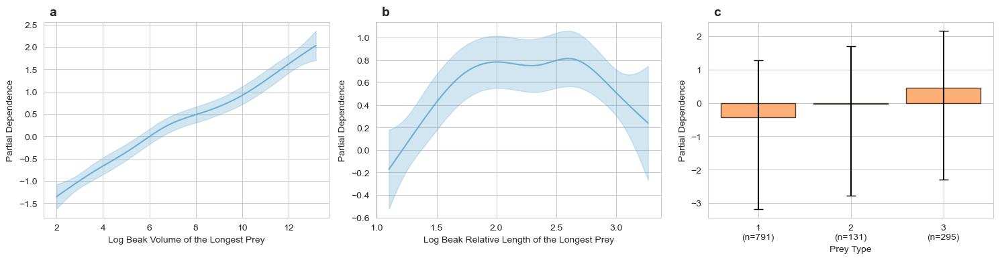

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.preprocessing import LabelEncoder

plt.rcParams["font.family"] = "Arial"
import seaborn as sns
sns.set_style("whitegrid")

# 配色
palette_cont = "#6baed6"  # 淡蓝
palette_cat = "#fd8d3c"   # 柔和橙

# 连续和分类变量
cont_predictors = [   'log_Beak_volume', 'log_Beak_rel_length'
                   ]
cat_predictors = ['Size.Type']
all_predictors = cont_predictors + cat_predictors
response_vars = ['log_Size']  # 绝对体型

friendly_names = {
    'log_Beak_volume': 'Log Beak Volume of the Longest Prey',
    'log_Beak.Length_Culmen': 'Log Beak Length of the Longest Prey',
    'log_Beak_rel_length': 'Log Beak Relative Length of the Longest Prey',
    'log_Beak.Width': 'Log Beak Width of the Longest Prey',
    'log_Beak.Depth': 'Log Beak Depth of the Longest Prey',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio of the Longest Prey',
    'log_Beak_gape': 'Log Beak Gape of the Longest Prey',
    'Size.Type': 'Prey Type',
    'log_Size': 'Log Prey Length of the Longest Prey'
}

# -----------------------------
# 数据预处理
# -----------------------------
df_clean = df[all_predictors + ['log_Size','Size','Species.BirdTree']].copy()
df_clean = df_clean.replace([np.inf, -np.inf], np.nan).dropna(subset=['log_Size','Size']+cont_predictors+['Species.BirdTree'])

# 每物种取最长猎物
df_max_size = df_clean.loc[df_clean.groupby('Species.BirdTree')['Size'].idxmax()]

# 分类变量编码
label_encoders = {}
for var in cat_predictors:
    le = LabelEncoder()
    df_max_size[var] = le.fit_transform(df_max_size[var].astype(str))
    label_encoders[var] = le

# -----------------------------
# GAM 拟合
# -----------------------------
X = df_max_size[all_predictors].values
y = df_max_size['log_Size'].values

# 只调节连续变量的 n_splines 和 lam
terms = None
for i, var in enumerate(all_predictors):
    if var in cont_predictors:
        term = s(i, n_splines=10, lam=0.6)  # 更灵活曲线
    else:
        term = f(i)
    terms = term if terms is None else terms + term

gam = LinearGAM(terms).fit(X, y)

print(gam.summary())  # 输出模型摘要

# -----------------------------
# 绘图
# -----------------------------
n_terms = len(all_predictors)
n_cols = 3
n_rows = int(np.ceil(n_terms / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axs = axs.flatten()

# 用小写字母作为子图标注
import string
letters = string.ascii_lowercase

for i in range(n_terms):
    ax = axs[i]
    var = all_predictors[i]
    
    if var in cont_predictors:
        XX = gam.generate_X_grid(term=i)
        pdep, confi = gam.partial_dependence(term=i, X=XX, width=0.95)
        lower = confi[:, 0]
        upper = confi[:, 1]
        ax.plot(XX[:, i], pdep, color=palette_cont)
        ax.fill_between(XX[:, i], lower, upper, color=palette_cont, alpha=0.3)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
        
    else:
        le = label_encoders[var]
        n_cats = len(le.classes_)
        XX = gam.generate_X_grid(term=i, n=n_cats)
        pdep = gam.partial_dependence(term=i, X=XX)
        confi = gam.confidence_intervals(X=XX, width=0.95)
        yerr_lower = pdep - confi[:, 0]
        yerr_upper = confi[:, 1] - pdep
        yerr_lower = np.clip(yerr_lower, 0, None)
        yerr_upper = np.clip(yerr_upper, 0, None)
        yerr = np.vstack([yerr_lower, yerr_upper])
        
        categories = np.arange(n_cats)
        ax.bar(categories, pdep, yerr=yerr, color=palette_cat, alpha=0.7,
               edgecolor='black', capsize=5)
        counts = df_max_size[var].value_counts().sort_index()
        xticklabels = [
            f"{name}\n(n={counts.get(cat_idx,0)})"
            for cat_idx, name in enumerate(le.inverse_transform(categories))
        ]
        ax.set_xticks(categories)
        ax.set_xticklabels(xticklabels, rotation=0)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
    
    # 替换标题为左上角加粗字母
    ax.text(0.02, 1.08, f"{letters[i]}", transform=ax.transAxes,
            fontsize=14, fontweight='bold', verticalalignment='top')

for j in range(n_terms, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()




===== GAM 模型摘要 =====
LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     51.1602
Link Function:                     IdentityLink Log Likelihood:                                 -1716.9394
Number of Samples:                         1217 AIC:                                             3538.1991
                                                AICc:                                            3542.9641
                                                GCV:                                                0.2823
                                                Scale:                                               0.261
                                                Pseudo R-Squared:                                   0.7485
Feature Functio

C:\Users\86186\AppData\Local\Temp\ipykernel_2344\4054487123.py:59: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


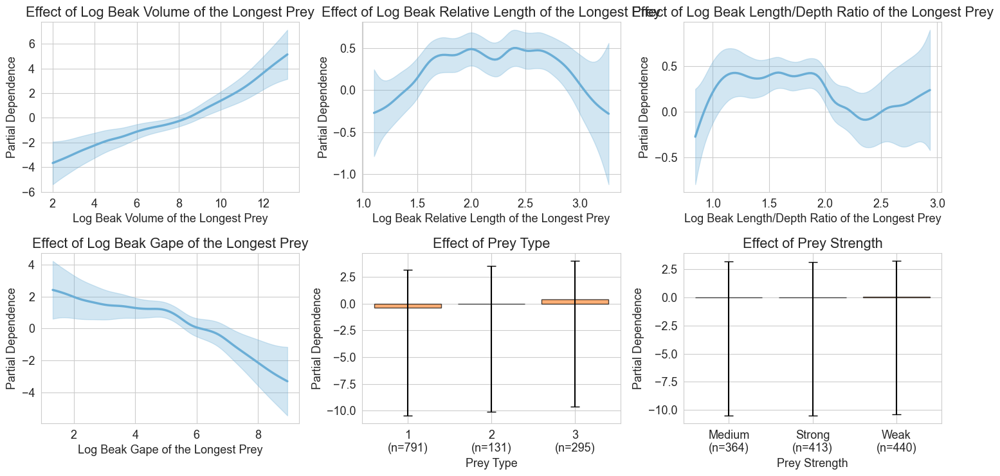

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.preprocessing import LabelEncoder

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13
import seaborn as sns
sns.set_style("whitegrid")

# ===================== 配色 =====================
palette_cont = "#6baed6"  # 淡蓝
palette_cat = "#fd8d3c"   # 柔和橙

# ===================== 变量设置 =====================
cont_predictors = ['log_Beak_volume', 'log_Beak_rel_length', 'log_Beak_length_depth_ratio', 'log_Beak_gape']
cat_predictors = ['Size.Type', 'Prey_Strength']  # 注意改名
all_predictors = cont_predictors + cat_predictors
response_var = 'log_Size'  # 绝对体型

friendly_names = {
    'log_Beak_volume': 'Log Beak Volume of the Longest Prey',
    'log_Beak_rel_length': 'Log Beak Relative Length of the Longest Prey',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio of the Longest Prey',
    'log_Beak_gape': 'Log Beak Gape of the Longest Prey',
    'Size.Type': 'Prey Type',
    'Prey_Strength': 'Prey Strength',
    'log_Size': 'Log Prey Length of the Longest Prey'
}

# ===================== 1. 数据预处理 =====================
df_clean = df[[response_var, 'Size'] + cont_predictors + cat_predictors + ['Species.BirdTree']].copy()
df_clean = df_clean.replace([np.inf, -np.inf], np.nan)
df_clean = df_clean.dropna(subset=[response_var, 'Size'] + cont_predictors)  # 保证响应和连续变量有效

# 每物种只取最长猎物
df_max_idx = df_clean.groupby('Species.BirdTree')['Size'].idxmax()
df_max_size = df_clean.loc[df_max_idx]

# ===================== 2. 分类变量编码 =====================
label_encoders = {}
for var in cat_predictors:
    le = LabelEncoder()
    df_max_size[var] = le.fit_transform(df_max_size[var].astype(str))
    label_encoders[var] = le

# ===================== 3. GAM 拟合 =====================
X = df_max_size[all_predictors].values
y = df_max_size[response_var].values

terms = None
for i, var in enumerate(all_predictors):
    term = s(i) if var in cont_predictors else f(i)
    terms = term if terms is None else terms + term

gam = LinearGAM(terms).fit(X, y)
print("\n===== GAM 模型摘要 =====")
print(gam.summary())

# ===================== 4. 绘图 =====================
n_terms = len(all_predictors)
n_cols = 3
n_rows = int(np.ceil(n_terms / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axs = axs.flatten()

for i in range(n_terms):
    ax = axs[i]
    var = all_predictors[i]

    if var in cont_predictors:
        XX = gam.generate_X_grid(term=i)
        pdep, confi = gam.partial_dependence(term=i, X=XX, width=0.95)
        lower = confi[:, 0]
        upper = confi[:, 1]

        ax.plot(XX[:, i], pdep, color=palette_cont, linewidth=2.5)
        ax.fill_between(XX[:, i], lower, upper, color=palette_cont, alpha=0.3)

        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')

    else:  # 分类变量
        le = label_encoders[var]
        n_cats = len(le.classes_)
        XX = gam.generate_X_grid(term=i, n=n_cats)
        pdep = gam.partial_dependence(term=i, X=XX)
        confi = gam.confidence_intervals(X=XX, width=0.95)
        yerr_lower = pdep - confi[:, 0]
        yerr_upper = confi[:, 1] - pdep
        yerr = np.vstack([yerr_lower, yerr_upper])

        categories = np.arange(n_cats)
        ax.bar(categories, pdep, yerr=yerr, color=palette_cat, alpha=0.7,
               edgecolor='black', capsize=5)

        counts = df_max_size[var].value_counts().sort_index()
        xticklabels = [
            f"{name}\n(n={counts.get(cat_idx, 0)})"
            for cat_idx, name in enumerate(le.inverse_transform(categories))
        ]
        ax.set_xticks(categories)
        ax.set_xticklabels(xticklabels, rotation=0)

        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')

    ax.set_title(f'Effect of {friendly_names.get(var, var)}')

# 删除空子图
for j in range(n_terms, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pygam import LinearGAM, s, f
from sklearn.preprocessing import LabelEncoder

# 设置样式
sns.set(style="whitegrid", font="Arial", rc={"axes.labelsize": 13, "xtick.labelsize": 11, "ytick.labelsize": 11})


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     27.3711
Link Function:                     IdentityLink Log Likelihood:                                 -1765.2549
Number of Samples:                         1217 AIC:                                              3587.252
                                                AICc:                                            3588.6553
                                                GCV:                                                0.2713
                                                Scale:                                              0.2604
                                                Pseudo R-Squared:                                    0.744
Feature Function                  Lam

C:\Users\86186\AppData\Local\Temp\ipykernel_2344\2828304748.py:64: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())  # 输出模型摘要


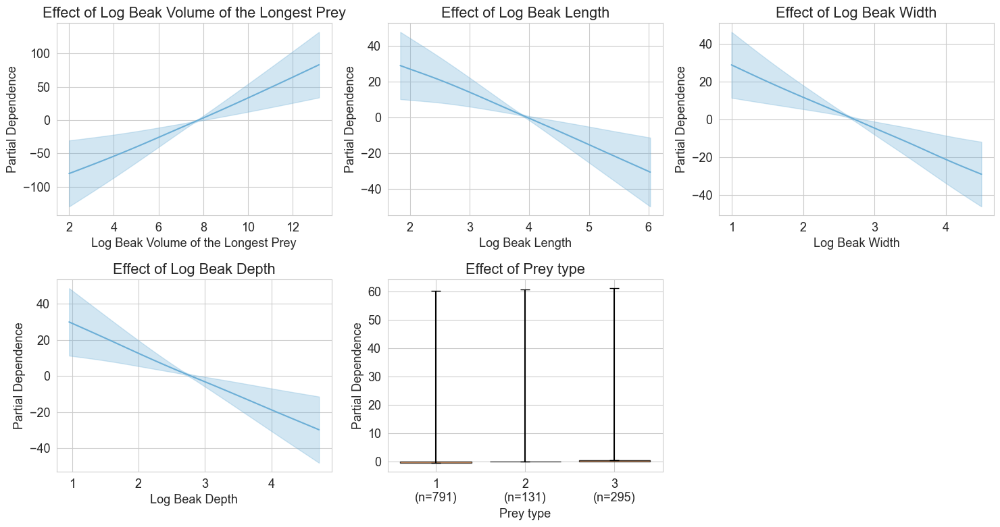

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.preprocessing import LabelEncoder

plt.rcParams["font.family"] = "Arial"
import seaborn as sns
sns.set_style("whitegrid")

# 配色
palette_cont = "#6baed6"  # 淡蓝
palette_cat = "#fd8d3c"   # 柔和橙

# 连续和分类变量
cont_predictors = ['log_Beak_volume', 'log_Beak.Length_Culmen', 
                   'log_Beak.Width', 'log_Beak.Depth']
cat_predictors = ['Size.Type']
all_predictors = cont_predictors + cat_predictors
response_vars = ['log_Size']  # 绝对体型

friendly_names = {
    'log_Beak_volume': 'Log Beak Volume of the Longest Prey',
    'log_Beak.Length_Culmen': 'Log Beak Length',
    'log_Beak.Width': 'Log Beak Width',
    'log_Beak.Depth': 'Log Beak Depth',
    'Size.Type': 'Prey type',
    'log_Size': 'Log Prey Length of the Longest Prey'
}

# -----------------------------
# 数据预处理
# -----------------------------
df_clean = df[all_predictors + ['log_Size','Size','Species.BirdTree']].copy()
df_clean = df_clean.replace([np.inf, -np.inf], np.nan).dropna(subset=['log_Size','Size']+cont_predictors+['Species.BirdTree'])

# 每物种取最长猎物
df_max_size = df_clean.loc[df_clean.groupby('Species.BirdTree')['Size'].idxmax()]

# 分类变量编码
label_encoders = {}
for var in cat_predictors:
    le = LabelEncoder()
    df_max_size[var] = le.fit_transform(df_max_size[var].astype(str))
    label_encoders[var] = le

# -----------------------------
# GAM 拟合
# -----------------------------
X = df_max_size[all_predictors].values
y = df_max_size['log_Size'].values

# 只调节连续变量的 n_splines 和 lam
terms = None
for i, var in enumerate(all_predictors):
    if var in cont_predictors:
        term = s(i, n_splines=10, lam=0.1)  # 更灵活曲线
    else:
        term = f(i)
    terms = term if terms is None else terms + term

gam = LinearGAM(terms).fit(X, y)

print(gam.summary())  # 输出模型摘要

# -----------------------------
# 绘图
# -----------------------------
n_terms = len(all_predictors)
n_cols = 3
n_rows = int(np.ceil(n_terms / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axs = axs.flatten()

for i in range(n_terms):
    ax = axs[i]
    var = all_predictors[i]
    
    if var in cont_predictors:
        XX = gam.generate_X_grid(term=i)
        pdep, confi = gam.partial_dependence(term=i, X=XX, width=0.95)
        lower = confi[:, 0]
        upper = confi[:, 1]
        ax.plot(XX[:, i], pdep, color=palette_cont)
        ax.fill_between(XX[:, i], lower, upper, color=palette_cont, alpha=0.3)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
        
    else:
        le = label_encoders[var]
        n_cats = len(le.classes_)
        XX = gam.generate_X_grid(term=i, n=n_cats)
        pdep = gam.partial_dependence(term=i, X=XX)
        confi = gam.confidence_intervals(X=XX, width=0.95)
        yerr_lower = pdep - confi[:, 0]
        yerr_upper = confi[:, 1] - pdep
        yerr_lower = np.clip(yerr_lower, 0, None)  # 防止负值报错
        yerr_upper = np.clip(yerr_upper, 0, None)
        yerr = np.vstack([yerr_lower, yerr_upper])
        
        categories = np.arange(n_cats)
        ax.bar(categories, pdep, yerr=yerr, color=palette_cat, alpha=0.7,
               edgecolor='black', capsize=5)
        counts = df_max_size[var].value_counts().sort_index()
        xticklabels = [
            f"{name}\n(n={counts.get(cat_idx,0)})"
            for cat_idx, name in enumerate(le.inverse_transform(categories))
        ]
        ax.set_xticks(categories)
        ax.set_xticklabels(xticklabels, rotation=0)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
    
    ax.set_title(f'Effect of {friendly_names.get(var,var)}')

for j in range(n_terms, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     24.1115
Link Function:                     IdentityLink Log Likelihood:                                 -1764.9141
Number of Samples:                         1217 AIC:                                             3580.0512
                                                AICc:                                            3581.1524
                                                GCV:                                                0.2716
                                                Scale:                                               0.262
                                                Pseudo R-Squared:                                   0.7417
Feature Function                  Lam

C:\Users\86186\AppData\Local\Temp\ipykernel_2344\1727849918.py:70: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())  # 输出模型摘要


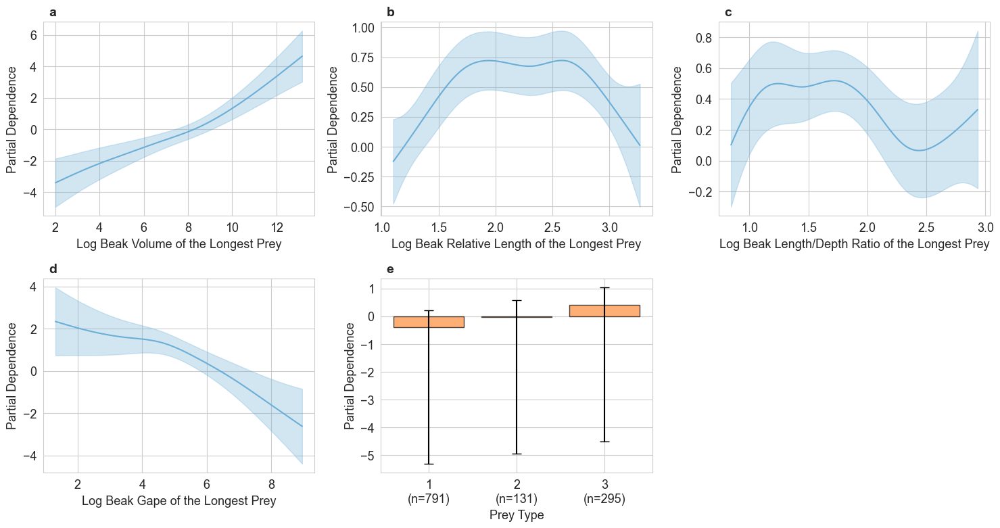

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.preprocessing import LabelEncoder

plt.rcParams["font.family"] = "Arial"
import seaborn as sns
sns.set_style("whitegrid")

# 配色
palette_cont = "#6baed6"  # 淡蓝
palette_cat = "#fd8d3c"   # 柔和橙

# 连续和分类变量
cont_predictors = [   'log_Beak_volume', 
    'log_Beak_rel_length', 
    'log_Beak_length_depth_ratio', 
    'log_Beak_gape' 
                   ]
cat_predictors = ['Size.Type']
all_predictors = cont_predictors + cat_predictors
response_vars = ['log_Size']  # 绝对体型

friendly_names = {
    'log_Beak_volume': 'Log Beak Volume of the Longest Prey',
    'log_Beak.Length_Culmen': 'Log Beak Length of the Longest Prey',
    'log_Beak_rel_length': 'Log Beak Relative Length of the Longest Prey',
    'log_Beak.Width': 'Log Beak Width of the Longest Prey',
    'log_Beak.Depth': 'Log Beak Depth of the Longest Prey',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio of the Longest Prey',
    'log_Beak_gape': 'Log Beak Gape of the Longest Prey',
    'Size.Type': 'Prey Type',
    'log_Size': 'Log Prey Length of the Longest Prey'
}

# -----------------------------
# 数据预处理
# -----------------------------
df_clean = df[all_predictors + ['log_Size','Size','Species.BirdTree']].copy()
df_clean = df_clean.replace([np.inf, -np.inf], np.nan).dropna(subset=['log_Size','Size']+cont_predictors+['Species.BirdTree'])

# 每物种取最长猎物
df_max_size = df_clean.loc[df_clean.groupby('Species.BirdTree')['Size'].idxmax()]

# 分类变量编码
label_encoders = {}
for var in cat_predictors:
    le = LabelEncoder()
    df_max_size[var] = le.fit_transform(df_max_size[var].astype(str))
    label_encoders[var] = le

# -----------------------------
# GAM 拟合
# -----------------------------
X = df_max_size[all_predictors].values
y = df_max_size['log_Size'].values

# 只调节连续变量的 n_splines 和 lam
terms = None
for i, var in enumerate(all_predictors):
    if var in cont_predictors:
        term = s(i, n_splines=10, lam=0.6)  # 更灵活曲线
    else:
        term = f(i)
    terms = term if terms is None else terms + term

gam = LinearGAM(terms).fit(X, y)

print(gam.summary())  # 输出模型摘要

# -----------------------------
# 绘图
# -----------------------------
n_terms = len(all_predictors)
n_cols = 3
n_rows = int(np.ceil(n_terms / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axs = axs.flatten()

# 用小写字母作为子图标注
import string
letters = string.ascii_lowercase

for i in range(n_terms):
    ax = axs[i]
    var = all_predictors[i]
    
    if var in cont_predictors:
        XX = gam.generate_X_grid(term=i)
        pdep, confi = gam.partial_dependence(term=i, X=XX, width=0.95)
        lower = confi[:, 0]
        upper = confi[:, 1]
        ax.plot(XX[:, i], pdep, color=palette_cont)
        ax.fill_between(XX[:, i], lower, upper, color=palette_cont, alpha=0.3)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
        
    else:
        le = label_encoders[var]
        n_cats = len(le.classes_)
        XX = gam.generate_X_grid(term=i, n=n_cats)
        pdep = gam.partial_dependence(term=i, X=XX)
        confi = gam.confidence_intervals(X=XX, width=0.95)
        yerr_lower = pdep - confi[:, 0]
        yerr_upper = confi[:, 1] - pdep
        yerr_lower = np.clip(yerr_lower, 0, None)
        yerr_upper = np.clip(yerr_upper, 0, None)
        yerr = np.vstack([yerr_lower, yerr_upper])
        
        categories = np.arange(n_cats)
        ax.bar(categories, pdep, yerr=yerr, color=palette_cat, alpha=0.7,
               edgecolor='black', capsize=5)
        counts = df_max_size[var].value_counts().sort_index()
        xticklabels = [
            f"{name}\n(n={counts.get(cat_idx,0)})"
            for cat_idx, name in enumerate(le.inverse_transform(categories))
        ]
        ax.set_xticks(categories)
        ax.set_xticklabels(xticklabels, rotation=0)
        ax.set_xlabel(friendly_names.get(var, var))
        ax.set_ylabel('Partial Dependence')
    
    # 替换标题为左上角加粗字母
    ax.text(0.02, 1.08, f"{letters[i]}", transform=ax.transAxes,
            fontsize=14, fontweight='bold', verticalalignment='top')

for j in range(n_terms, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()




===== Modeling log_Prey_rel_length =====


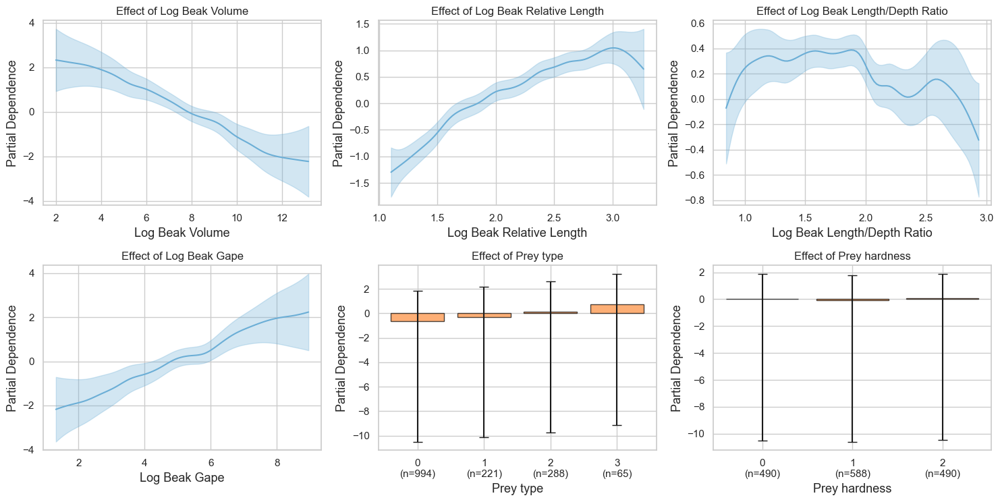


===== Modeling log_Size =====


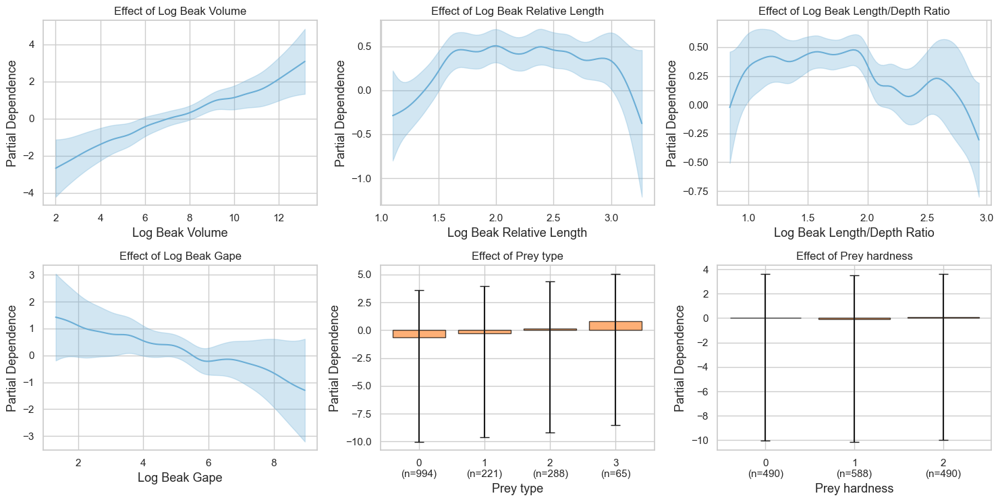

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.preprocessing import LabelEncoder

plt.rcParams["font.family"] = "Arial"
import seaborn as sns
sns.set_style("whitegrid")

# 改为小清新柔和配色
palette_cont = "#6baed6"  # 淡蓝
palette_cat = "#fd8d3c"   # 柔和橙

cont_predictors = ['log_Beak_volume', 'log_Beak_rel_length', 'log_Beak_length_depth_ratio', 'log_Beak_gape']
cat_predictors = ['Size.Type', 'Prey_Hardness']
all_predictors = cont_predictors + cat_predictors
response_vars = ['log_Prey_rel_length', 'log_Size']

friendly_names = {
    'log_Beak_volume': 'Log Beak Volume',
    'log_Beak_rel_length': 'Log Beak Relative Length',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio',
    'log_Beak_gape': 'Log Beak Gape',
    'Size.Type': 'Prey type',
    'Prey_Hardness': 'Prey hardness',
    'log_Prey_rel_length': 'Log Relative Prey Length',
    'log_Size': 'Log Prey Length'
}

df_model = df[all_predictors + response_vars].copy()
label_encoders = {}
for var in cat_predictors:
    le = LabelEncoder()
    df_model[var] = le.fit_transform(df_model[var].astype(str))
    label_encoders[var] = le

df_model = df_model.replace([np.inf, -np.inf], np.nan).dropna()

for response_var in response_vars:
    print(f"\n===== Modeling {response_var} =====")
    X = df_model[all_predictors].values
    y = df_model[response_var].values

    terms = None
    for i, var in enumerate(all_predictors):
        term = s(i) if var in cont_predictors else f(i)
        terms = term if terms is None else terms + term

    gam = LinearGAM(terms).fit(X, y)

    n_terms = len(all_predictors)
    n_cols = 3
    n_rows = int(np.ceil(n_terms / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    axs = axs.flatten()

    for i in range(n_terms):
        ax = axs[i]
        var = all_predictors[i]

        if var in cont_predictors:
            XX = gam.generate_X_grid(term=i)
            pdep, confi = gam.partial_dependence(term=i, X=XX, width=0.95)
            lower = confi[:, 0]
            upper = confi[:, 1]
            ax.plot(XX[:, i], pdep, color=palette_cont)
            ax.fill_between(XX[:, i], lower, upper, color=palette_cont, alpha=0.3)
            ax.set_xlabel(friendly_names.get(var, var))
            ax.set_ylabel('Partial Dependence')

        else:
            le = label_encoders[var]
            n_cats = len(le.classes_)
            XX = gam.generate_X_grid(term=i, n=n_cats)
            pdep = gam.partial_dependence(term=i, X=XX)
            confi = gam.confidence_intervals(X=XX, width=0.95)
            yerr_lower = pdep - confi[:, 0]
            yerr_upper = confi[:, 1] - pdep
            yerr = np.vstack([yerr_lower, yerr_upper])

            categories = np.arange(n_cats)
            ax.bar(categories, pdep, yerr=yerr, color=palette_cat, alpha=0.7,
                   edgecolor='black', capsize=5)

            counts = df_model[var].value_counts().sort_index()
            xticklabels = [
                f"{name}\n(n={counts.get(cat_idx, 0)})"
                for cat_idx, name in enumerate(le.inverse_transform(categories))
            ]
            ax.set_xticks(categories)
            ax.set_xticklabels(xticklabels, rotation=0)

            ax.set_xlabel(friendly_names.get(var, var))
            ax.set_ylabel('Partial Dependence')

        ax.set_title(f'Effect of {friendly_names.get(var, var)}')

    for j in range(n_terms, len(axs)):
        fig.delaxes(axs[j])
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
for response_var in response_vars:
    print(f"\n===== GAM Model Summary for {friendly_names.get(response_var, response_var)} =====")

    X = df_model[all_predictors].values
    y = df_model[response_var].values

    terms = None
    for i, var in enumerate(all_predictors):
        term = s(i) if var in cont_predictors else f(i)
        terms = term if terms is None else terms + term

    gam = LinearGAM(terms).fit(X, y)

    print(f"Sample size: {len(y)}")
    print(f"AIC: {gam.statistics_['AIC']:.2f}")

    pseudo_r2_dict = gam.statistics_['pseudo_r2']
    print("Pseudo R² (various types):")
    for k, v in pseudo_r2_dict.items():
        print(f"  {k}: {v:.4f}")

    print("\nVariable statistics:")
    print(f"{'Variable':<30}{'edf':>8}{'p-value':>12}")

    edof_per_term = gam.statistics_.get('edof_per_term', None)
    p_values = gam.statistics_['p_values']

    for i, var in enumerate(all_predictors):
        edf = edof_per_term[i] if edof_per_term is not None else gam.statistics_['edof']
        p_val = p_values[i]
        print(f"{friendly_names.get(var, var):<30}{edf:8.2f}{p_val:12.4g}")



===== GAM Model Summary for Log Relative Prey Length =====
Sample size: 1568
AIC: 5215.30
Pseudo R² (various types):
  explained_deviance: 0.5042
  McFadden: 0.4160
  McFadden_adj: 0.5751

Variable statistics:
Variable                           edf     p-value
Log Beak Volume                  54.23   0.0002026
Log Beak Relative Length         54.23    1.11e-16
Log Beak Length/Depth Ratio      54.23   0.0001798
Log Beak Gape                    54.23     0.00284
Prey type                        54.23    1.11e-16
Prey hardness                    54.23   0.0001231

===== GAM Model Summary for Log Prey Length =====
Sample size: 1568
AIC: 4581.65
Pseudo R² (various types):
  explained_deviance: 0.7201
  McFadden: 0.2304
  McFadden_adj: 0.7640

Variable statistics:
Variable                           edf     p-value
Log Beak Volume                  54.23    0.001234
Log Beak Relative Length         54.23     0.00102
Log Beak Length/Depth Ratio      54.23    0.000313
Log Beak Gape             

# 极端捕食者

## 对比极端普通

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other vs. Extreme: t-test independent samples with Benjamini-Hochberg correction, P_val:8.575e-32 t=-1.200e+01


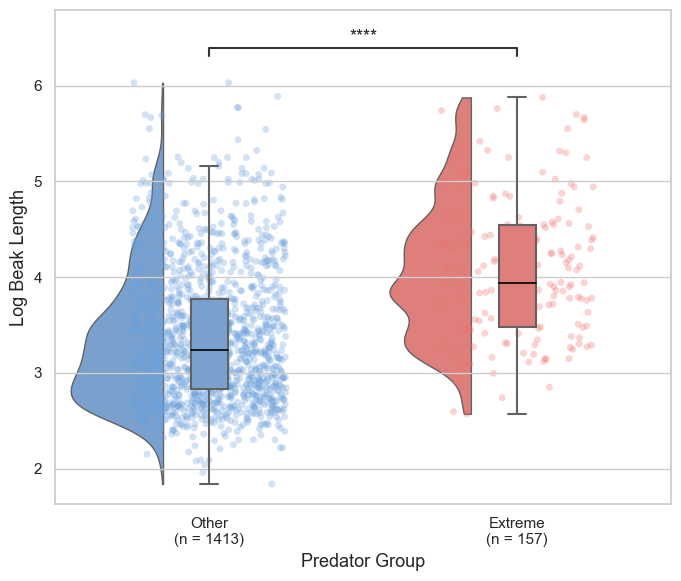

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other vs. Extreme: t-test independent samples with Benjamini-Hochberg correction, P_val:1.544e-33 t=-1.236e+01


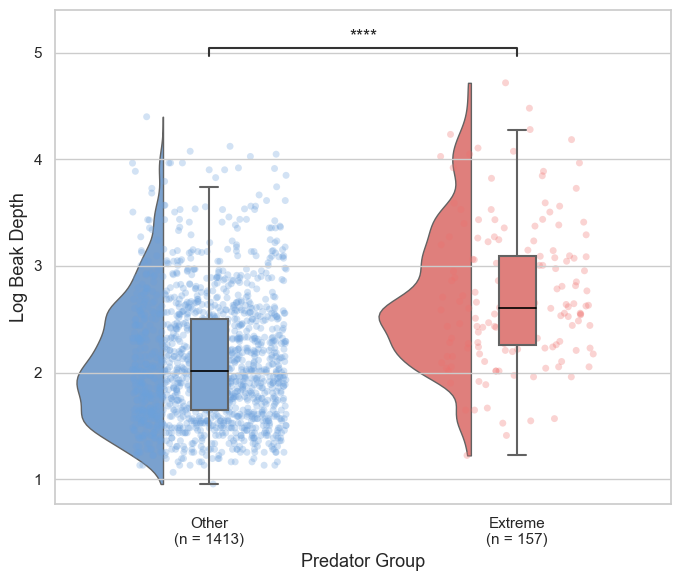

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other vs. Extreme: t-test independent samples with Benjamini-Hochberg correction, P_val:6.203e-27 t=-1.095e+01


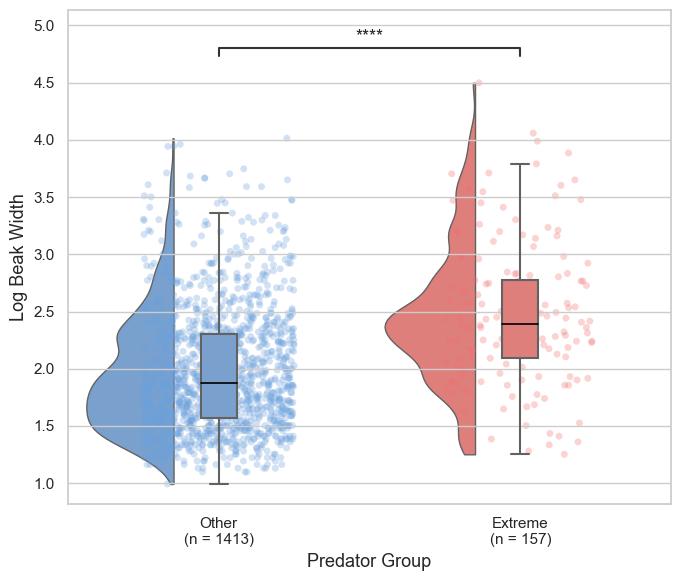

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other vs. Extreme: t-test independent samples with Benjamini-Hochberg correction, P_val:1.584e-33 t=-1.235e+01


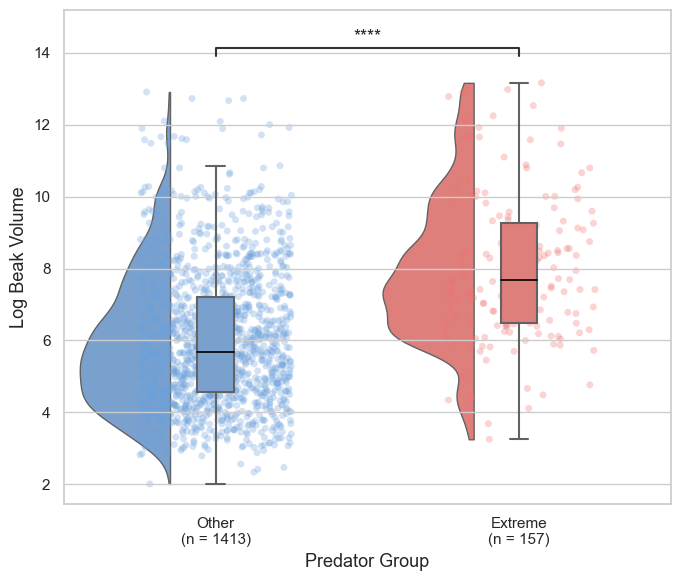

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other vs. Extreme: t-test independent samples with Benjamini-Hochberg correction, P_val:4.283e-31 t=-1.185e+01


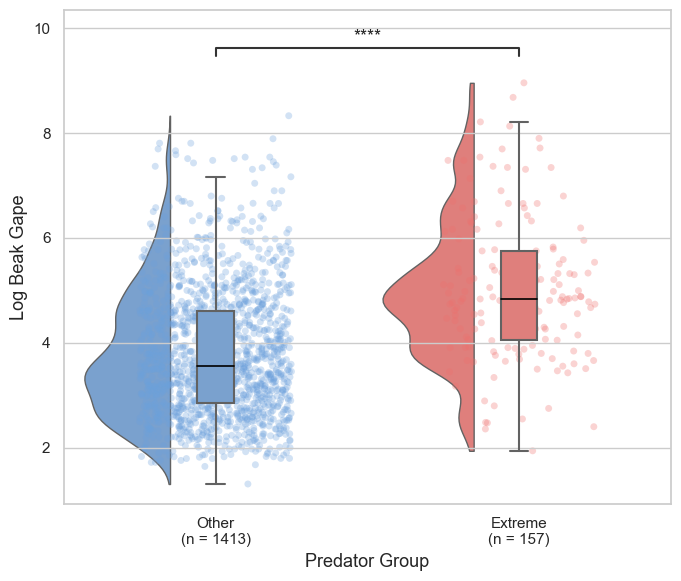

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other vs. Extreme: t-test independent samples with Benjamini-Hochberg correction, P_val:2.453e-01 t=-1.162e+00


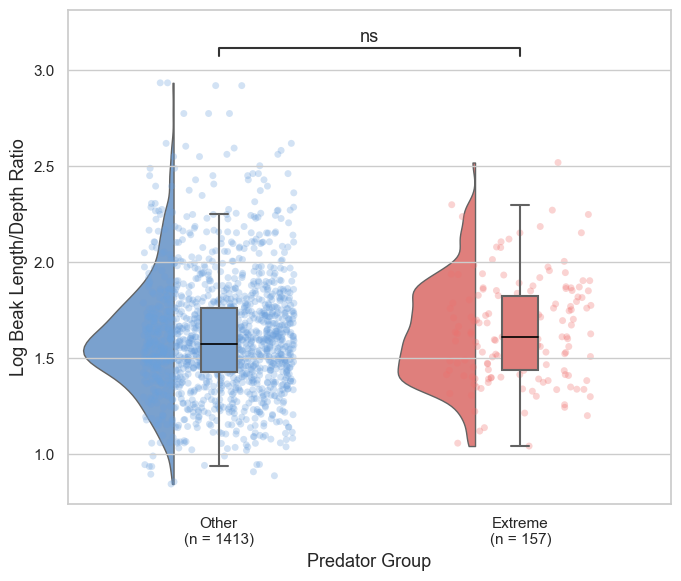

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other vs. Extreme: t-test independent samples with Benjamini-Hochberg correction, P_val:2.075e-30 t=-1.171e+01


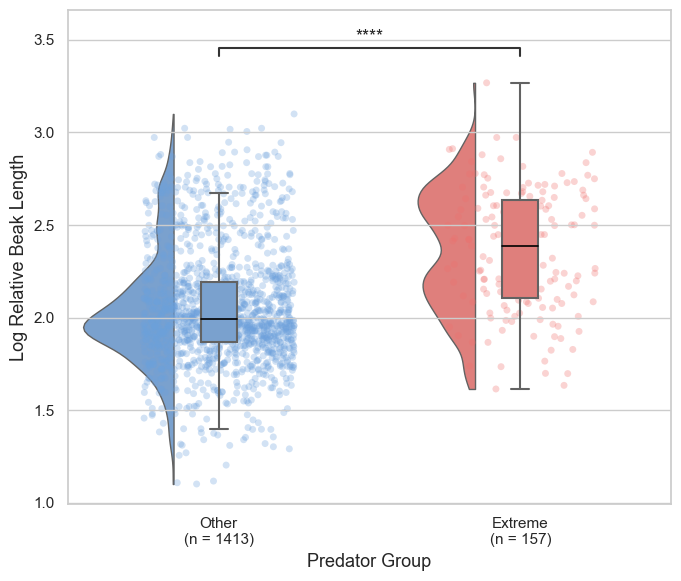

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import ptitprince as pt
from statannotations.Annotator import Annotator

# ==== 设置图形风格 ====
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 13

# ==== 变量定义 ====
plot_vars = {
    'log_Beak.Length_Culmen': "Log Beak Length",
    'log_Beak.Depth': 'Log Beak Depth',
    'log_Beak.Width': 'Log Beak Width',
    'log_Beak_volume': 'Log Beak Volume',
    'log_Beak_gape': 'Log Beak Gape',
    'log_Beak_length_depth_ratio': 'Log Beak Length/Depth Ratio',
    'log_Beak_rel_length': 'Log Relative Beak Length'  # 新增变量
}

# 小清新红蓝色调
group_palette = {"Extreme": "#ef6f6c", "Other": "#6ca0dc"}
group_order = ["Other", "Extreme"]

# ==== 筛选前 10% 极端捕食者 ====
threshold = df['log_Prey_rel_length'].quantile(0.9)
df_plot = df.copy()
df_plot['Group'] = df_plot['log_Prey_rel_length'].apply(
    lambda x: 'Extreme' if x >= threshold else 'Other'
)

# 保证 Group 为有序分类
df_plot['Group'] = pd.Categorical(df_plot['Group'], categories=group_order, ordered=True)

# ==== 循环绘图 ====
for var, label in plot_vars.items():
    sample_counts = df_plot.groupby('Group')[var].count()
    xtick_labels = [f"{grp}\n(n = {sample_counts.get(grp, 0)})" for grp in group_order]

    plt.figure(figsize=(7, 6))
    ax = plt.gca()

    # 半小提琴图
    pt.half_violinplot(
        x='Group', y=var, data=df_plot,
        palette=group_palette, bw=.2, cut=0., scale="area",
        width=.6, inner=None, orient="v", linewidth=1,
        order=group_order, ax=ax, zorder=-1
    )

    # 箱线图
    sns.boxplot(
        x='Group', y=var, data=df_plot,
        order=group_order, palette=group_palette, width=.12,
        showcaps=True,
        boxprops={"zorder": 10},
        whiskerprops={"linewidth": 1.5, "zorder": 10},
        medianprops={"color": "black", "linewidth": 1.2},
        showfliers=False, zorder=10
    )

    # 散点图
    sns.stripplot(
        x='Group', y=var, data=df_plot,
        order=group_order, palette=group_palette,
        jitter=0.25, alpha=0.3, zorder=0
    )

    # 显著性检验
    comparisons = [("Other", "Extreme")]
    annotator = Annotator(ax, comparisons, data=df_plot,
                          x='Group', y=var, order=group_order)
    annotator.configure(test='t-test_ind', text_format='star',
                        loc='inside', comparisons_correction="fdr_bh")
    annotator.apply_and_annotate()

    # 标签设置
    ax.set_xticklabels(xtick_labels)
    plt.xlabel("Predator Group")
    plt.ylabel(label)
    plt.tight_layout()
    plt.show()


## 对比硬度

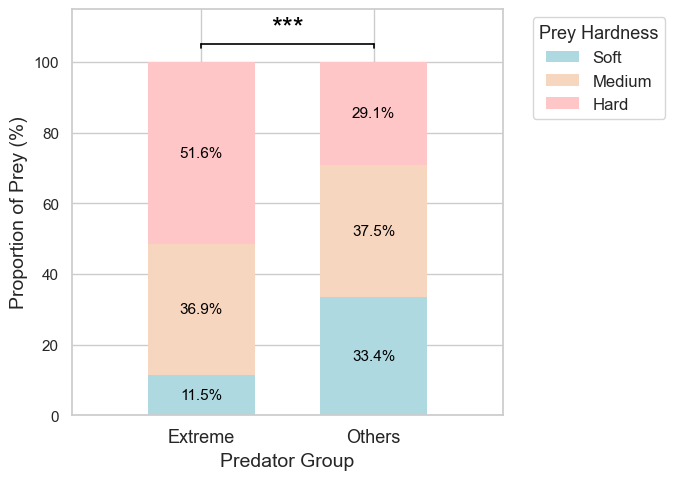

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
import numpy as np

plt.rcParams["font.family"] = "Arial"

# 假设 df 已定义

threshold = df['log_Prey_rel_length'].quantile(0.9)
df['Group'] = df['log_Prey_rel_length'].apply(lambda x: 'Extreme' if x >= threshold else 'Others')

count_df = df.groupby(['Group', 'Prey_Hardness']).size().reset_index(name='Count')
group_totals = count_df.groupby('Group')['Count'].transform('sum')
count_df['Proportion'] = count_df['Count'] / group_totals * 100

pivot_df = count_df.pivot(index='Prey_Hardness', columns='Group', values='Proportion').fillna(0)
pivot_df = pivot_df.loc[['Soft', 'Medium', 'Hard']]

hardness_colors = {
    'Soft': "#AED9E0",   # 浅青蓝
    'Medium': "#F7D6BF", # 浅杏橘
    'Hard': "#FFC6C7",   # 浅粉红
}

fig, ax = plt.subplots(figsize=(7,5))

x = [0.3, 0.7]
bar_width = 0.25

bottom = np.zeros(len(x))
for hardness in pivot_df.index:
    values = pivot_df.loc[hardness]
    ax.bar(x, values, bottom=bottom, label=hardness, width=bar_width, color=hardness_colors[hardness], edgecolor='none')
    bottom += values.values

ax.set_xticks(x)
ax.set_xticklabels(pivot_df.columns, fontsize=13)
ax.set_xlim(0, 1)  # 左右空白大
ax.set_ylabel('Proportion of Prey (%)', fontsize=14)
ax.set_xlabel('Predator Group', fontsize=14)

ax.legend(title='Prey Hardness', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=13)

contingency_table = pd.crosstab(df['Group'], df['Prey_Hardness']).reindex(index=['Others', 'Extreme'], columns=['Soft', 'Medium', 'Hard']).fillna(0)
chi2, p, _, _ = chi2_contingency(contingency_table)

if p < 0.001:
    star = "***"
elif p < 0.01:
    star = "**"
elif p < 0.05:
    star = "*"
else:
    star = ""

if star:
    ymax = bottom.max()
    line_y = ymax + 5
    ax.plot([x[0], x[0]], [line_y - 1, line_y], color='black', linewidth=1.2)
    ax.plot([x[1], x[1]], [line_y - 1, line_y], color='black', linewidth=1.2)
    ax.plot([x[0], x[1]], [line_y, line_y], color='black', linewidth=1.2)
    ax.text((x[0]+x[1])/2, line_y + 0.8, star, ha='center', va='bottom', fontsize=20, color='black')

bottom = np.zeros(len(x))
for hardness in pivot_df.index:
    values = pivot_df.loc[hardness]
    for i, val in enumerate(values):
        if val > 3:
            ax.text(x[i], bottom[i] + val/2, f"{val:.1f}%", ha='center', va='center', color='black', fontsize=11)
    bottom += values.values

plt.ylim(0, 115)
plt.tight_layout()
plt.show()


# 预测硬度

In [ ]:
import numpy as np
import pandas as pd
from statsmodels.miscmodels.ordinal_model import OrderedModel
# 1. 定义映射字典（有序！）
hardness_mapping = {
    'Soft': 0,
    'Medium': 1,
    'Hard': 2
}

# 2. 映射有序变量
df['Prey_Hardness_ord'] = df['Prey_Hardness'].map(hardness_mapping)

# 1. 选取多元变量和响应变量，清理缺失和无穷值
features = ['log_Beak.Length_Culmen', 'log_Beak.Depth', 'log_Beak.Width', 'log_Beak_volume']
subset = df[features + ['Prey_Hardness_ord']].replace([np.inf, -np.inf], np.nan).dropna()

X_multi = subset[features]
y_multi = subset['Prey_Hardness_ord']

# 2. 建立多元有序Logistic回归模型
model_multi = OrderedModel(y_multi, X_multi, distr='logit')

# 3. 拟合模型
res_multi = model_multi.fit(method='bfgs', disp=True)

# 4. 打印结果
print(res_multi.summary())

# 5. 可以根据需要提取AIC、LogLik等指标
print(f"AIC: {res_multi.aic:.2f}, Log-Likelihood: {res_multi.llf:.2f}")


Optimization terminated successfully.
         Current function value: 0.921779
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
                             OrderedModel Results                             
Dep. Variable:      Prey_Hardness_ord   Log-Likelihood:                -1447.2
Model:                   OrderedModel   AIC:                             2906.
Method:            Maximum Likelihood   BIC:                             2939.
Date:                Tue, 05 Aug 2025                                         
Time:                        22:07:24                                         
No. Observations:                1570                                         
Df Residuals:                    1564                                         
Df Model:                           4                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------

C:\Users\86186\AppData\Local\Temp\ipykernel_17820\4226140868.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(features, fontname="Arial")


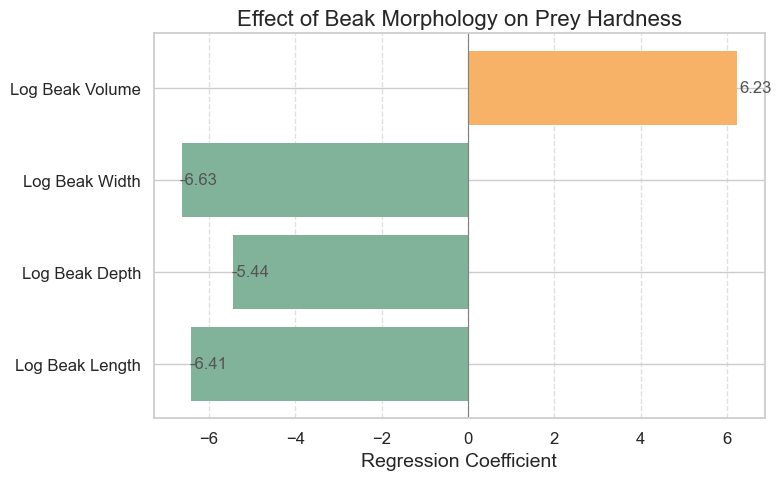

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

coef = res_multi.params[:-2]  # 去掉最后两个cutpoints
features = ["Log Beak Length", "Log Beak Depth", "Log Beak Width", "Log Beak Volume"]

colors = ['#F7B267' if c > 0 else '#81B29A' for c in coef]

plt.figure(figsize=(8,5))
bars = plt.barh(features, coef, color=colors, edgecolor='none')

plt.axvline(0, color='gray', linewidth=0.8)

plt.xlabel("Regression Coefficient", fontsize=14)
title_obj = plt.title("Effect of Beak Morphology on Prey Hardness", fontsize=16)
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.gca().set_yticklabels(features, fontname="Arial")
plt.gca().xaxis.label.set_fontname("Arial")
title_obj.set_fontname("Arial")  # 这样设置字体

for bar in bars:
    w = bar.get_width()
    plt.text(w + 0.05 * np.sign(w), bar.get_y() + bar.get_height()/2,
             f"{w:.2f}", va='center', fontsize=12, fontname="Arial",
             color='#555555')

plt.tight_layout()
plt.show()

